In [ ]:
import numpy as np
from sklearn.utils import shuffle
import torch
import xarray as xr
from scipy.signal import detrend
import netCDF4 as nc
import numpy as np

def get_datalists(path, N=25):

    train_X, train_Y = [], []
    test_X, test_Y = [], []
    val_X, val_Y = [], []

    trY_SST_ds = xr.open_dataset(path, engine="netcdf4")
    trY_SST_ds = trY_SST_ds.fillna(0)

    print(trY_SST_ds)

    for i in range(N):
        trY_SST = trY_SST_ds['sst'].values[i:i+1]

        print(f"{i+1}th Data Loaded...")


        trY_SST_detrended = detrend(trY_SST, axis=1)

        trY_SST = torch.tensor(trY_SST_detrended.reshape(trY_SST.shape[0],1980,48,144))

        trY_SST_train = trY_SST[:,:1680]
        trY_SST_test = trY_SST[0,1680:]

        X_train = trY_SST_train[:,:-1,:,:].squeeze(0).unsqueeze(1)
        Y_train = trY_SST_train[:,1:,:,:].squeeze(0).unsqueeze(1)
        train_X.append(X_train)
        train_Y.append(Y_train)

        X_test = trY_SST_test[:-1,:,:]
        Y_test = trY_SST_test[1:,:,:]

        X_valid = X_test[199:].unsqueeze(1)
        Y_valid = Y_test[199:].unsqueeze(1)
        val_X.append(X_valid)
        val_Y.append(Y_valid)

        X_test = X_test[:199, :, :].unsqueeze(1)
        Y_test = Y_test[:199, :, :].unsqueeze(1)
        test_X.append(X_test)
        test_Y.append(Y_test)

    return train_X, train_Y, test_X, test_Y, val_X, val_Y

In [ ]:
path_1 = "/content/drive/MyDrive/SST_Data/GISS-E2-1-H_historical_1850_2014.nc"
train_X, train_Y, test_X, test_Y, val_X, val_Y = get_datalists(path_1, N=10)

<xarray.Dataset> Size: 3GB
Dimensions:   (ensemble: 25, years: 165, mon: 12, lat: 48, lon: 144)
Coordinates:
  * ensemble  (ensemble) <U41 4kB 'tos_Omon_GISS-E2-1-H_historical_r10i1p1f1'...
  * years     (years) int32 660B 1850 1851 1852 1853 ... 2011 2012 2013 2014
  * mon       (mon) int32 48B 0 1 2 3 4 5 6 7 8 9 10 11
  * lat       (lat) float64 384B -88.12 -84.38 -80.62 ... 80.62 84.38 88.12
  * lon       (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
Data variables:
    sst       (ensemble, years, mon, lat, lon) float64 3GB 0.0 0.0 ... -1.732
1th Data Loaded...
2th Data Loaded...
3th Data Loaded...
4th Data Loaded...
5th Data Loaded...
6th Data Loaded...
7th Data Loaded...
8th Data Loaded...
9th Data Loaded...
10th Data Loaded...


In [ ]:
len(train_X), len(test_X), len(val_X)
train_X[0].shape, test_X[0].shape, val_X[0].shape

(torch.Size([1679, 1, 48, 144]),
 torch.Size([199, 1, 48, 144]),
 torch.Size([100, 1, 48, 144]))

In [ ]:
df=nc.Dataset(path_1)

mask=1-df.variables['sst'][0,0,0,:,:].mask

lat_sst=df.variables['lat'][:]
lon_sst=df.variables['lon'][:]

In [ ]:
from torch.utils.data import Dataset

class SeqSSTDataset(Dataset):

    def __init__(self, X, Y):
        self.X = X.float()
        self.Y = Y.float()

    def __len__(self):
        return self.X.shape[0]

    def __getitem__(self, idx):
        return self.X[idx], self.Y[idx]

In [ ]:
from torch.utils.data import DataLoader

batch_size = 64

train_loaders = []
val_loaders   = []
test_loaders  = []

for i in range(len(train_X)):

    train_dataset = SeqSSTDataset(train_X[i], train_Y[i])
    train_loaders.append(
        DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    )

    val_dataset = SeqSSTDataset(val_X[i], val_Y[i])
    val_loaders.append(
        DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    )

    test_dataset = SeqSSTDataset(test_X[i], test_Y[i])
    test_loaders.append(
        DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
    )

In [ ]:
print("Total training samples:", len(train_dataset))

Total training samples: 1679


In [ ]:
print("Total validation samples:", len(val_dataset))
print("Total test samples:", len(test_dataset))

Total validation samples: 100
Total test samples: 199


In [ ]:
if device.type == "cuda":
    print("Using GPU (cuda cores)\n")
else:
    print("Using CPU\n")

Using GPU (cuda cores)



In [ ]:
save_dir = "/content/drive/MyDrive/SST_Data/SeqVAE_Checkpoints"
os.makedirs(save_dir, exist_ok=True)

In [ ]:
best_val_loss = float("inf")
best_epoch = -1

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import numpy as np
import math


# ---------------------------------------------------------------------------
# Positional Encoding for Transformer
# ---------------------------------------------------------------------------

class PositionalEncoding(nn.Module):
    """Sinusoidal positional encoding for Transformer."""
    def __init__(self, latent_dim, max_len=100):
        super().__init__()

        pe = torch.zeros(max_len, latent_dim)
        position = torch.arange(0, max_len, dtype=torch.float32).unsqueeze(1)
        div_term = torch.exp(
            torch.arange(0, latent_dim, 2, dtype=torch.float32) *
            (-math.log(10000.0) / latent_dim)
        )

        pe[:, 0::2] = torch.sin(position * div_term)


        cos_part = torch.cos(position * div_term)
        if latent_dim % 2 == 1:
            pe[:, 1::2] = cos_part[:, :-1]
        else:
            pe[:, 1::2] = cos_part


        self.register_buffer('pe', pe.unsqueeze(0))

    def forward(self, x):
        """
        Args:
            x: (batch_size, seq_len, latent_dim)
        Returns:
            x with positional encoding added.
        """
        seq_len = x.size(1)
        return x + self.pe[:, :seq_len, :]


# ---------------------------------------------------------------------------
# Encoder
# ---------------------------------------------------------------------------

class SeqEncoder(nn.Module):
    """Encodes x_t to posterior distribution parameters q(z_t | x_t)."""
    def __init__(self, latent_dim=128):
        super().__init__()

        self.conv = nn.Sequential(
            nn.Conv2d(1, 64, 4, 2, 1),   # (1, 48, 144) -> (64, 24, 72)
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 128, 4, 2, 1), # (64, 24, 72) -> (128, 12, 36)
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 256, 4, 2, 1),# (128, 12, 36) -> (256, 6, 18)
            nn.BatchNorm2d(256),
            nn.ReLU(),
        )

        self.flattened_size = 256 * 6 * 18  # 256 * 6 * 18 = 27648
        self.latent_dim = latent_dim

        self.fc_mu = nn.Linear(self.flattened_size, latent_dim)
        self.fc_logvar = nn.Linear(self.flattened_size, latent_dim)

    def forward(self, x_t):
        """
        Args:
            x_t: (batch_size, 1, 48, 144)
        Returns:
            mu, logvar: (batch_size, latent_dim)
        """
        x = self.conv(x_t)
        x = x.view(x.size(0), -1)
        mu = self.fc_mu(x)
        logvar = self.fc_logvar(x)
        return mu, logvar


# ---------------------------------------------------------------------------
# Prior Network with Transformer
# ---------------------------------------------------------------------------

class PriorNetwork(nn.Module):
    """Learns p(z_t | z_{t-1},...,z_{t-T}, x_{t-1}) using a Transformer."""
    def __init__(self, latent_dim=128, history_steps=5, num_heads=4, num_layers=2):
        super().__init__()
        self.latent_dim = latent_dim
        self.history_steps = history_steps


        self.pos_encoding = PositionalEncoding(latent_dim, max_len=history_steps)


        encoder_layer = nn.TransformerEncoderLayer(
            d_model=latent_dim,
            nhead=num_heads,
            dim_feedforward=256,
            dropout=0.1,
            batch_first=True,
            activation='relu'
        )
        self.transformer_encoder = nn.TransformerEncoder(
            encoder_layer,
            num_layers=num_layers,
            norm=nn.LayerNorm(latent_dim)
        )


        self.conv = nn.Sequential(
            nn.Conv2d(1, 32, 4, 2, 1),
            nn.ReLU(),
            nn.Conv2d(32, 64, 4, 2, 1),
            nn.ReLU(),
        )


        self.conv_out_h = 12
        self.conv_out_w = 36
        self.conv_out_channels = 64
        self.conv_out_size = self.conv_out_channels * self.conv_out_h * self.conv_out_w

        combined_size = latent_dim + self.conv_out_size

        self.fc = nn.Sequential(
            nn.Linear(combined_size, 256),
            nn.ReLU(),
            nn.Linear(256, 256),
            nn.ReLU(),
        )

        self.fc_mu = nn.Linear(256, latent_dim)
        self.fc_logvar = nn.Linear(256, latent_dim)

    def forward(self, z_history, x_prev):
        """
        Args:
            z_history: (batch_size, history_steps, latent_dim)
            x_prev:    (batch_size, 1, 48, 144)
        Returns:
            prior_mu, prior_logvar: (batch_size, latent_dim)
        """

        z_history_encoded = self.pos_encoding(z_history)
        transformer_out = self.transformer_encoder(z_history_encoded)
        transformer_features = transformer_out[:, -1, :]


        x_features = self.conv(x_prev)
        x_features = x_features.view(x_features.size(0), -1)
        assert x_features.size(1) == self.conv_out_size, (
            f"Expected conv_out_size {self.conv_out_size}, "
            f"got {x_features.size(1)}. Check conv_out_size."
        )

        # Combine
        combined = torch.cat([transformer_features, x_features], dim=1)
        hidden = self.fc(combined)

        prior_mu = self.fc_mu(hidden)
        prior_logvar = self.fc_logvar(hidden)

        return prior_mu, prior_logvar


# ---------------------------------------------------------------------------
# Decoder
# ---------------------------------------------------------------------------

class SeqDecoder(nn.Module):
    """Decodes z_t to reconstruct x_t."""
    def __init__(self, latent_dim=128):
        super().__init__()

        self.fc = nn.Linear(latent_dim, 256 * 6 * 18)

        self.deconv = nn.Sequential(
            nn.ConvTranspose2d(256, 128, 4, 2, 1),  # (256, 6, 18) -> (128, 12, 36)
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, 4, 2, 1),   # (128, 12, 36) -> (64, 24, 72)
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 1, 4, 2, 1),     # (64, 24, 72) -> (1, 48, 144)
        )

    def forward(self, z_t):
        """
        Args:
            z_t: (batch_size, latent_dim)
        Returns:
            recon: (batch_size, 1, 48, 144)
        """
        x = self.fc(z_t)
        x = x.view(-1, 256, 6, 18)
        x = self.deconv(x)
        return x


# ---------------------------------------------------------------------------
# Sequential VAE
# ---------------------------------------------------------------------------

class SequentialVAE(nn.Module):
    """Sequential VAE with Transformer-based conditioned prior."""
    def __init__(self, latent_dim=128, history_steps=5, num_heads=4, num_layers=2):
        super().__init__()
        self.latent_dim = latent_dim
        self.history_steps = history_steps

        self.encoder = SeqEncoder(latent_dim)
        self.prior_net = PriorNetwork(
            latent_dim=latent_dim,
            history_steps=history_steps,
            num_heads=num_heads,
            num_layers=num_layers
        )
        self.decoder = SeqDecoder(latent_dim)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x_t, z_history, x_prev):
        """
        Args:
            x_t:       (batch_size, 1, 48, 144)
            z_history: (batch_size, history_steps, latent_dim)
            x_prev:    (batch_size, 1, 48, 144)
        Returns:
            recon, posterior_mu, posterior_logvar, prior_mu, prior_logvar, z_t
        """
        posterior_mu, posterior_logvar = self.encoder(x_t)
        prior_mu, prior_logvar = self.prior_net(z_history, x_prev)

        z_t = self.reparameterize(posterior_mu, posterior_logvar)
        recon = self.decoder(z_t)

        return recon, posterior_mu, posterior_logvar, prior_mu, prior_logvar, z_t


# ---------------------------------------------------------------------------
# Loss
# ---------------------------------------------------------------------------

def vae_loss(recon, target, posterior_mu, posterior_logvar, prior_mu, prior_logvar, beta=0.01):
    """
    Args:
        recon: reconstructed x_t          (B, 1, 48, 144)
        target: ground-truth x_t          (B, 1, 48, 144)
        posterior_mu, posterior_logvar:   q(z_t | x_t) parameters (B, D)
        prior_mu, prior_logvar:           p(z_t | history)       (B, D)
        beta: KL weight
    Returns:
        total_loss, recon_loss, kl_loss
    """
    # Reconstruction loss
    recon_loss = F.mse_loss(recon, target)


    var_q = torch.exp(posterior_logvar)
    var_p = torch.exp(prior_logvar)

    kl_loss = -0.5 * torch.mean(
        1 + posterior_logvar - prior_logvar
        - (var_q + (posterior_mu - prior_mu).pow(2)) / var_p
    )

    total_loss = recon_loss + beta * kl_loss
    return total_loss, recon_loss, kl_loss

In [ ]:
class SequentialSSTDataset(Dataset):
    """Dataset that provides sequences with history."""
    def __init__(self, X, history_steps=5):
        """
        Args:
            X: tensor of shape (num_timesteps, 1, 48, 144)
            history_steps: number of past timesteps to include
        """
        self.X = X.float()
        self.history_steps = history_steps
        self.num_timesteps = X.shape[0]

    def __len__(self):

        return max(0, self.num_timesteps - self.history_steps - 1)

    def __getitem__(self, idx):
        """
        Returns:
            x_t: current frame x_t          (1, 48, 144)
            x_prev: previous frame x_{t-1} (1, 48, 144)
            z_history_indices: list of indices [t-history_steps, ..., t-1]
            t: current time index
        """
        t = idx + self.history_steps

        x_t = self.X[t]
        x_prev = self.X[t - 1]

        z_history_indices = list(range(t - self.history_steps, t))

        return x_t, x_prev, z_history_indices, t


# ---------------------------------------------------------------------------
# Training Loop
# ---------------------------------------------------------------------------

def train_sequential_vae(
    model,
    train_loaders,
    val_loaders,
    num_epochs=150,
    device='cuda',
    beta=0.01,
    save_dir='./checkpoints'
):
    """
    Training loop for Sequential VAE with Transformer prior.
    """
    import os
    os.makedirs(save_dir, exist_ok=True)

    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', factor=0.5, patience=10
    )

    best_val_loss = float('inf')
    train_loss_epochwise = []
    val_loss_epochwise = []

    for epoch in range(num_epochs):
        model.train()

        t_total, t_recon, t_kl = 0.0, 0.0, 0.0
        total_samples = 0


        for ensemble_idx, train_loader in enumerate(train_loaders):
            z_sequence = []

            for x_t, x_prev, z_history_indices, t_idx in train_loader:
                x_t = x_t.to(device)
                x_prev = x_prev.to(device)

                batch_size = x_t.size(0)
                history_steps = model.history_steps


                if z_sequence and len(z_sequence) >= history_steps:

                    z_hist = torch.stack(z_sequence[-history_steps:], dim=1)

                    if z_hist.size(0) != batch_size:
                        z_hist = z_hist[0:1].expand(batch_size, -1, -1)
                else:
                    z_hist = torch.zeros(
                        batch_size, history_steps, model.latent_dim,
                        device=device
                    )

                recon, post_mu, post_logvar, prior_mu, prior_logvar, z_t = model(
                    x_t, z_hist, x_prev
                )

                loss, recon_loss, kl_loss = vae_loss(
                    recon, x_t, post_mu, post_logvar,
                    prior_mu, prior_logvar, beta=beta
                )

                optimizer.zero_grad()
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
                optimizer.step()

                z_sequence.append(z_t.detach())

                bs = batch_size
                t_total += loss.item() * bs
                t_recon += recon_loss.item() * bs
                t_kl += kl_loss.item() * bs
                total_samples += bs

        t_total /= total_samples
        t_recon /= total_samples
        t_kl /= total_samples


        model.eval()
        v_total, v_recon, v_kl = 0.0, 0.0, 0.0
        val_samples = 0

        with torch.no_grad():
            for ensemble_idx, val_loader in enumerate(val_loaders):
                z_sequence = []

                for x_t, x_prev, z_history_indices, t_idx in val_loader:
                    x_t = x_t.to(device)
                    x_prev = x_prev.to(device)

                    batch_size = x_t.size(0)
                    history_steps = model.history_steps

                    if z_sequence and len(z_sequence) >= history_steps:
                        z_hist = torch.stack(z_sequence[-history_steps:], dim=1)
                        if z_hist.size(0) != batch_size:
                            z_hist = z_hist[0:1].expand(batch_size, -1, -1)
                    else:
                        z_hist = torch.zeros(
                            batch_size, history_steps, model.latent_dim,
                            device=device
                        )

                    recon, post_mu, post_logvar, prior_mu, prior_logvar, z_t = model(
                        x_t, z_hist, x_prev
                    )

                    loss, recon_loss, kl_loss = vae_loss(
                        recon, x_t, post_mu, post_logvar,
                        prior_mu, prior_logvar, beta=beta
                    )

                    z_sequence.append(z_t)

                    bs = batch_size
                    v_total += loss.item() * bs
                    v_recon += recon_loss.item() * bs
                    v_kl += kl_loss.item() * bs
                    val_samples += bs

        v_total /= val_samples
        v_recon /= val_samples
        v_kl /= val_samples

        train_loss_epochwise.append(t_total)
        val_loss_epochwise.append(v_total)

        print(
            f"Epoch {epoch:03d} | "
            f"Train: {t_total:.6f} (Recon {t_recon:.6f}, KL {t_kl:.6f}) | "
            f"Val: {v_total:.6f} (Recon {v_recon:.6f}, KL {v_kl:.6f})"
        )


        if v_total < best_val_loss:
            best_val_loss = v_total
            checkpoint = {
                "epoch": epoch,
                "model_state_dict": model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "train_loss": train_loss_epochwise,
                "val_loss": val_loss_epochwise,
                "best_val_loss": best_val_loss
            }
            torch.save(checkpoint, os.path.join(save_dir, "best_seqvae_model.pt"))
            print(f"✓ Saved BEST model at epoch {epoch} (Val Loss: {v_total:.6f})")

        scheduler.step(v_total)

    return model, train_loss_epochwise, val_loss_epochwise

In [ ]:
import torch
import os
from google.colab import drive


drive.mount('/content/drive')

if __name__ == "__main__":

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    history_steps = 5
    latent_dim = 256
    num_heads = 8
    num_layers = 3
    batch_size = 64
    num_epochs = 150
    beta = 0.01

    train_datasets = [
        SequentialSSTDataset(train_X[i], history_steps)
        for i in range(len(train_X))
    ]

    val_datasets = [
        SequentialSSTDataset(val_X[i], history_steps)
        for i in range(len(val_X))
    ]

    train_loaders = [
        DataLoader(ds, batch_size=batch_size, shuffle=True)
        for ds in train_datasets
    ]

    val_loaders = [
        DataLoader(ds, batch_size=batch_size, shuffle=False)
        for ds in val_datasets
    ]

    model = SequentialVAE(
        latent_dim=latent_dim,
        history_steps=history_steps,
        num_heads=num_heads,
        num_layers=num_layers
    ).to(device)

    model, train_losses, val_losses = train_sequential_vae(
        model,
        train_loaders,
        val_loaders,
        num_epochs=num_epochs,
        device=device,
        beta=beta,
        save_dir='./checkpoints'
    )

    print("Training finished.")


    save_dir = "/content/drive/MyDrive/VAE_Output"
    os.makedirs(save_dir, exist_ok=True)

    save_model_path = os.path.join(save_dir, "final_seqvae_model.pt")

    torch.save({
        "model_state_dict": model.state_dict(),
        "train_losses": train_losses,
        "val_losses": val_losses,
        "latent_dim": latent_dim,
        "history_steps": history_steps,
        "num_heads": num_heads,
        "num_layers": num_layers
    }, save_model_path)

    print(f"Model saved successfully to: {save_model_path}")

In [ ]:
    history_steps = 5
    latent_dim = 256
    num_heads = 8
    num_layers = 3
    batch_size = 64
    num_epochs = 150
    beta = 0.01

In [ ]:
config = {
    "latent_dim": 256,
    "history_steps": 5,
    "num_heads": 8,
    "num_layers": 3,
    "learning_rate": 1e-3,
    "batch_size": 64,
    "num_epochs": num_epochs
}

torch.save(config, os.path.join(save_dir, "config.pt"))

In [ ]:
from google.colab import drive
import torch


drive.mount('/content/drive')

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


checkpoint_path = "/content/drive/MyDrive/VAE_Output/final_seqvae_model.pt"


checkpoint = torch.load(checkpoint_path, map_location=device)


model = SequentialVAE(
    latent_dim=checkpoint["latent_dim"],
    history_steps=checkpoint["history_steps"],
    num_heads=checkpoint["num_heads"],
    num_layers=checkpoint["num_layers"]
).to(device)


model.load_state_dict(checkpoint["model_state_dict"])


model.eval()

print("Model loaded successfully from:", checkpoint_path)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Model loaded successfully from: /content/drive/MyDrive/VAE_Output/final_seqvae_model.pt


In [ ]:
    history_steps = 5
    latent_dim = 256
    num_heads = 8
    num_layers = 3
    batch_size = 64
    num_epochs = 150
    beta = 0.01

In [ ]:

    train_datasets = [
        SequentialSSTDataset(train_X[i], history_steps)
        for i in range(len(train_X))
    ]

    val_datasets = [
        SequentialSSTDataset(val_X[i], history_steps)
        for i in range(len(val_X))
    ]

    train_loaders = [
        DataLoader(ds, batch_size=batch_size, shuffle=True)
        for ds in train_datasets
    ]

    val_loaders = [
        DataLoader(ds, batch_size=batch_size, shuffle=False)
        for ds in val_datasets
    ]


In [ ]:
def estimate_latent_stats(model, train_loaders, device):

    model.eval()
    all_mu = []

    with torch.no_grad():

        for loader in train_loaders:

            for x_t, x_prev, z_hist, t in loader:

                x_t = x_t.to(device)


                mu, logvar = model.encoder(x_t)

                all_mu.append(mu.cpu())

    all_mu = torch.cat(all_mu, dim=0)

    latent_std = all_mu.std(dim=0).mean().item()

    print("Estimated latent std:", latent_std)

    return latent_std

In [ ]:
latent_std = estimate_latent_stats(model, train_loaders, device)

Estimated latent std: 2.159444808959961


In [ ]:
def generate_test_sequences(
    model,
    test_X,
    device,
    # latent_dim=256,
    history_steps=5,
    use_prior=True,
    seed=42
):
    """
    Generate test sequences using the learned prior network.

    Args:
        model: SequentialVAE model
        test_X: list of test data tensors, each shape (T, 1, 48, 144)
        device: torch device
        latent_dim: latent dimension
        history_steps: number of past latents to condition on
        use_prior: if True, use p(z_t | z_history, x_prev);
                   if False, use q(z_t | x_t) (ground truth)
        seed: random seed for reproducibility

    Returns:
        generated_sequence: numpy array of shape (num_ensembles, time, 1, 48, 144)
    """
    torch.manual_seed(seed)
    np.random.seed(seed)

    model.eval()
    all_ensembles_generated = []

    with torch.no_grad():
        for ens in range(len(test_X)):
            print(f"Generating ensemble {ens + 1}/{len(test_X)}")


            X_all = test_X[ens].float().to(device)
            num_steps = X_all.shape[0]


            x_prev = X_all[0:1]


            z_history_buffer = []

            generated_sequence = []

            for t in range(num_steps):

                if z_history_buffer and len(z_history_buffer) >= history_steps:

                    z_hist = torch.stack(z_history_buffer[-history_steps:], dim=0)
                    z_hist = z_hist.squeeze(1).unsqueeze(0)
                else:

                    num_missing = history_steps - len(z_history_buffer)

                    z_zero_pad = torch.zeros(1, num_missing, model.latent_dim, device=device)

                    if z_history_buffer:
                        z_hist_available = torch.stack(z_history_buffer, dim=0)
                        z_hist_available = z_hist_available.squeeze(1).unsqueeze(0)
                        z_hist = torch.cat([z_zero_pad, z_hist_available], dim=1)
                    else:
                        z_hist = z_zero_pad


                if use_prior:

                    prior_mu, prior_logvar = model.prior_net(z_hist, x_prev)


                    prior_std = torch.exp(0.5 * prior_logvar)
                    eps = torch.randn_like(prior_std)
                    z_t = prior_mu + prior_std * eps

                else:

                    posterior_mu, posterior_logvar = model.encoder(X_all[t:t+1])
                    posterior_std = torch.exp(0.5 * posterior_logvar)
                    eps = torch.randn_like(posterior_std)
                    z_t = posterior_mu + posterior_std * eps


                x_t_pred = model.decoder(z_t)

                generated_sequence.append(x_t_pred.cpu().numpy())


                z_history_buffer.append(z_t.detach())
                x_prev = x_t_pred.detach()


            generated_ensemble = np.concatenate(generated_sequence, axis=0)
            all_ensembles_generated.append(generated_ensemble)


    all_ensembles_generated = np.stack(all_ensembles_generated, axis=0)

    return all_ensembles_generated

In [ ]:
generated_test = generate_test_sequences(
    model,
    test_X,
    device,
    # latent_dim=256,
    history_steps=5,
    use_prior=True,
    seed=42
)

print("Generated shape:", generated_test.shape)


generated_test = generated_test.squeeze(2)
ori_test = np.stack(
    [test_Y[i].squeeze(1).numpy() for i in range(len(test_Y))],
    axis=0
)

Generating ensemble 1/10
Generating ensemble 2/10
Generating ensemble 3/10
Generating ensemble 4/10
Generating ensemble 5/10
Generating ensemble 6/10
Generating ensemble 7/10
Generating ensemble 8/10
Generating ensemble 9/10
Generating ensemble 10/10
Generated shape: (10, 199, 1, 48, 144)


In [ ]:
def reconstruct_maps(model, data_loader, device):

    model.eval()

    originals = []
    reconstructions = []

    with torch.no_grad():
        for x_t, x_prev, z_hist, t in data_loader:

            x_t = x_t.to(device)

            # encode
            mu, logvar = model.encoder(x_t)

            # use mean (no randomness for visualization)
            z = mu

            # decode
            recon = model.decoder(z)

            originals.append(x_t.cpu())
            reconstructions.append(recon.cpu())

    originals = torch.cat(originals, dim=0)
    reconstructions = torch.cat(reconstructions, dim=0)

    return originals, reconstructions

In [ ]:
orig, recon = reconstruct_maps(model, train_loaders[0], device)

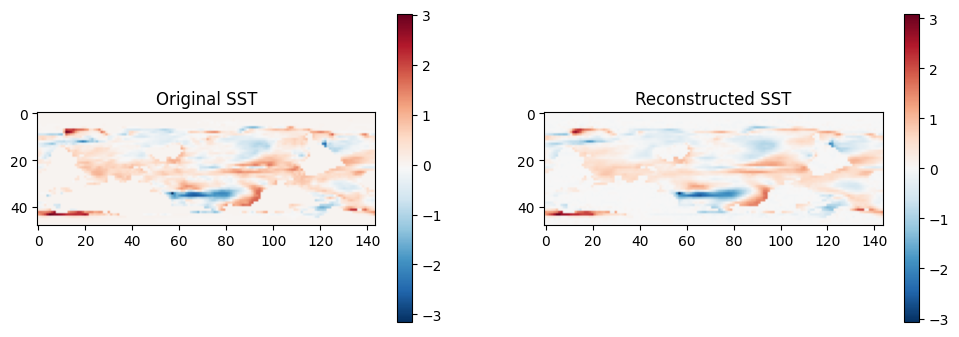

In [ ]:
import matplotlib.pyplot as plt

idx = 0

plt.figure(figsize=(12,4))

plt.subplot(1,2,1)
plt.title("Original SST")
plt.imshow(orig[idx,0], cmap="RdBu_r")
plt.colorbar()

plt.subplot(1,2,2)
plt.title("Reconstructed SST")
plt.imshow(recon[idx,0], cmap="RdBu_r")
plt.colorbar()

plt.show()

In [ ]:
import xarray as xr

lat_vals = lat_sst
lon_vals = lon_sst

time_coord = np.arange(generated_test.shape[1])

vae_anom_ds = xr.Dataset(
    {
        "sst": (["ensemble", "time", "lat", "lon"], generated_test)
    },
    coords={
        "ensemble": np.arange(generated_test.shape[0]),
        "time": time_coord,
        "lat": lat_vals,
        "lon": lon_vals,
    }
)


ori_test = np.stack(
    [test_Y[i].squeeze(1).numpy() for i in range(len(test_Y))],
    axis=0
)

ori_anom_ds = xr.Dataset(
    {
        "sst": (["ensemble", "time", "lat", "lon"], ori_test)
    },
    coords={
        "ensemble": np.arange(ori_test.shape[0]),
        "time": time_coord,
        "lat": lat_vals,
        "lon": lon_vals,
    }
)

In [ ]:
vae_anom_ds_3mo_avg = (
    vae_anom_ds
    .rolling(time=3, center=True)
    .mean()
    .dropna("time")
)

ori_anom_ds_3mo_avg = (
    ori_anom_ds
    .rolling(time=3, center=True)
    .mean()
    .dropna("time")
)

In [ ]:
print("VAE dims:", vae_anom_ds_3mo_avg.sst.dims)
print("VAE shape:", vae_anom_ds_3mo_avg.sst.shape)

print("Original dims:", ori_anom_ds_3mo_avg.sst.dims)
print("Original shape:", ori_anom_ds_3mo_avg.sst.shape)

VAE dims: ('ensemble', 'time', 'lat', 'lon')
VAE shape: (10, 197, 48, 144)
Original dims: ('ensemble', 'time', 'lat', 'lon')
Original shape: (10, 197, 48, 144)


In [ ]:
vae_mean_map = vae_anom_ds_3mo_avg.sst.mean(dim=("ensemble", "time")).values
ori_mean_map = ori_anom_ds_3mo_avg.sst.mean(dim=("ensemble", "time")).values

vae_std_map = vae_anom_ds_3mo_avg.sst.std(dim=("ensemble", "time")).values
ori_std_map = ori_anom_ds_3mo_avg.sst.std(dim=("ensemble", "time")).values

In [ ]:
lat_vals = vae_anom_ds_3mo_avg.lat.values
lon_vals = vae_anom_ds_3mo_avg.lon.values

In [ ]:
def symmetric_range(*arrays):
    """
    Compute symmetric color range around zero
    across multiple arrays.
    """
    max_abs = max(np.nanmax(np.abs(a)) for a in arrays)
    return -max_abs, max_abs

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.basemap import Basemap

def plot_two_maps_same_range(
    lon, lat,
    data1, data2,
    title1, title2,
    cbar_label="",
    cmap="RdBu_r",
    n_levels=21,
    save_path=None
):
    """
    Plot two global maps side-by-side using the SAME color scale.
    """


    vmin, vmax = symmetric_range(data1, data2)
    levels = np.linspace(vmin, vmax, n_levels)


    fig, axes = plt.subplots(1, 2, figsize=(14, 5), constrained_layout=True)

    for ax, data, title in zip(
        axes,
        [data1, data2],
        [title1, title2]
    ):
        m = Basemap(
            projection="cyl",
            llcrnrlat=lat.min(),
            urcrnrlat=lat.max(),
            llcrnrlon=lon.min(),
            urcrnrlon=lon.max(),
            resolution="l",
            ax=ax
        )

        lons, lats = np.meshgrid(lon, lat)
        x, y = m(lons, lats)

        cs = m.contourf(
            x, y, data,
            levels=levels,
            cmap=cmap,
            extend="both"
        )

        m.drawcoastlines()
        m.drawparallels(np.arange(-90, 91, 30), labels=[1,0,0,0])
        m.drawmeridians(np.arange(0, 361, 60), labels=[0,0,0,1])
        ax.set_title(title)


    cbar = fig.colorbar(
        cs,
        ax=axes,
        orientation="horizontal",
        pad=0.08,
        aspect=40
    )
    cbar.set_label(cbar_label)

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches="tight")

    plt.show()

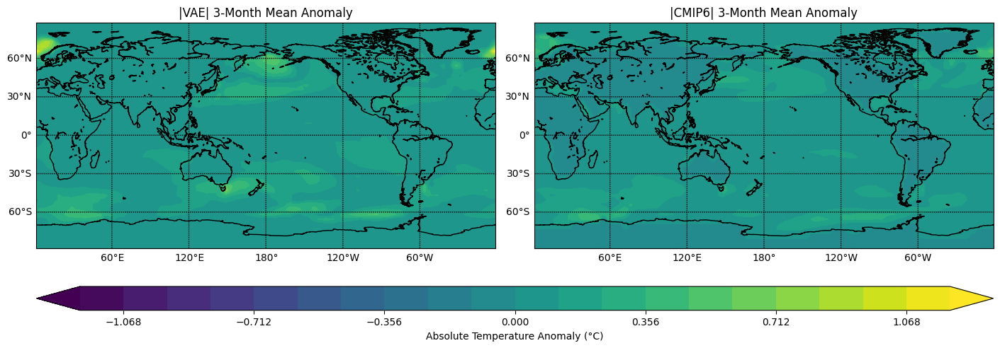

In [ ]:
vae_abs_mean_map = np.abs(vae_mean_map)
ori_abs_mean_map = np.abs(ori_mean_map)

plot_two_maps_same_range(
    lon_vals,
    lat_vals,
    vae_abs_mean_map,
    ori_abs_mean_map,
    title1="|VAE| 3-Month Mean Anomaly",
    title2="|CMIP6| 3-Month Mean Anomaly",
    cbar_label="Absolute Temperature Anomaly (°C)",
    cmap="viridis",
    save_path="/content/drive/MyDrive/VAE_Output/absolute_mean_comparison.png"
)

In [ ]:
def plot_two_maps_std(
    lon, lat,
    data1, data2,
    title1, title2,
    cbar_label="Std Dev (°C)",
    cmap="OrRd",
    n_levels=21,
    save_path=None
):
    vmax = max(
        np.nanmax(data1),
        np.nanmax(data2)
    )

    vmin = 0.0

    levels = np.linspace(vmin, np.nanmax(data1) if np.nanmax(data1) > np.nanmax(data2) else np.nanmax(data2), n_levels)

    fig, axes = plt.subplots(1, 2, figsize=(14, 5), constrained_layout=True)

    for ax, data, title in zip(axes, [data1, data2], [title1, title2]):
        m = Basemap(
            projection="cyl",
            llcrnrlat=lat.min(),
            urcrnrlat=lat.max(),
            llcrnrlon=lon.min(),
            urcrnrlon=lon.max(),
            resolution="l",
            ax=ax
        )

        lons, lats = np.meshgrid(lon, lat)
        x, y = m(lons, lats)

        cs = m.contourf(
            x, y, data,
            levels=levels,
            cmap=cmap,
            extend="max"
        )

        m.drawcoastlines()
        m.drawparallels(np.arange(-90, 91, 30), labels=[1,0,0,0])
        m.drawmeridians(np.arange(0, 361, 60), labels=[0,0,0,1])
        ax.set_title(title)

    cbar = fig.colorbar(cs, ax=axes, orientation="horizontal", pad=0.08)
    cbar.set_label(cbar_label)

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches="tight")

    plt.show()

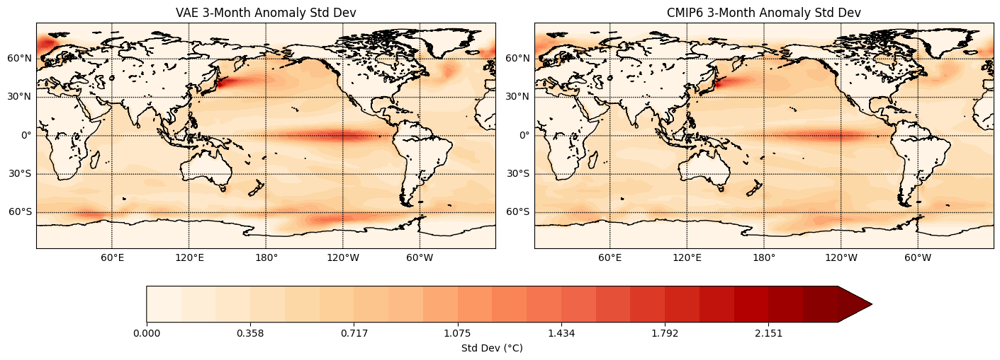

In [ ]:
plot_two_maps_std(
    lon_vals,
    lat_vals,
    vae_std_map,
    ori_std_map,
    title1="VAE 3-Month Anomaly Std Dev",
    title2="CMIP6 3-Month Anomaly Std Dev",
    save_path="/content/drive/MyDrive/VAE_Output/std_comparison.png"
)

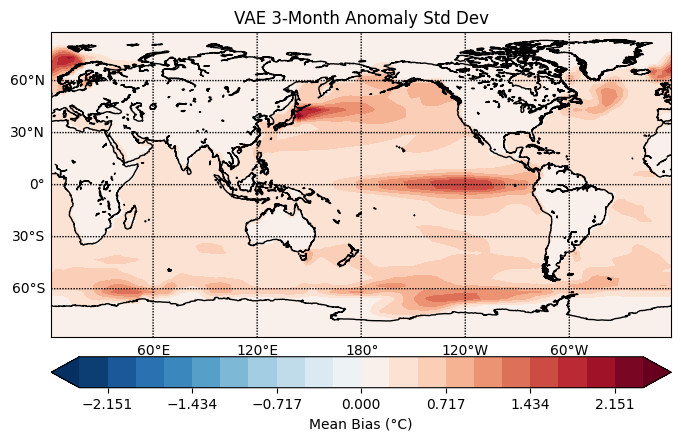

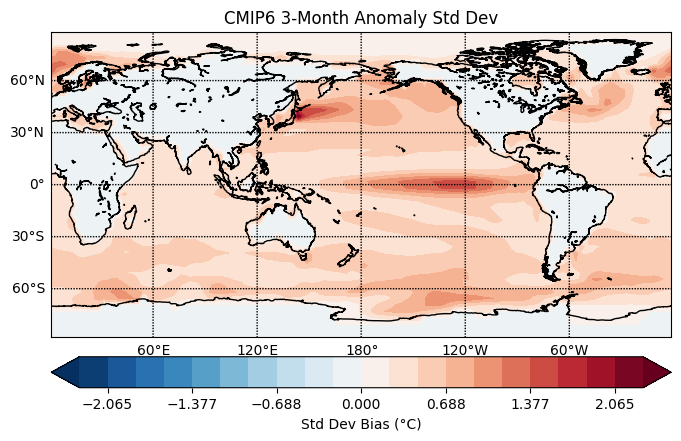

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
import numpy as np

def plot_map_metric(lon, lat, data, save_path, title="", cbar_label=""):
    plt.figure(figsize=(8,5))
    m = Basemap(
        projection="cyl",
        llcrnrlat=lat.min(),
        urcrnrlat=lat.max(),
        llcrnrlon=lon.min(),
        urcrnrlon=lon.max(),
        resolution="l"
    )

    lons, lats = np.meshgrid(lon, lat)
    x, y = m(lons, lats)


    max_abs = np.nanmax(np.abs(data))
    levels = np.linspace(-max_abs, max_abs, 21)

    cs = m.contourf(x, y, data, levels=levels, cmap="RdBu_r", extend="both")
    m.drawcoastlines()
    m.drawparallels(np.arange(-90, 91, 30), labels=[1,0,0,0])
    m.drawmeridians(np.arange(0, 361, 60), labels=[0,0,0,1])
    plt.colorbar(cs, orientation="horizontal", pad=0.05, label=cbar_label)
    plt.title(title)
    plt.savefig(save_path, bbox_inches='tight')
    plt.show()

plot_map_metric(
    lon_vals, lat_vals,vae_std_map,
    "/content/drive/MyDrive/VAE_Output/bias_map_vae_vs_cmip6.png",
    title="VAE 3-Month Anomaly Std Dev",
    cbar_label="Mean Bias (°C)"
)

plot_map_metric(
    lon_vals, lat_vals, ori_std_map,
    "/content/drive/MyDrive/VAE_Output/std_bias_map_vae_vs_cmip6.png",
    title="CMIP6 3-Month Anomaly Std Dev",
    cbar_label="Std Dev Bias (°C)"
)

In [ ]:
import xarray as xr

lat_vals = lat_sst
lon_vals = lon_sst

time_coord = np.arange(generated_test.shape[1])

vae_anom_ds = xr.Dataset(
    {
        "sst": (["ensemble", "time", "lat", "lon"], generated_test)
    },
    coords={
        "ensemble": np.arange(generated_test.shape[0]),
        "time": time_coord,
        "lat": lat_vals,
        "lon": lon_vals,
    }
)

ori_test = np.stack(
    [test_Y[i].squeeze(1).numpy() for i in range(len(test_Y))],
    axis=0
)

ori_anom_ds = xr.Dataset(
    {
        "sst": (["ensemble", "time", "lat", "lon"], ori_test)
    },
    coords={
        "ensemble": np.arange(ori_test.shape[0]),
        "time": time_coord,
        "lat": lat_vals,
        "lon": lon_vals,
    }
)

In [ ]:
vae_anom_3mo = (
    vae_anom_ds
    .rolling(time=3, center=True)
    .mean()
    .fillna(0)
)

ori_anom_3mo = (
    ori_anom_ds
    .rolling(time=3, center=True)
    .mean()
    .fillna(0)
)


vae_mean_ens = vae_anom_3mo["sst"].mean(dim="ensemble")
ori_mean_ens = ori_anom_3mo["sst"].mean(dim="ensemble")

In [ ]:
save_path = "/content/drive/MyDrive/SST_Data/VAE_generated_samples.nc"
vae_anom_ds.to_netcdf(save_path)
print("Saved successfully!")

Saved successfully!


In [ ]:
save_path = "/content/drive/MyDrive/SST_Data/Original_samples.nc"
ori_anom_ds.to_netcdf(save_path)
print("Saved successfully!")

Saved successfully!


In [ ]:
print("VAE dims:", vae_anom_3mo.sst.dims)
print("VAE shape:", vae_anom_3mo.sst.shape)

print("Original dims:", ori_anom_3mo.sst.dims)
print("Original shape:", ori_anom_3mo.sst.shape)

VAE dims: ('ensemble', 'time', 'lat', 'lon')
VAE shape: (10, 199, 48, 144)
Original dims: ('ensemble', 'time', 'lat', 'lon')
Original shape: (10, 199, 48, 144)


In [ ]:
sst_data = vae_mean_ens.values
valid_time_idx = ~np.all(np.isnan(sst_data), axis=(1, 2))
Data = sst_data[valid_time_idx]

In [ ]:
lat = vae_mean_ens.lat.values
lon = vae_mean_ens.lon.values

coslat = np.cos(np.deg2rad(lat))
wgts = np.sqrt(coslat)[:, np.newaxis]

In [ ]:
from eofs.standard import Eof

solver = Eof(Data, weights=wgts)

eofs = solver.eofs(neofs=10)
pcs = solver.pcs(npcs=10, pcscaling=1)
varfrac = solver.varianceFraction()
lambdas = solver.eigenvalues()

In [ ]:
vae_anom_3mo = (
    vae_anom_ds
    .rolling(time=3, center=True)
    .mean()
)

ori_anom_3mo = (
    ori_anom_ds
    .rolling(time=3, center=True)
    .mean()
)

In [ ]:
print("VAE dims:", vae_anom_3mo.sst.dims)
print("VAE shape:", vae_anom_3mo.sst.shape)

print("Original dims:", ori_anom_3mo.sst.dims)
print("Original shape:", ori_anom_3mo.sst.shape)

VAE dims: ('ensemble', 'time', 'lat', 'lon')
VAE shape: (10, 199, 48, 144)
Original dims: ('ensemble', 'time', 'lat', 'lon')
Original shape: (10, 199, 48, 144)


In [ ]:
vae_stacked = vae_anom_3mo["sst"].stack(sample=("ensemble", "time"))
ori_stacked = ori_anom_3mo["sst"].stack(sample=("ensemble", "time"))


vae_stacked = vae_stacked.transpose("sample", "lat", "lon")
ori_stacked = ori_stacked.transpose("sample", "lat", "lon")

In [ ]:
print("VAE dims:", vae_stacked.dims)
print("VAE shape:", vae_stacked.shape)

print("Original dims:", ori_stacked.dims)
print("Original shape:", ori_stacked.shape)

VAE dims: ('sample', 'lat', 'lon')
VAE shape: (1990, 48, 144)
Original dims: ('sample', 'lat', 'lon')
Original shape: (1990, 48, 144)


In [ ]:
vae_data = vae_stacked.values

valid_idx = ~np.all(np.isnan(vae_data), axis=(1, 2))
Data = vae_data[valid_idx]

In [ ]:
lat = vae_anom_3mo.lat.values
lon = vae_anom_3mo.lon.values

coslat = np.cos(np.deg2rad(lat))
wgts = np.sqrt(coslat)[:, np.newaxis]

In [ ]:
from eofs.standard import Eof

solver = Eof(Data, weights=wgts)

eofs = solver.eofs(neofs=10)
pcs = solver.pcs(npcs=10, pcscaling=1)
varfrac = solver.varianceFraction()
lambdas = solver.eigenvalues()

In [ ]:
for e in range(vae_anom_3mo.sizes["ensemble"]):

    single_member = vae_anom_3mo["sst"].isel(ensemble=e).values

    valid = ~np.all(np.isnan(single_member), axis=(1,2))
    single_member = single_member[valid]

    solver = Eof(single_member, weights=wgts)
    pcs_single = solver.pcs(npcs=1, pcscaling=1)

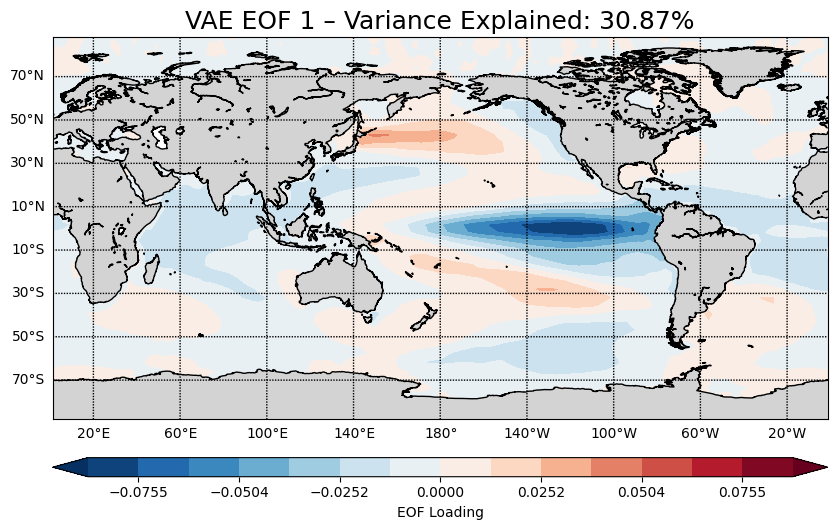

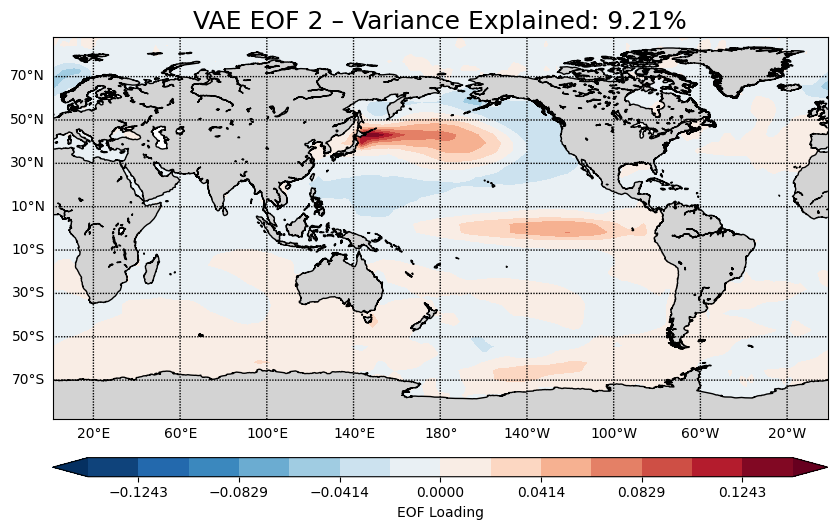

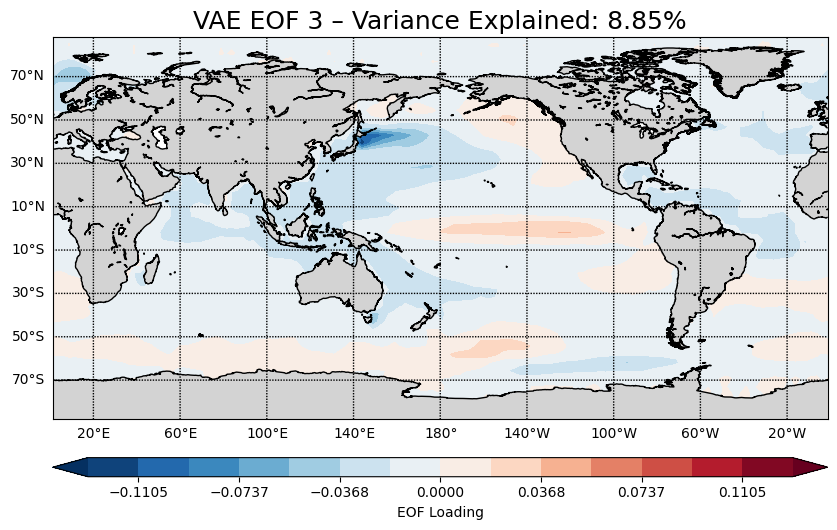

In [ ]:
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt

parallels = np.arange(-90, 90, 20)
meridians = np.arange(-180, 180, 40)

for i in range(3):

    fig = plt.figure(figsize=(10, 14))

    m = Basemap(
        projection='cyl',
        llcrnrlon=lon.min(),
        llcrnrlat=lat.min(),
        urcrnrlon=lon.max(),
        urcrnrlat=lat.max(),
        resolution='l'
    )

    x, y = m(*np.meshgrid(lon, lat))
    vmax = np.max(np.abs(eofs[i]))
    clevs = np.linspace(-vmax, vmax, 15)

    cs = m.contourf(
        x, y, eofs[i],
        clevs,
        cmap=plt.cm.RdBu_r,
        extend='both'
    )

    m.drawcoastlines()
    m.fillcontinents(color='lightgray')
    m.drawparallels(parallels, labels=[1,0,0,0])
    m.drawmeridians(meridians, labels=[0,0,0,1])

    cb = m.colorbar(cs, 'bottom', size='5%', pad='10%')
    cb.set_label("EOF Loading")

    plt.title(
        f"VAE EOF {i+1} – Variance Explained: {varfrac[i]*100:.2f}%",
        fontsize=18
    )

    plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from numpy.fft import fft, fftfreq
import pylab as pl
from scipy import signal
import matplotlib.pyplot as plt
import scipy.stats


def cal_power_spect(data):
    nd=len(data)
    nrho=len(data)
    rho=0
    sommesup=0
    sommeinf=0
    for i in range(1,nrho):
        j=i-1
        sommesup=sommesup+(data[i]*data[j])
        sommeinf=sommeinf+((data[j]**2))

    rho=sommesup/sommeinf

    nt=len(data)

    rzero=0
    redtab=[]
    red=[]

    srho=np.sqrt(1-rho**2)

    nsim=1500

    red_sum=np.zeros((nd, nsim))
    for i in range(nsim):

        white=srho*np.random.randn(1)
        red_sum[0,i]=rho*rzero+white

        for j in range(1,nd):
            white=srho*np.random.randn(1)
            red_sum[j,i]=rho*red_sum[j-1,i]+white

    redtab.append(red_sum)

    redtab=np.array(redtab)
    redtab=redtab.reshape(nd,nsim)


    fs=1
    f, Po = signal.periodogram(data, fs, detrend='linear')

    npo=len(Po)
    Po=Po.reshape(npo,)

    Ax=np.sum(Po)/npo

    red2=[]
    specred=np.zeros((npo,nsim))

    for i in range(nsim):
        red2=redtab[:,i]
        red2m=np.sum(red2)/nd
        red2n=red2-red2m
        fs=1
        fr, Pr = signal.periodogram(red2n, fs, detrend='linear')  #detrend = linear
        npr=len(Pr)
        Pr=Pr.reshape(npr,)

        Ar=np.sum(Pr)/npr
        Pr=Pr*(Ax/Ar)
        specred[:,i]=Pr

    Mpr=0
    Mspecred=[]
    for i in range(npr):
        Mpr=specred[i,1]
        for j in range(1,nsim):
            Mpr=Mpr+specred[i,j]

        Mpr=np.sum(Mpr)/nsim
        Mspecred.append(Mpr)

    Mspecred=np.array(Mspecred)


    period_Po=1/f
    period_Pr=1/fr


    n85=round(1500*85/100)
    n90=round(1500*90/100)
    n95=round(1500*95/100)
    n99=round(1500*99/100)


    tabvecsort=np.zeros((npr,nsim))
    for i in range(npr):
        vec=specred[i,:]
        tabvecsort[i,:]=np.sort(vec)

    tabMC=np.zeros((npr,4))

    for i in range(npr):
        tabMC[i,0]=tabvecsort[i,n85]
        tabMC[i,1]=tabvecsort[i,n90]
        tabMC[i,2]=tabvecsort[i,n95]
        tabMC[i,3]=tabvecsort[i,n99]



    plot=np.zeros((Po.shape[0],3), dtype=np.float32)

    plot[:,0]=period_Po
    plot[:,1]=f*Po
    plot[:,2]=f*tabMC[:,2]
    return plot

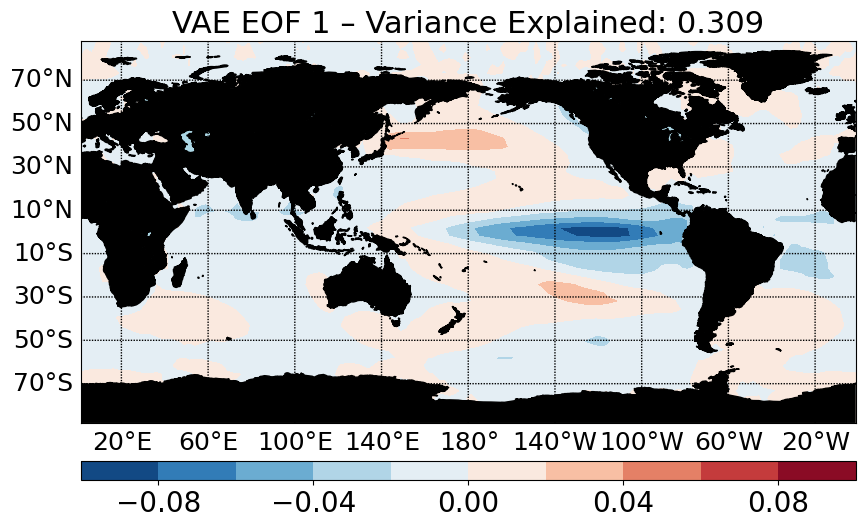

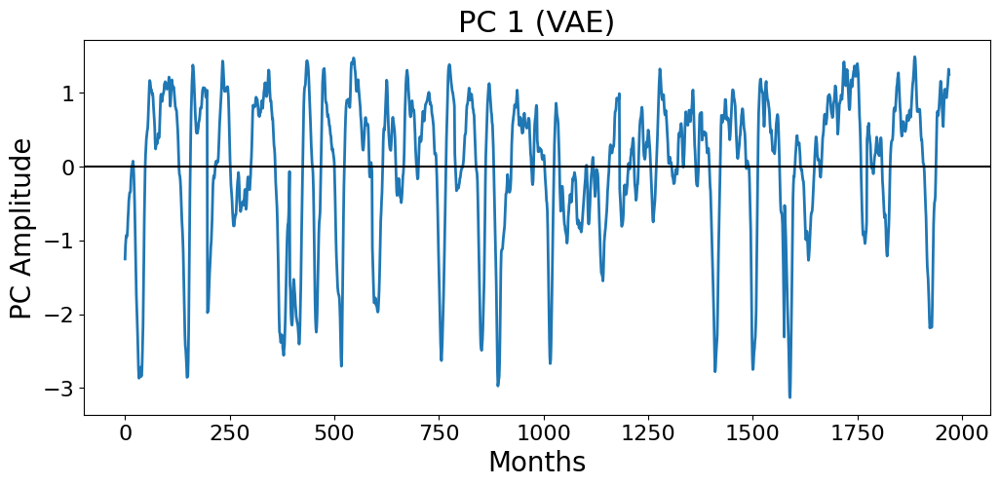

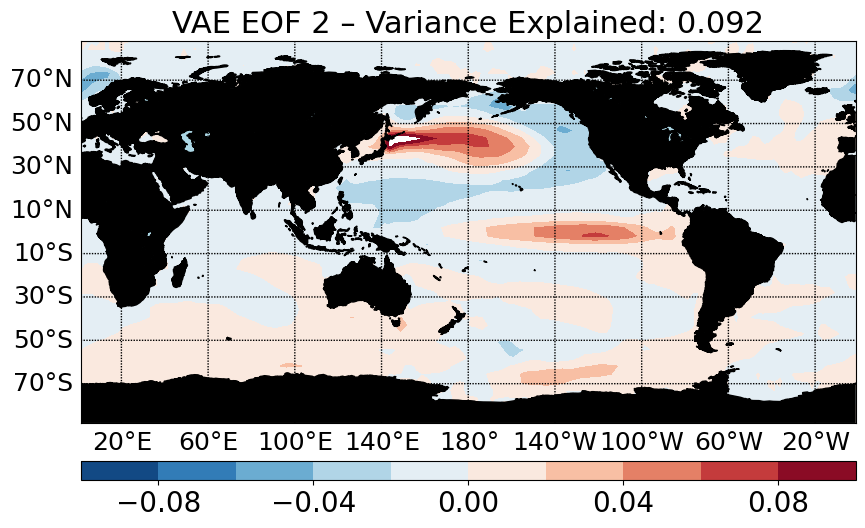

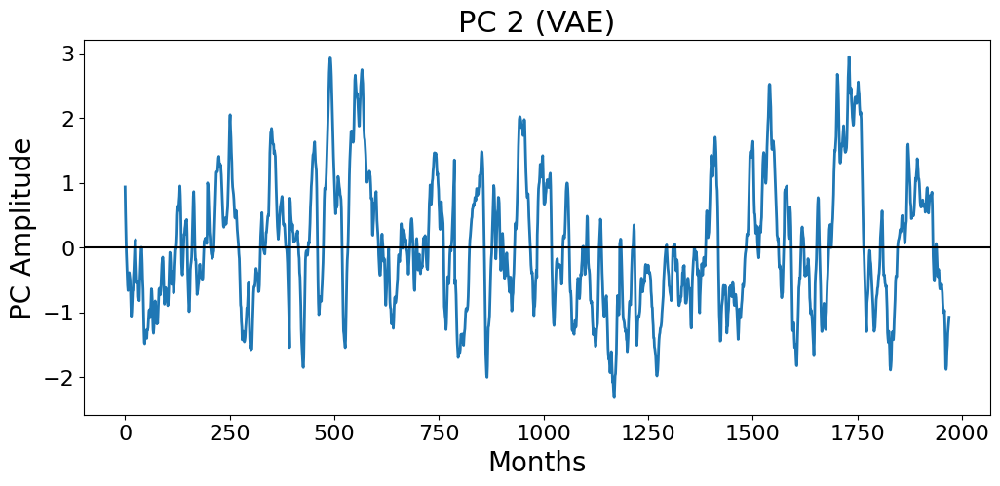

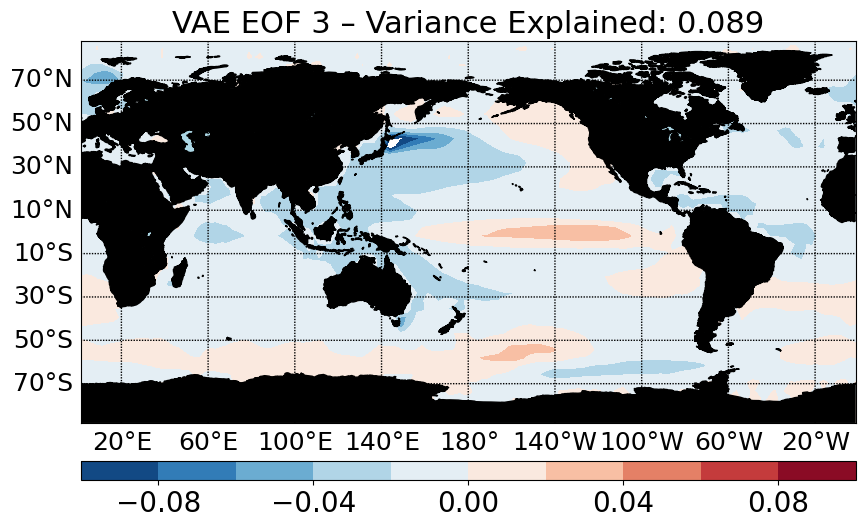

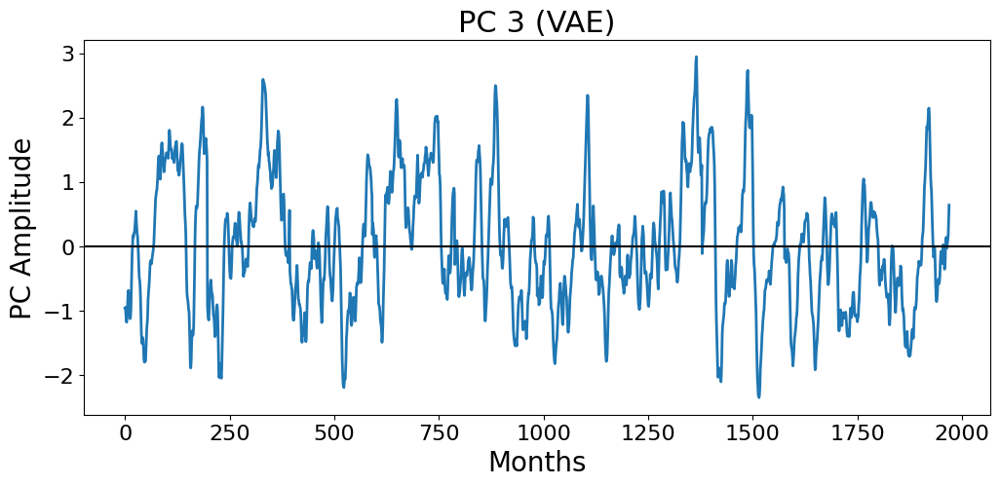

In [ ]:
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt

parallels = np.arange(-90, 90, 20)
meridians = np.arange(-180, 180, 40)

for i in range(3):


    fig = plt.figure(figsize=(10, 16))

    m = Basemap(
        projection='cyl',
        llcrnrlon=min(lon),
        llcrnrlat=min(lat),
        urcrnrlon=max(lon),
        urcrnrlat=max(lat),
        resolution='l'
    )

    x, y = m(*np.meshgrid(lon, lat))
    clevs = np.linspace(-0.1, 0.1, 11)

    cs = m.contourf(
        x, y, eofs[i, :, :],
        clevs, cmap=plt.cm.RdBu_r
    )

    m.drawcoastlines()
    m.fillcontinents(color='black', lake_color='lightblue')
    m.drawparallels(parallels, labels=[1,0,0,0], fontsize=18)
    m.drawmeridians(meridians, labels=[1,0,0,1], fontsize=18)

    cb = m.colorbar(cs, 'bottom', size='5%', pad='10%')
    cb.ax.tick_params(labelsize=20)

    plt.title(
        f"VAE EOF {i+1} – Variance Explained: {varfrac[i]:.3f}",
        fontsize=22
    )

    plt.show()


    plt.figure(figsize=(12, 5))
    plt.plot(pcs[:, i], linewidth=2)
    plt.axhline(0, color='k')

    plt.xlabel("Months", fontsize=20)
    plt.ylabel("PC Amplitude", fontsize=20)
    plt.title(f"PC {i+1} (VAE)", fontsize=22)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)

    plt.show()

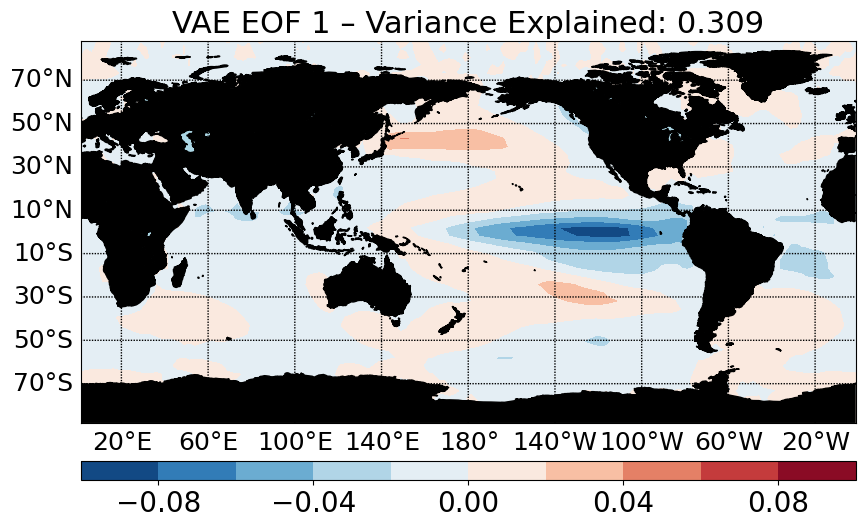

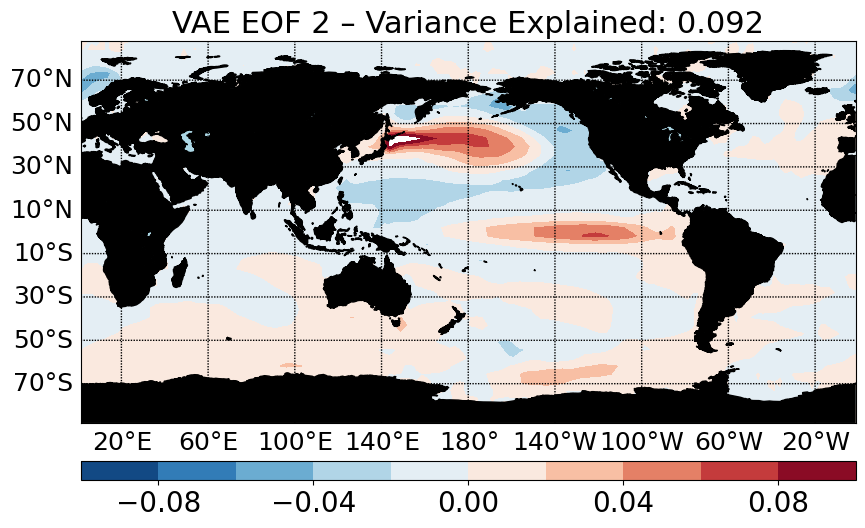

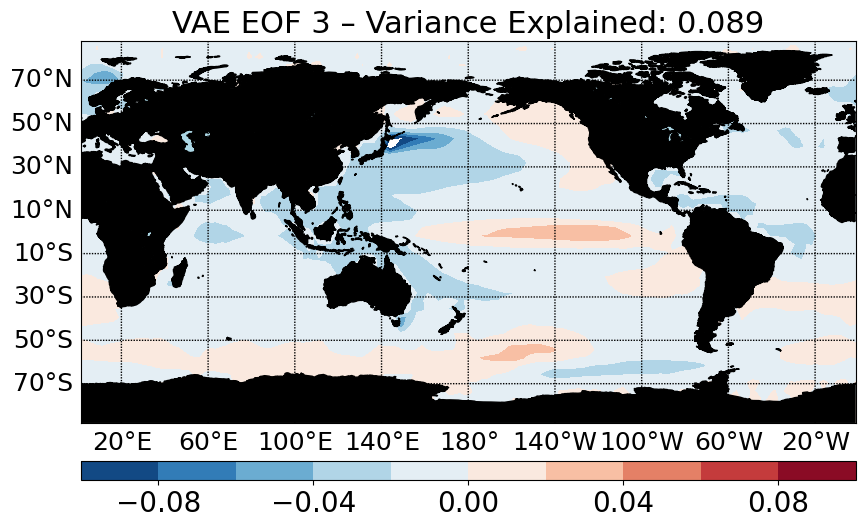

In [ ]:
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt

parallels = np.arange(-90, 90, 20)
meridians = np.arange(-180, 180, 40)

for i in range(3):


    fig = plt.figure(figsize=(10, 16))

    m = Basemap(
        projection='cyl',
        llcrnrlon=min(lon),
        llcrnrlat=min(lat),
        urcrnrlon=max(lon),
        urcrnrlat=max(lat),
        resolution='l'
    )

    x, y = m(*np.meshgrid(lon, lat))
    clevs = np.linspace(-0.1, 0.1, 11)

    cs = m.contourf(
        x, y, eofs[i, :, :],
        clevs, cmap=plt.cm.RdBu_r
    )

    m.drawcoastlines()
    m.fillcontinents(color='black', lake_color='lightblue')
    m.drawparallels(parallels, labels=[1,0,0,0], fontsize=18)
    m.drawmeridians(meridians, labels=[1,0,0,1], fontsize=18)

    cb = m.colorbar(cs, 'bottom', size='5%', pad='10%')
    cb.ax.tick_params(labelsize=20)

    plt.title(
        f"VAE EOF {i+1} – Variance Explained: {varfrac[i]:.3f}",
        fontsize=22
    )

    plt.show()

/tmp/ipykernel_2794/89003633.py:43: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  red_sum[0,i]=rho*rzero+white
/tmp/ipykernel_2794/89003633.py:47: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  red_sum[j,i]=rho*red_sum[j-1,i]+white
/tmp/ipykernel_2794/89003633.py:92: RuntimeWarning: divide by zero encountered in divide
  period_Po=1/f
/tmp/ipykernel_2794/89003633.py:93: RuntimeWarning: divide by zero encountered in divide
  period_Pr=1/fr


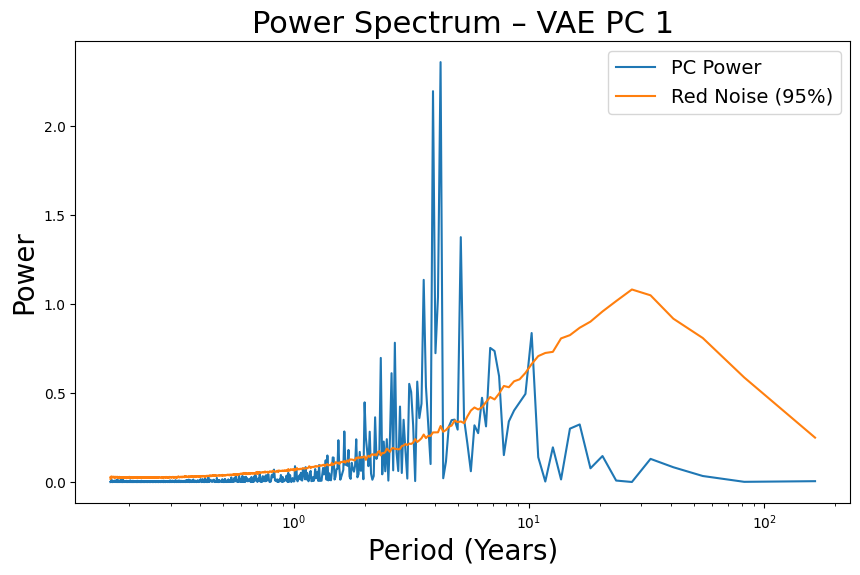

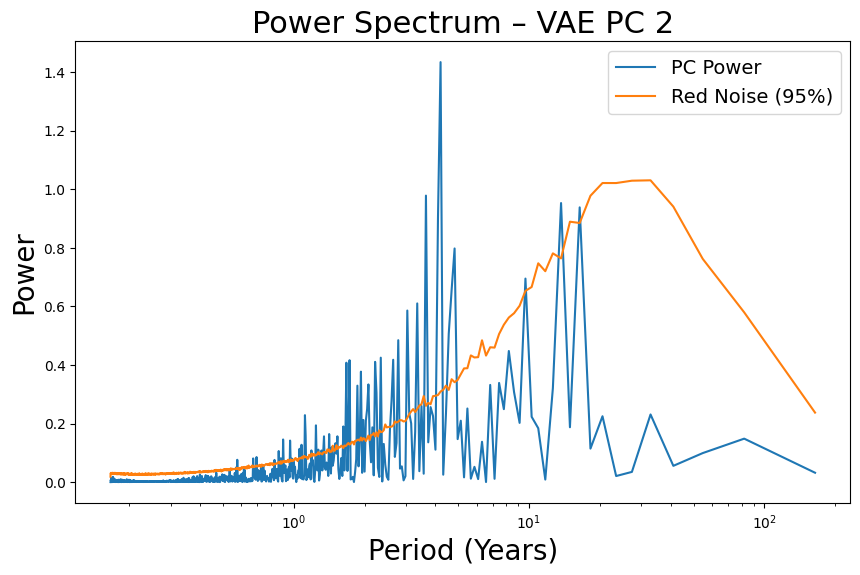

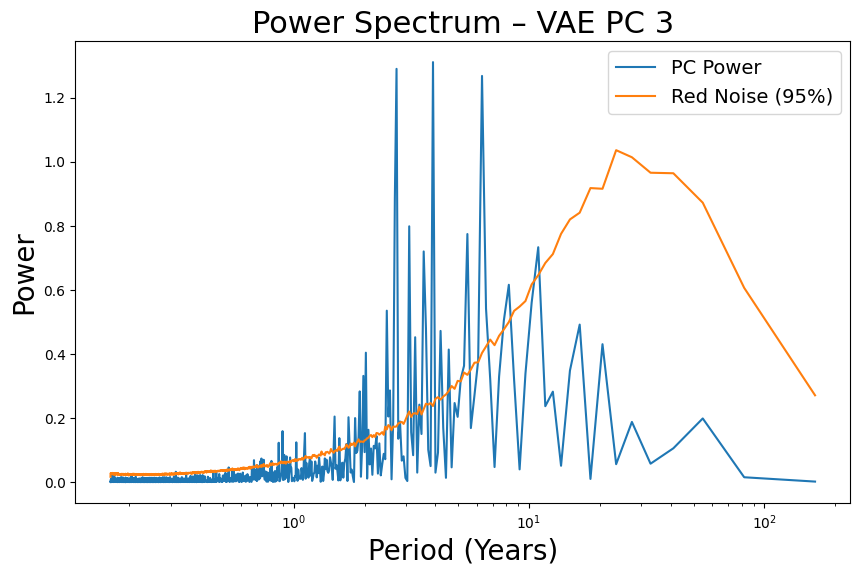

In [ ]:
for i in range(3):
    plot = cal_power_spect(pcs[:, i])

    plt.figure(figsize=(10, 6))
    plt.plot(plot[:, 0] / 12, plot[:, 1], label="PC Power")
    plt.plot(plot[:, 0] / 12, plot[:, 2], label="Red Noise (95%)")
    plt.xscale("log")
    plt.xlabel("Period (Years)", fontsize=20)
    plt.ylabel("Power", fontsize=20)
    plt.legend(fontsize=14)
    plt.title(f"Power Spectrum – VAE PC {i+1}", fontsize=22)

    plt.show()

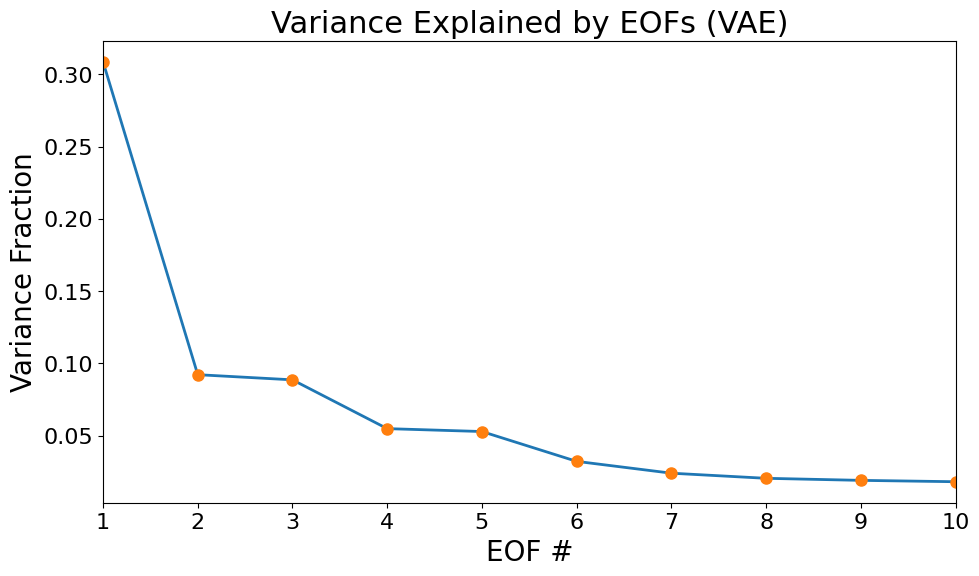

In [ ]:
plt.figure(figsize=(11, 6))

eof_num = np.arange(1, 11)

plt.plot(eof_num, varfrac[:10], linewidth=2)
plt.plot(
    eof_num, varfrac[:10],
    linestyle='None', marker='o',
    markersize=8
)

plt.xlabel("EOF #", fontsize=20)
plt.ylabel("Variance Fraction", fontsize=20)
plt.title("Variance Explained by EOFs (VAE)", fontsize=22)

plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.xlim(1, 10)

plt.show()

In [ ]:
ens_id = 0

single_member = vae_anom_3mo["sst"].isel(ensemble=ens_id).values

In [ ]:
valid = ~np.all(np.isnan(single_member), axis=(1,2))
Data = single_member[valid]

In [ ]:
print(single_member.shape)
print(Data.shape)

(199, 48, 144)
(197, 48, 144)


In [ ]:
lat = vae_anom_3mo.lat.values
coslat = np.cos(np.deg2rad(lat))
wgts = np.sqrt(coslat)[:, np.newaxis]

In [ ]:
from eofs.standard import Eof

solver = Eof(Data, weights=wgts)

eofs = solver.eofs()
pcs = solver.pcs(pcscaling=1)
varfrac = solver.varianceFraction()
lambdas = solver.eigenvalues()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from numpy.fft import fft, fftfreq
import pylab as pl
from scipy import signal
import matplotlib.pyplot as plt
import scipy.stats


def cal_power_spect(data):


    nd=len(data)


    nrho=len(data)
    rho=0
    sommesup=0
    sommeinf=0
    for i in range(1,nrho):
        j=i-1
        sommesup=sommesup+(data[i]*data[j])
        sommeinf=sommeinf+((data[j]**2))

    rho=sommesup/sommeinf

    nt=len(data)

    rzero=0
    redtab=[]
    red=[]

    srho=np.sqrt(1-rho**2)

    nsim=1500

    red_sum=np.zeros((nd, nsim))
    for i in range(nsim):

        white=srho*np.random.randn(1)
        red_sum[0,i]=rho*rzero+white

        for j in range(1,nd):
            white=srho*np.random.randn(1)
            red_sum[j,i]=rho*red_sum[j-1,i]+white

    redtab.append(red_sum)

    redtab=np.array(redtab)
    redtab=redtab.reshape(nd,nsim)


    fs=1
    f, Po = signal.periodogram(data, fs, detrend='linear')

    npo=len(Po)
    Po=Po.reshape(npo,)

    Ax=np.sum(Po)/npo

    red2=[]
    specred=np.zeros((npo,nsim))

    for i in range(nsim):
        red2=redtab[:,i]
        red2m=np.sum(red2)/nd
        red2n=red2-red2m
        fs=1
        fr, Pr = signal.periodogram(red2n, fs, detrend='linear')
        npr=len(Pr)
        Pr=Pr.reshape(npr,)

        Ar=np.sum(Pr)/npr
        Pr=Pr*(Ax/Ar)
        specred[:,i]=Pr

    Mpr=0
    Mspecred=[]
    for i in range(npr):
        Mpr=specred[i,1]
        for j in range(1,nsim):
            Mpr=Mpr+specred[i,j]

        Mpr=np.sum(Mpr)/nsim
        Mspecred.append(Mpr)

    Mspecred=np.array(Mspecred)


    period_Po=1/f
    period_Pr=1/fr


    n85=round(1500*85/100)
    n90=round(1500*90/100)
    n95=round(1500*95/100)
    n99=round(1500*99/100)


    tabvecsort=np.zeros((npr,nsim))
    for i in range(npr):
        vec=specred[i,:]
        tabvecsort[i,:]=np.sort(vec)

    tabMC=np.zeros((npr,4))

    for i in range(npr):
        tabMC[i,0]=tabvecsort[i,n85]
        tabMC[i,1]=tabvecsort[i,n90]
        tabMC[i,2]=tabvecsort[i,n95]
        tabMC[i,3]=tabvecsort[i,n99]



    plot=np.zeros((Po.shape[0],3), dtype=np.float32)

    plot[:,0]=period_Po
    plot[:,1]=f*Po
    plot[:,2]=f*tabMC[:,2]
    return plot

In [ ]:
ori_data = ori_stacked.values

valid_idx = ~np.all(np.isnan(vae_data), axis=(1, 2))
Data = ori_data[valid_idx]

In [ ]:
lat = ori_anom_3mo.lat.values
lon = ori_anom_3mo.lon.values

coslat = np.cos(np.deg2rad(lat))
wgts = np.sqrt(coslat)[:, np.newaxis]

from eofs.standard import Eof

solver = Eof(Data, weights=wgts)

eofs = solver.eofs(neofs=10)
pcs = solver.pcs(npcs=10, pcscaling=1)
varfrac = solver.varianceFraction()
lambdas = solver.eigenvalues()

for e in range(vae_anom_3mo.sizes["ensemble"]):

    single_member = vae_anom_3mo["sst"].isel(ensemble=e).values

    valid = ~np.all(np.isnan(single_member), axis=(1,2))
    single_member = single_member[valid]

    solver = Eof(single_member, weights=wgts)
    pcs_single = solver.pcs(npcs=1, pcscaling=1)

In [ ]:
ens_id = 0
single_member = ori_anom_3mo["sst"].isel(ensemble=ens_id).values
valid = ~np.all(np.isnan(single_member), axis=(1,2))
Data = single_member[valid]
lat = ori_anom_3mo.lat.values
coslat = np.cos(np.deg2rad(lat))
wgts = np.sqrt(coslat)[:, np.newaxis]
from eofs.standard import Eof

solver = Eof(Data, weights=wgts)

eofs = solver.eofs()
pcs = solver.pcs(pcscaling=1)
varfrac = solver.varianceFraction()
lambdas = solver.eigenvalues()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from numpy.fft import fft, fftfreq
import pylab as pl
from scipy import signal
import matplotlib.pyplot as plt
import scipy.stats


def cal_power_spect(data):


    nd=len(data)


    nrho=len(data)
    rho=0
    sommesup=0
    sommeinf=0
    for i in range(1,nrho):
        j=i-1
        sommesup=sommesup+(data[i]*data[j])
        sommeinf=sommeinf+((data[j]**2))

    rho=sommesup/sommeinf

    nt=len(data)

    rzero=0
    redtab=[]
    red=[]

    srho=np.sqrt(1-rho**2)

    nsim=1500

    red_sum=np.zeros((nd, nsim))
    for i in range(nsim):

        white=srho*np.random.randn(1)
        red_sum[0,i]=rho*rzero+white

        for j in range(1,nd):
            white=srho*np.random.randn(1)
            red_sum[j,i]=rho*red_sum[j-1,i]+white

    redtab.append(red_sum)

    redtab=np.array(redtab)
    redtab=redtab.reshape(nd,nsim)


    fs=1
    f, Po = signal.periodogram(data, fs, detrend='linear')

    npo=len(Po)
    Po=Po.reshape(npo,)

    Ax=np.sum(Po)/npo

    red2=[]
    specred=np.zeros((npo,nsim))

    for i in range(nsim):
        red2=redtab[:,i]
        red2m=np.sum(red2)/nd
        red2n=red2-red2m
        fs=1
        fr, Pr = signal.periodogram(red2n, fs, detrend='linear')
        npr=len(Pr)
        Pr=Pr.reshape(npr,)

        Ar=np.sum(Pr)/npr
        Pr=Pr*(Ax/Ar)
        specred[:,i]=Pr

    Mpr=0
    Mspecred=[]
    for i in range(npr):
        Mpr=specred[i,1]
        for j in range(1,nsim):
            Mpr=Mpr+specred[i,j]

        Mpr=np.sum(Mpr)/nsim
        Mspecred.append(Mpr)

    Mspecred=np.array(Mspecred)


    period_Po=1/f
    period_Pr=1/fr


    n85=round(1500*85/100)
    n90=round(1500*90/100)
    n95=round(1500*95/100)
    n99=round(1500*99/100)


    tabvecsort=np.zeros((npr,nsim))
    for i in range(npr):
        vec=specred[i,:]
        tabvecsort[i,:]=np.sort(vec)

    tabMC=np.zeros((npr,4))

    for i in range(npr):
        tabMC[i,0]=tabvecsort[i,n85]
        tabMC[i,1]=tabvecsort[i,n90]
        tabMC[i,2]=tabvecsort[i,n95]
        tabMC[i,3]=tabvecsort[i,n99]



    plot=np.zeros((Po.shape[0],3), dtype=np.float32)

    plot[:,0]=period_Po
    plot[:,1]=f*Po
    plot[:,2]=f*tabMC[:,2]
    return plot

In [ ]:
ori_data = ori_stacked.values

valid_idx = ~np.all(np.isnan(ori_data), axis=(1, 2))
Data = ori_data[valid_idx]

In [ ]:
lat = ori_anom_3mo.lat.values
lon = ori_anom_3mo.lon.values

coslat = np.cos(np.deg2rad(lat))
wgts = np.sqrt(coslat)[:, np.newaxis]

from eofs.standard import Eof

solver = Eof(Data, weights=wgts)

eofs = solver.eofs(neofs=10)
pcs = solver.pcs(npcs=10, pcscaling=1)
varfrac = solver.varianceFraction()
lambdas = solver.eigenvalues()

for e in range(ori_anom_3mo.sizes["ensemble"]):

    single_member = ori_anom_3mo["sst"].isel(ensemble=e).values

    valid = ~np.all(np.isnan(single_member), axis=(1,2))
    single_member = single_member[valid]

    solver = Eof(single_member, weights=wgts)
    pcs_single = solver.pcs(npcs=1, pcscaling=1)

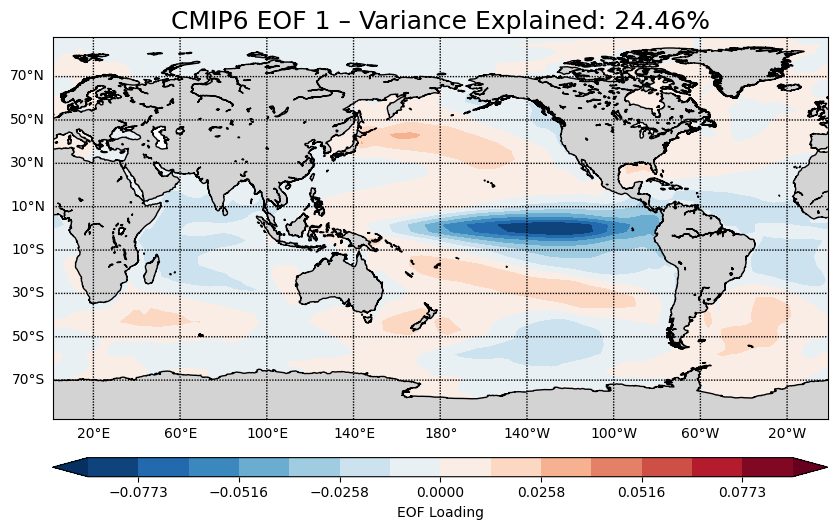

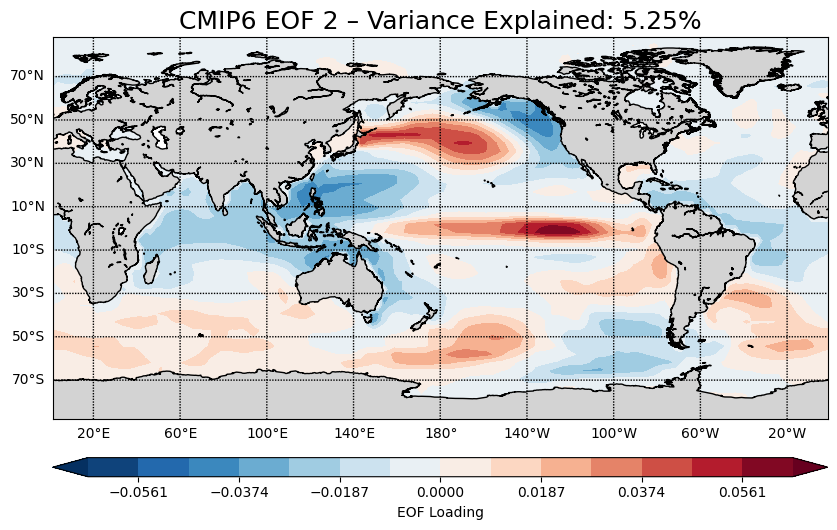

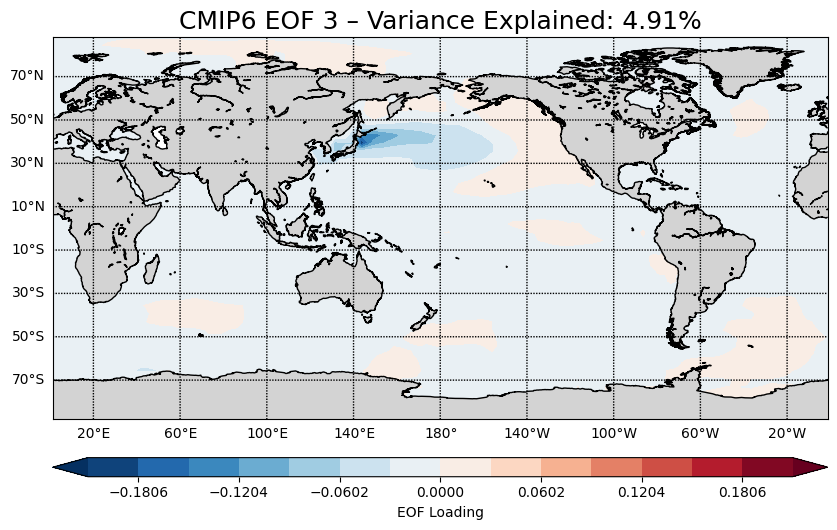

In [ ]:
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt

parallels = np.arange(-90, 90, 20)
meridians = np.arange(-180, 180, 40)

for i in range(3):

    fig = plt.figure(figsize=(10, 14))

    m = Basemap(
        projection='cyl',
        llcrnrlon=lon.min(),
        llcrnrlat=lat.min(),
        urcrnrlon=lon.max(),
        urcrnrlat=lat.max(),
        resolution='l'
    )

    x, y = m(*np.meshgrid(lon, lat))


    vmax = np.max(np.abs(eofs[i]))
    clevs = np.linspace(-vmax, vmax, 15)

    cs = m.contourf(
        x, y, eofs[i],
        clevs,
        cmap=plt.cm.RdBu_r,
        extend='both'
    )

    m.drawcoastlines()
    m.fillcontinents(color='lightgray')
    m.drawparallels(parallels, labels=[1,0,0,0])
    m.drawmeridians(meridians, labels=[0,0,0,1])

    cb = m.colorbar(cs, 'bottom', size='5%', pad='10%')
    cb.set_label("EOF Loading")

    plt.title(
        f"CMIP6 EOF {i+1} – Variance Explained: {varfrac[i]*100:.2f}%",
        fontsize=18
    )

    plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from numpy.fft import fft, fftfreq
import pylab as pl
from scipy import signal
import matplotlib.pyplot as plt
import scipy.stats


def cal_power_spect(data):


    nd=len(data)


    nrho=len(data)
    rho=0
    sommesup=0
    sommeinf=0
    for i in range(1,nrho):
        j=i-1
        sommesup=sommesup+(data[i]*data[j])
        sommeinf=sommeinf+((data[j]**2))

    rho=sommesup/sommeinf

    nt=len(data)

    rzero=0
    redtab=[]
    red=[]

    srho=np.sqrt(1-rho**2)

    nsim=1500

    red_sum=np.zeros((nd, nsim))
    for i in range(nsim):

        white=srho*np.random.randn(1)
        red_sum[0,i]=rho*rzero+white

        for j in range(1,nd):
            white=srho*np.random.randn(1)
            red_sum[j,i]=rho*red_sum[j-1,i]+white

    redtab.append(red_sum)

    redtab=np.array(redtab)
    redtab=redtab.reshape(nd,nsim)


    fs=1
    f, Po = signal.periodogram(data, fs, detrend='linear')

    npo=len(Po)
    Po=Po.reshape(npo,)

    Ax=np.sum(Po)/npo

    red2=[]
    specred=np.zeros((npo,nsim))

    for i in range(nsim):
        red2=redtab[:,i]
        red2m=np.sum(red2)/nd
        red2n=red2-red2m
        fs=1
        fr, Pr = signal.periodogram(red2n, fs, detrend='linear')
        npr=len(Pr)
        Pr=Pr.reshape(npr,)

        Ar=np.sum(Pr)/npr
        Pr=Pr*(Ax/Ar)
        specred[:,i]=Pr

    Mpr=0
    Mspecred=[]
    for i in range(npr):
        Mpr=specred[i,1]
        for j in range(1,nsim):
            Mpr=Mpr+specred[i,j]

        Mpr=np.sum(Mpr)/nsim
        Mspecred.append(Mpr)

    Mspecred=np.array(Mspecred)


    period_Po=1/f
    period_Pr=1/fr


    n85=round(1500*85/100)
    n90=round(1500*90/100)
    n95=round(1500*95/100)
    n99=round(1500*99/100)


    tabvecsort=np.zeros((npr,nsim))
    for i in range(npr):
        vec=specred[i,:]
        tabvecsort[i,:]=np.sort(vec)

    tabMC=np.zeros((npr,4))

    for i in range(npr):
        tabMC[i,0]=tabvecsort[i,n85]
        tabMC[i,1]=tabvecsort[i,n90]
        tabMC[i,2]=tabvecsort[i,n95]
        tabMC[i,3]=tabvecsort[i,n99]



    plot=np.zeros((Po.shape[0],3), dtype=np.float32)

    plot[:,0]=period_Po
    plot[:,1]=f*Po
    plot[:,2]=f*tabMC[:,2]
    return plot

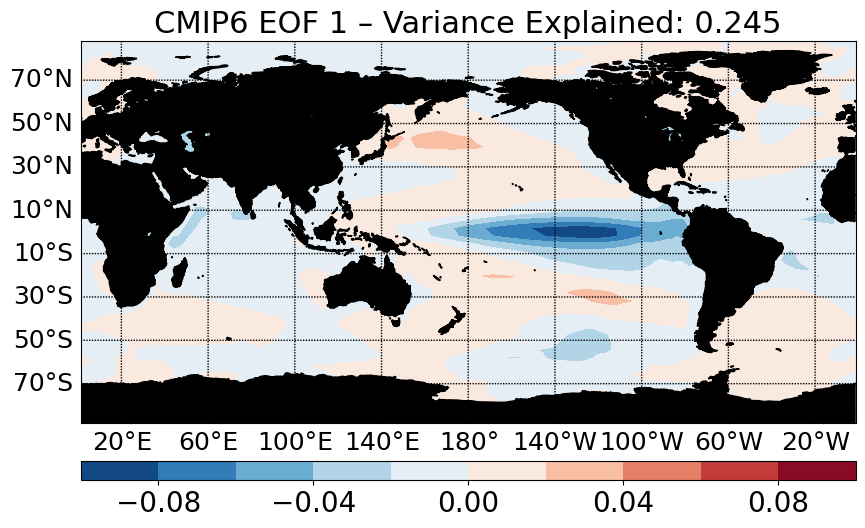

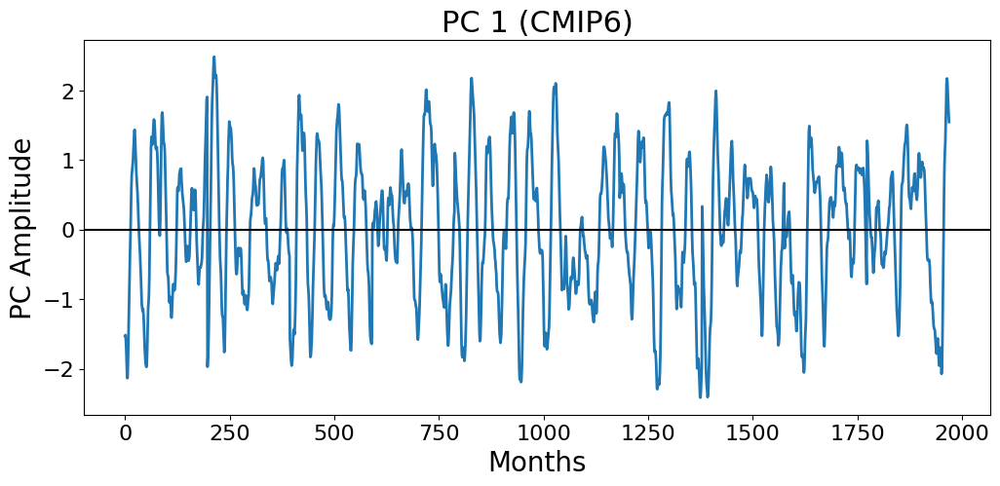

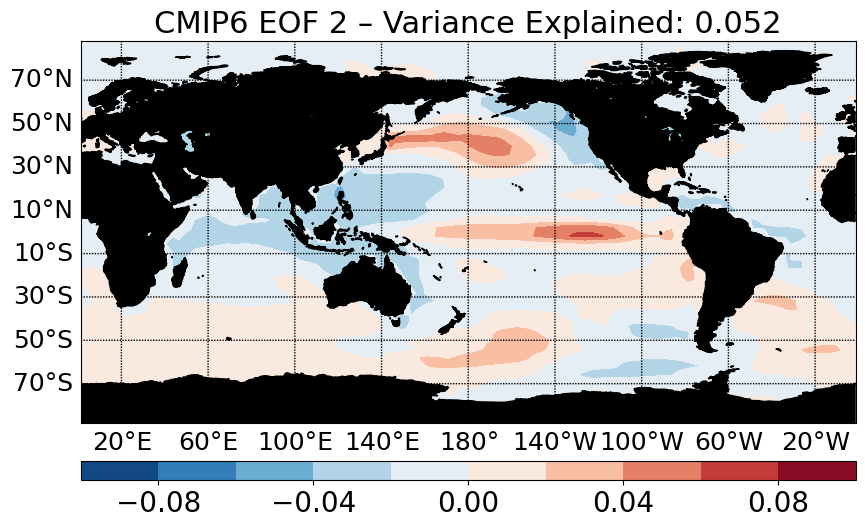

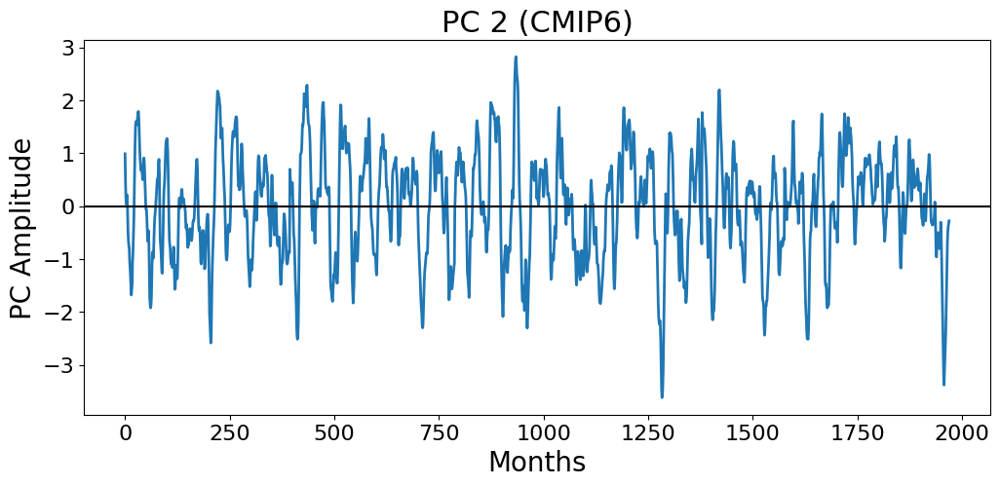

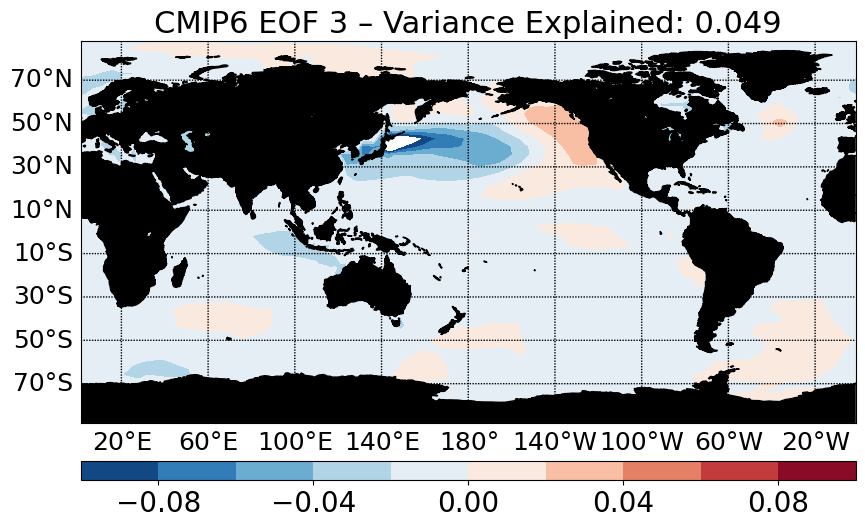

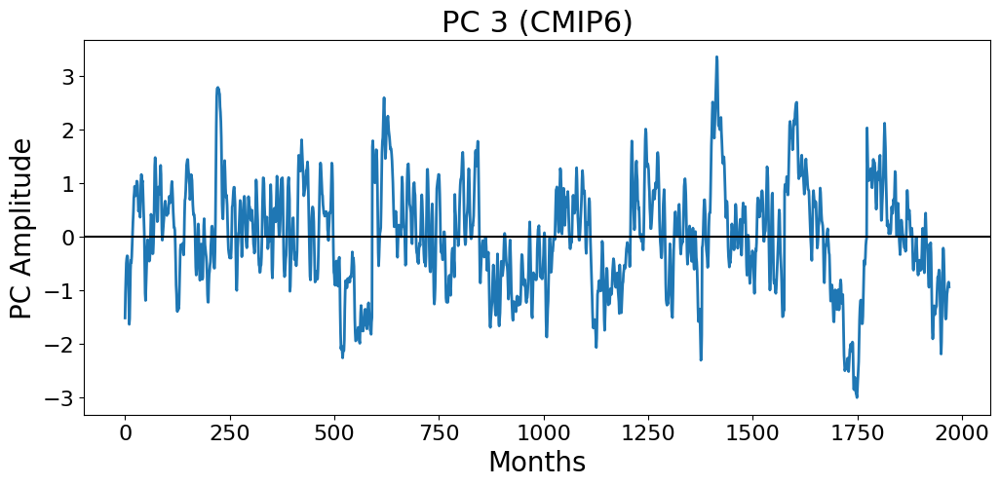

In [ ]:
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt

parallels = np.arange(-90, 90, 20)
meridians = np.arange(-180, 180, 40)

for i in range(3):

    # ---- EOF MAP ----
    fig = plt.figure(figsize=(10, 16))

    m = Basemap(
        projection='cyl',
        llcrnrlon=min(lon),
        llcrnrlat=min(lat),
        urcrnrlon=max(lon),
        urcrnrlat=max(lat),
        resolution='l'
    )

    x, y = m(*np.meshgrid(lon, lat))
    clevs = np.linspace(-0.1, 0.1, 11)

    cs = m.contourf(
        x, y, eofs[i, :, :],
        clevs, cmap=plt.cm.RdBu_r
    )

    m.drawcoastlines()
    m.fillcontinents(color='black', lake_color='lightblue')
    m.drawparallels(parallels, labels=[1,0,0,0], fontsize=18)
    m.drawmeridians(meridians, labels=[1,0,0,1], fontsize=18)

    cb = m.colorbar(cs, 'bottom', size='5%', pad='10%')
    cb.ax.tick_params(labelsize=20)

    plt.title(
        f"CMIP6 EOF {i+1} – Variance Explained: {varfrac[i]:.3f}",
        fontsize=22
    )

    plt.show()

    # ---- PC TIME SERIES ----
    plt.figure(figsize=(12, 5))
    plt.plot(pcs[:, i], linewidth=2)
    plt.axhline(0, color='k')

    plt.xlabel("Months", fontsize=20)
    plt.ylabel("PC Amplitude", fontsize=20)
    plt.title(f"PC {i+1} (CMIP6)", fontsize=22)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)

    plt.show()

/tmp/ipykernel_2794/89003633.py:43: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  red_sum[0,i]=rho*rzero+white
/tmp/ipykernel_2794/89003633.py:47: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  red_sum[j,i]=rho*red_sum[j-1,i]+white
/tmp/ipykernel_2794/89003633.py:92: RuntimeWarning: divide by zero encountered in divide
  period_Po=1/f
/tmp/ipykernel_2794/89003633.py:93: RuntimeWarning: divide by zero encountered in divide
  period_Pr=1/fr


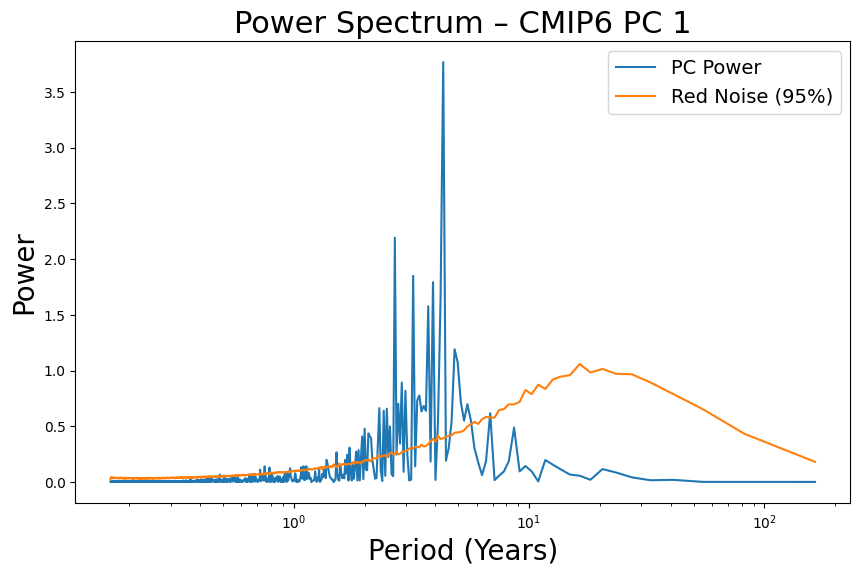

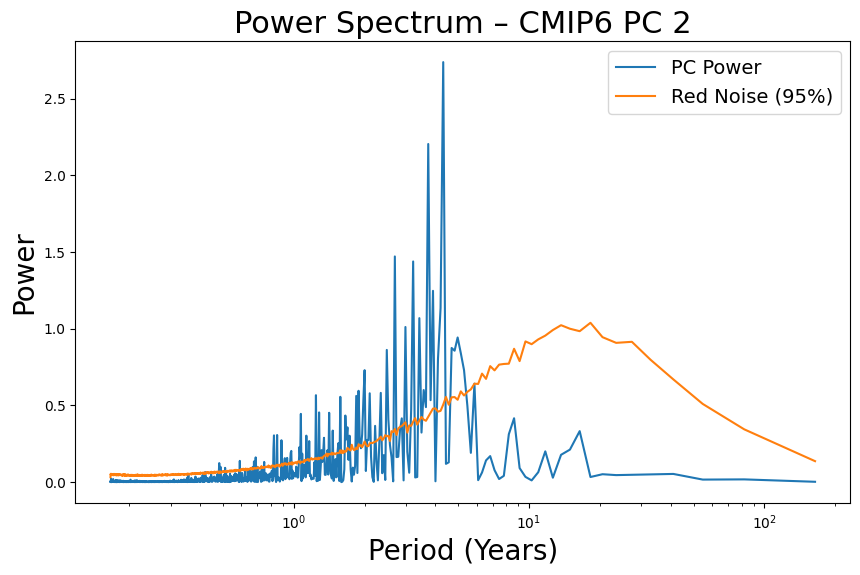

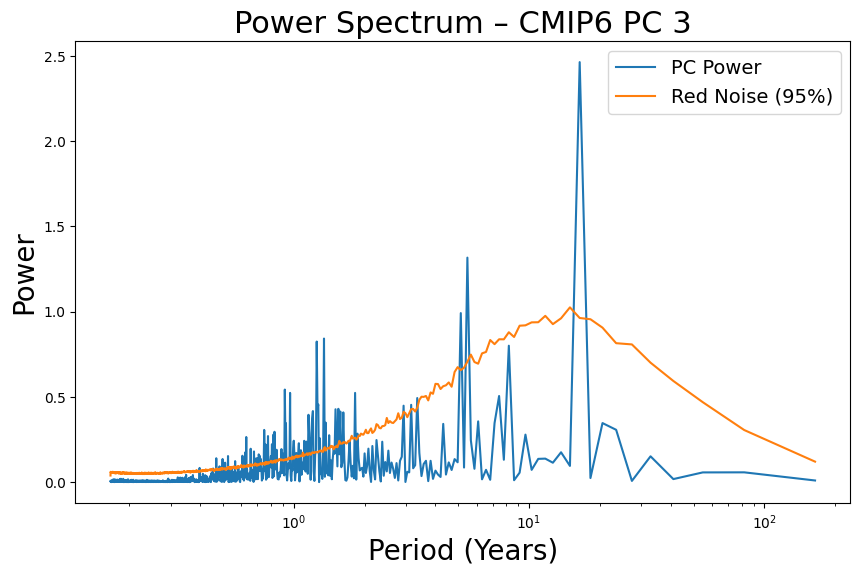

In [ ]:
for i in range(3):
    plot = cal_power_spect(pcs[:, i])

    plt.figure(figsize=(10, 6))
    plt.plot(plot[:, 0] / 12, plot[:, 1], label="PC Power")
    plt.plot(plot[:, 0] / 12, plot[:, 2], label="Red Noise (95%)")

    plt.xscale("log")
    plt.xlabel("Period (Years)", fontsize=20)
    plt.ylabel("Power", fontsize=20)
    plt.legend(fontsize=14)
    plt.title(f"Power Spectrum – CMIP6 PC {i+1}", fontsize=22)

    plt.show()

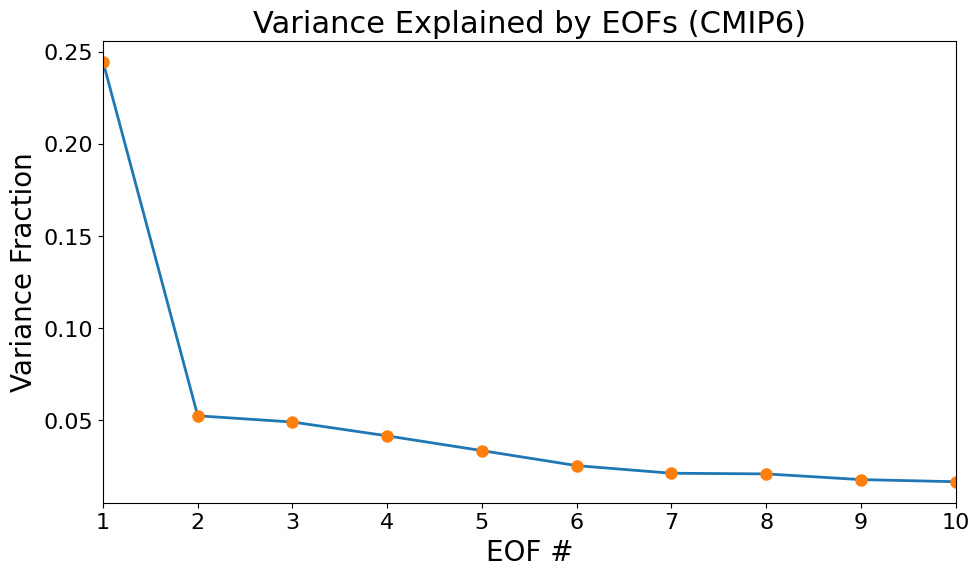

In [ ]:
plt.figure(figsize=(11, 6))

eof_num = np.arange(1, 11)

plt.plot(eof_num, varfrac[:10], linewidth=2)
plt.plot(
    eof_num, varfrac[:10],
    linestyle='None', marker='o',
    markersize=8
)

plt.xlabel("EOF #", fontsize=20)
plt.ylabel("Variance Fraction", fontsize=20)
plt.title("Variance Explained by EOFs (CMIP6)", fontsize=22)

plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.xlim(1, 10)
plt.show()

In [ ]:
import xarray as xr

load_path = "/content/drive/MyDrive/SST_Data/VAE_generated_samples.nc"

vae_anom_ds = xr.open_dataset(load_path)

print(vae_anom_ds)

<xarray.Dataset> Size: 55MB
Dimensions:   (ensemble: 10, time: 199, lat: 48, lon: 144)
Coordinates:
  * ensemble  (ensemble) int64 80B 0 1 2 3 4 5 6 7 8 9
  * time      (time) int64 2kB 0 1 2 3 4 5 6 7 ... 192 193 194 195 196 197 198
  * lat       (lat) float64 384B -88.12 -84.38 -80.62 ... 80.62 84.38 88.12
  * lon       (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
Data variables:
    sst       (ensemble, time, lat, lon) float32 55MB ...


In [ ]:
save_path_ori = "/content/drive/MyDrive/SST_Data/CMIP6_original_samples.nc"

ori_anom_ds.to_netcdf(save_path_ori)

print("Original samples saved successfully!")

Original samples saved successfully!


In [ ]:
import xarray as xr

load_path_ori = "/content/drive/MyDrive/SST_Data/CMIP6_original_samples.nc"

ori_anom_ds = xr.open_dataset(load_path_ori)

print(ori_anom_ds)

<xarray.Dataset> Size: 110MB
Dimensions:   (ensemble: 10, time: 199, lat: 48, lon: 144)
Coordinates:
  * ensemble  (ensemble) int64 80B 0 1 2 3 4 5 6 7 8 9
  * time      (time) int64 2kB 0 1 2 3 4 5 6 7 ... 192 193 194 195 196 197 198
  * lat       (lat) float64 384B -88.12 -84.38 -80.62 ... 80.62 84.38 88.12
  * lon       (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
Data variables:
    sst       (ensemble, time, lat, lon) float64 110MB ...


In [ ]:
import numpy as np

vae = vae_anom_ds["sst"].values
ori = ori_anom_ds["sst"].values

print("Same shape:", vae.shape == ori.shape)

print("Max absolute difference:",
      np.max(np.abs(vae - ori)))

print("Mean absolute difference:",
      np.mean(np.abs(vae - ori)))

print("Are arrays exactly equal:",
      np.array_equal(vae, ori))

Same shape: True
Max absolute difference: 11.062340329106782
Mean absolute difference: 0.3864043001695371
Are arrays exactly equal: False


In [ ]:
obs_anom_ds = xr.open_dataset(
    "/content/drive/MyDrive/SST_Data/COBE_SST_resize.nc",
    decode_times=False
)

In [ ]:
print("VAE Dataset:")
print(vae_anom_ds)
print()

print("CMIP6 Dataset:")
print(ori_anom_ds)
print()

print("OBS Dataset:")
print(obs_anom_ds)

VAE Dataset:
<xarray.Dataset> Size: 55MB
Dimensions:   (ensemble: 10, time: 199, lat: 48, lon: 144)
Coordinates:
  * ensemble  (ensemble) int64 80B 0 1 2 3 4 5 6 7 8 9
  * time      (time) int64 2kB 0 1 2 3 4 5 6 7 ... 192 193 194 195 196 197 198
  * lat       (lat) float64 384B -88.12 -84.38 -80.62 ... 80.62 84.38 88.12
  * lon       (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
Data variables:
    sst       (ensemble, time, lat, lon) float32 55MB 0.004002 ... 0.01428

CMIP6 Dataset:
<xarray.Dataset> Size: 110MB
Dimensions:   (ensemble: 10, time: 199, lat: 48, lon: 144)
Coordinates:
  * ensemble  (ensemble) int64 80B 0 1 2 3 4 5 6 7 8 9
  * time      (time) int64 2kB 0 1 2 3 4 5 6 7 ... 192 193 194 195 196 197 198
  * lat       (lat) float64 384B -88.12 -84.38 -80.62 ... 80.62 84.38 88.12
  * lon       (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
Data variables:
    sst       (ensemble, time, lat, lon) float64 110MB 0.0 0.0 ... -0.006414

OBS D

In [ ]:
print(obs_anom_ds.time.attrs)

{'standard_name': 'time', 'long_name': 'Time', 'units': 'days since 1891-1-1 00:00:00', 'calendar': 'standard', 'axis': 'T'}


In [ ]:
import pandas as pd

test_time = pd.date_range(
    start="1990-01-01",
    periods=199,
    freq="MS"
)

vae_anom_ds = vae_anom_ds.assign_coords(time=test_time)
ori_anom_ds = ori_anom_ds.assign_coords(time=test_time)

In [ ]:
obs_anom_ds = xr.open_dataset(
    "/content/drive/MyDrive/SST_Data/COBE_SST_resize.nc",
    decode_times=True
)

print(obs_anom_ds.time.dtype)
print(obs_anom_ds.time.values[:5])

datetime64[ns]
['1850-01-01T00:00:00.000000000' '1850-02-01T00:00:00.000000000'
 '1850-03-01T00:00:00.000000000' '1850-04-01T00:00:00.000000000'
 '1850-05-01T00:00:00.000000000']


In [ ]:
import pandas as pd


test_time = pd.date_range(
    start="1990-01-01",
    periods=199,
    freq="MS"
)


vae_anom_ds = vae_anom_ds.assign_coords(time=test_time)
ori_anom_ds = ori_anom_ds.assign_coords(time=test_time)

print("VAE time range:", vae_anom_ds.time[0].values,
      "→", vae_anom_ds.time[-1].values)

VAE time range: 1990-01-01T00:00:00.000000000 → 2006-07-01T00:00:00.000000000


In [ ]:
print("Original time range:", ori_anom_ds.time[0].values,
      "→", ori_anom_ds.time[-1].values)

Original time range: 1990-01-01T00:00:00.000000000 → 2006-07-01T00:00:00.000000000


In [ ]:
test_time = pd.date_range("1990-01-01", periods=199, freq="MS")

In [ ]:
obs_test = obs_anom_ds.sel(
    time=slice(test_time[0], test_time[-1])
)

print("OBS test length:", len(obs_test.time))

OBS test length: 199


In [ ]:
assert np.all(vae_anom_ds.time.values == obs_test.time.values)
assert np.all(ori_anom_ds.time.values == obs_test.time.values)

print("All datasets aligned correctly ")

All datasets aligned correctly 


In [ ]:
print("=== VAE Dataset ===")
print(vae_anom_ds)
print()

print("=== CMIP6 Dataset ===")
print(ori_anom_ds)
print()

print("=== OBS Test Dataset ===")
print(obs_test)
print()

=== VAE Dataset ===
<xarray.Dataset> Size: 55MB
Dimensions:   (ensemble: 10, time: 199, lat: 48, lon: 144)
Coordinates:
  * ensemble  (ensemble) int64 80B 0 1 2 3 4 5 6 7 8 9
  * time      (time) datetime64[ns] 2kB 1990-01-01 1990-02-01 ... 2006-07-01
  * lat       (lat) float64 384B -88.12 -84.38 -80.62 ... 80.62 84.38 88.12
  * lon       (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
Data variables:
    sst       (ensemble, time, lat, lon) float32 55MB 0.004002 ... 0.05307

=== CMIP6 Dataset ===
<xarray.Dataset> Size: 110MB
Dimensions:   (ensemble: 10, time: 199, lat: 48, lon: 144)
Coordinates:
  * ensemble  (ensemble) int64 80B 0 1 2 3 4 5 6 7 8 9
  * time      (time) datetime64[ns] 2kB 1990-01-01 1990-02-01 ... 2006-07-01
  * lat       (lat) float64 384B -88.12 -84.38 -80.62 ... 80.62 84.38 88.12
  * lon       (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
Data variables:
    sst       (ensemble, time, lat, lon) float64 110MB 0.0 0.0 ... -0.006

In [ ]:
print("VAE sst shape:", vae_anom_ds["sst"].shape)
print("CMIP6 sst shape:", ori_anom_ds["sst"].shape)
print("OBS sst shape:", obs_test["sst"].shape)

VAE sst shape: (10, 199, 48, 144)
CMIP6 sst shape: (10, 199, 48, 144)
OBS sst shape: (199, 48, 144)


In [ ]:
print("VAE time:", vae_anom_ds.time[0].values, "→", vae_anom_ds.time[-1].values)
print("CMIP6 ti|me:", ori_anom_ds.time[0].values, "→", ori_anom_ds.time[-1].values)
print("OBS time:", obs_test.time[0].values, "→", obs_test.time[-1].values)

VAE time: 1990-01-01T00:00:00.000000000 → 2006-07-01T00:00:00.000000000
CMIP6 ti|me: 1990-01-01T00:00:00.000000000 → 2006-07-01T00:00:00.000000000
OBS time: 1990-01-01T00:00:00.000000000 → 2006-07-01T00:00:00.000000000


In [ ]:
vae_sst = vae_anom_ds["sst"]
cmip_sst = ori_anom_ds["sst"]
obs_sst = obs_test["sst"]

In [ ]:
vae  = vae_sst.rolling(time=3, center=True).mean().isel(time=slice(1, -1))
cmip = cmip_sst.rolling(time=3, center=True).mean().isel(time=slice(1, -1))
obs  = obs_sst.rolling(time=3, center=True).mean().isel(time=slice(1, -1))

In [ ]:
vae, cmip, obs = xr.align(vae, cmip, obs, join="inner")

In [ ]:
print("VAE shape:", vae.shape)
print("CMIP6 shape:", cmip.shape)
print("OBS shape:", obs.shape)

VAE shape: (10, 197, 48, 144)
CMIP6 shape: (10, 197, 48, 144)
OBS shape: (197, 48, 144)


In [ ]:
print("VAE first 5 times:", vae.time.values[:5])
print("OBS first 5 times:", obs.time.values[:5])

print("VAE last 5 times:", vae.time.values[-5:])
print("OBS last 5 times:", obs.time.values[-5:])

VAE first 5 times: ['1990-02-01T00:00:00.000000000' '1990-03-01T00:00:00.000000000'
 '1990-04-01T00:00:00.000000000' '1990-05-01T00:00:00.000000000'
 '1990-06-01T00:00:00.000000000']
OBS first 5 times: ['1990-02-01T00:00:00.000000000' '1990-03-01T00:00:00.000000000'
 '1990-04-01T00:00:00.000000000' '1990-05-01T00:00:00.000000000'
 '1990-06-01T00:00:00.000000000']
VAE last 5 times: ['2006-02-01T00:00:00.000000000' '2006-03-01T00:00:00.000000000'
 '2006-04-01T00:00:00.000000000' '2006-05-01T00:00:00.000000000'
 '2006-06-01T00:00:00.000000000']
OBS last 5 times: ['2006-02-01T00:00:00.000000000' '2006-03-01T00:00:00.000000000'
 '2006-04-01T00:00:00.000000000' '2006-05-01T00:00:00.000000000'
 '2006-06-01T00:00:00.000000000']


In [ ]:
print(vae.time.equals(obs.time))
print(cmip.time.equals(obs.time))

True
True


In [ ]:
bias_cmip_obs = cmip - obs
bias_vae_obs  = vae  - obs

In [ ]:
mean_bias_cmip_obs = bias_cmip_obs.mean(dim=("ensemble","time"))
mean_bias_vae_obs  = bias_vae_obs.mean(dim=("ensemble","time"))

In [ ]:
std_bias_cmip_obs = bias_cmip_obs.std(dim=("ensemble","time"))
std_bias_vae_obs  = bias_vae_obs.std(dim=("ensemble","time"))

/usr/local/lib/python3.12/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.12/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


In [ ]:
print("CMIP6–COBE |Mean Bias|:",
      float(np.abs(mean_bias_cmip_obs).mean()))

print("VAE–COBE |Mean Bias|:",
      float(np.abs(mean_bias_vae_obs).mean()))

print("CMIP6–COBE Bias STD:",
      float(std_bias_cmip_obs.mean()))

print("VAE–COBE Bias STD:",
      float(std_bias_vae_obs.mean()))

CMIP6–COBE |Mean Bias|: 14.163711566574909
VAE–COBE |Mean Bias|: 14.296378135681152
CMIP6–COBE Bias STD: 1.3581583455925406
VAE–COBE Bias STD: 1.3764365911483765


In [ ]:
lat_sst = obs.lat.values
lon_sst = obs.lon.values

In [ ]:
mean_bias_cmip_np = mean_bias_cmip_obs.values
mean_bias_vae_np  = mean_bias_vae_obs.values

std_bias_cmip_np  = std_bias_cmip_obs.values
std_bias_vae_np   = std_bias_vae_obs.values

In [ ]:
mean_bias_abs = np.nanmax(
    np.abs(
        np.stack([mean_bias_cmip_np, mean_bias_vae_np])
    )
)

In [ ]:
std_bias_max = max(
    np.nanmax(std_bias_cmip_np),
    np.nanmax(std_bias_vae_np)
)

In [ ]:
def plot_diverging_map(
    lon, lat, data,
    vabs,
    title, file_name,
    cmap="RdBu_r"
):
    m = Basemap(
        projection="cyl",
        llcrnrlat=lat.min(),
        urcrnrlat=lat.max(),
        llcrnrlon=lon.min(),
        urcrnrlon=lon.max(),
        resolution="l"
    )

    lons, lats = np.meshgrid(lon, lat)
    x, y = m(lons, lats)

    levels = np.linspace(-vabs, vabs, 21)

    cs = m.contourf(
        x, y, data,
        levels=levels,
        cmap=cmap,
        extend="both"
    )

    cb = m.colorbar(cs, "bottom", size="12%", pad="8%")
    cb.set_label("Mean Bias (°C)")

    m.drawcoastlines()
    m.drawparallels(np.arange(-90, 91, 30), labels=[1,0,0,0])
    m.drawmeridians(np.arange(0, 361, 45), labels=[0,0,0,1])

    plt.title(title)
    plt.savefig(file_name, dpi=300, bbox_inches="tight")
    plt.show()
    plt.clf()

In [ ]:
def plot_sequential_map(
    lon, lat, data,
    vmax,
    title, file_name,
    cmap="YlOrRd"
):
    m = Basemap(
        projection="cyl",
        llcrnrlat=lat.min(),
        urcrnrlat=lat.max(),
        llcrnrlon=lon.min(),
        urcrnrlon=lon.max(),
        resolution="l"
    )

    lons, lats = np.meshgrid(lon, lat)
    x, y = m(lons, lats)

    levels = np.linspace(0.0, vmax, 21)

    cs = m.contourf(
        x, y, data,
        levels=levels,
        cmap=cmap,
        extend="max"
    )

    cb = m.colorbar(cs, "bottom", size="12%", pad="8%")
    cb.set_label("STD of Bias (°C)")

    m.drawcoastlines()
    m.drawparallels(np.arange(-90, 91, 30), labels=[1,0,0,0])
    m.drawmeridians(np.arange(0, 361, 45), labels=[0,0,0,1])

    plt.title(title)
    plt.savefig(file_name, dpi=300, bbox_inches="tight")
    plt.show()
    plt.clf()

In [ ]:
mean_bias_abs = np.nanmax(
    np.abs([
        mean_bias_cmip_obs,
        mean_bias_vae_obs
    ])
)


std_bias_max = max(
    np.nanmax(std_bias_cmip_obs),
    np.nanmax(std_bias_vae_obs)
)

In [ ]:
import xarray as xr
import numpy as np
import pandas as pd

obs_anom_ds = xr.open_dataset(
    "/content/drive/MyDrive/SST_Data/COBE_SST_resize.nc",
    decode_times=True
)

obs_sst = obs_anom_ds["sst"]

In [ ]:
test_time = pd.date_range(
    start="1990-01-01",
    periods=199,
    freq="MS"
)

In [ ]:
vae_anom_ds = vae_anom_ds.assign_coords(time=test_time)
ori_anom_ds = ori_anom_ds.assign_coords(time=test_time)

In [ ]:
obs_test = obs_sst.sel(
    time=slice(test_time[0], test_time[-1])
)

In [ ]:
assert np.all(vae_anom_ds.time.values == obs_test.time.values)
assert np.all(ori_anom_ds.time.values == obs_test.time.values)

In [ ]:
obs_clim = obs_test.groupby("time.month").mean("time")

In [ ]:
obs_anom = obs_test.groupby("time.month") - obs_clim

In [ ]:
vae_sst  = vae_anom_ds["sst"]
cmip_sst = ori_anom_ds["sst"]

In [ ]:
vae  = vae_sst.rolling(time=3, center=True).mean().isel(time=slice(1, -1))
cmip = cmip_sst.rolling(time=3, center=True).mean().isel(time=slice(1, -1))
obs  = obs_anom.rolling(time=3, center=True).mean().isel(time=slice(1, -1))

In [ ]:
print("VAE shape:", vae.shape)
print("CMIP6 shape:", cmip.shape)
print("OBS shape:", obs.shape)

VAE shape: (10, 197, 48, 144)
CMIP6 shape: (10, 197, 48, 144)
OBS shape: (197, 48, 144)


In [ ]:
vae, cmip, obs = xr.align(vae, cmip, obs, join="inner")

In [ ]:
bias_cmip_obs = cmip - obs
bias_vae_obs  = vae  - obs

In [ ]:
mean_bias_cmip = bias_cmip_obs.mean(dim=("ensemble","time"))
mean_bias_vae  = bias_vae_obs.mean(dim=("ensemble","time"))

In [ ]:
std_bias_cmip = bias_cmip_obs.std(dim=("ensemble","time"))
std_bias_vae  = bias_vae_obs.std(dim=("ensemble","time"))

/usr/local/lib/python3.12/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.12/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


In [ ]:
mean_bias_cmip_np = mean_bias_cmip.values
mean_bias_vae_np  = mean_bias_vae.values

In [ ]:
std_bias_cmip_np  = std_bias_cmip.values
std_bias_vae_np   = std_bias_vae.values

In [ ]:
print("CMIP6–OBS |Mean Bias|:",
      float(np.nanmean(np.abs(mean_bias_cmip_np))))

print("VAE–OBS |Mean Bias|:",
      float(np.nanmean(np.abs(mean_bias_vae_np))))

print("CMIP6–OBS Bias STD:",
      float(np.nanmean(std_bias_cmip_np)))

print("VAE–OBS Bias STD:",
      float(np.nanmean(std_bias_vae_np)))

CMIP6–OBS |Mean Bias|: 0.08470100874673145
VAE–OBS |Mean Bias|: 0.11229848116636276
CMIP6–OBS Bias STD: 0.5684893281368265
VAE–OBS Bias STD: 0.590412437915802


In [ ]:
mask = np.isnan(obs.mean(dim="time").values)

mean_bias_cmip_np = np.where(mask, np.nan, mean_bias_cmip_np)
mean_bias_vae_np  = np.where(mask, np.nan, mean_bias_vae_np)

In [ ]:
mean_bias_abs = np.nanmax(
    np.abs(
        np.stack([mean_bias_cmip_np, mean_bias_vae_np])
    )
)

In [ ]:
mean_bias_abs = min(mean_bias_abs, 2.0)

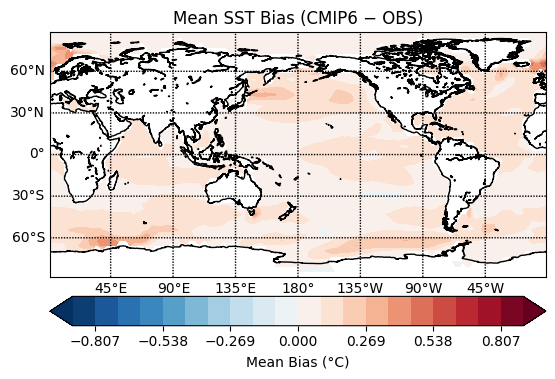

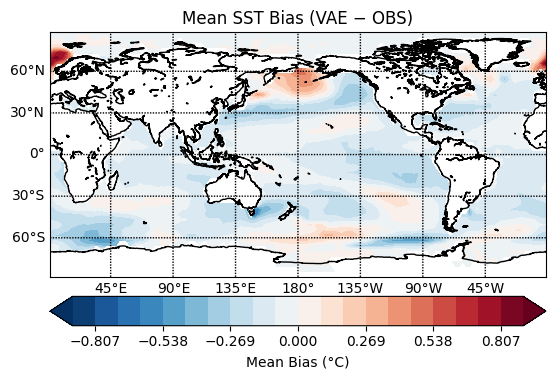

<Figure size 640x480 with 0 Axes>

In [ ]:
plot_diverging_map(
    lon_sst,
    lat_sst,
    mean_bias_cmip_np,
    mean_bias_abs,
    title="Mean SST Bias (CMIP6 − OBS)",
    file_name="/content/drive/MyDrive/VAE_Output/Mean_Bias_CMIP6_OBS.png"
)

plot_diverging_map(
    lon_sst,
    lat_sst,
    mean_bias_vae_np,
    mean_bias_abs,
    title="Mean SST Bias (VAE − OBS)",
    file_name="/content/drive/MyDrive/VAE_Output/Mean_Bias_VAE_OBS.png"
)

In [ ]:
mean_bias_cmip_abs = np.abs(mean_bias_cmip_np)
mean_bias_vae_abs  = np.abs(mean_bias_vae_np)

In [ ]:
mean_bias_cmip_abs = np.where(mask, np.nan, mean_bias_cmip_abs)
mean_bias_vae_abs  = np.where(mask, np.nan, mean_bias_vae_abs)

In [ ]:
mean_bias_abs = np.nanmax([
    mean_bias_cmip_abs,
    mean_bias_vae_abs
])

mean_bias_abs = min(mean_bias_abs, 2.0)

In [ ]:
def plot_sequential_map(lon, lat, data, vmax, title, file_name):

    fig, ax = plt.subplots(figsize=(10,5))

    m = Basemap(
        projection='cyl',
        llcrnrlat=lat.min(),
        urcrnrlat=lat.max(),
        llcrnrlon=lon.min(),
        urcrnrlon=lon.max(),
        resolution='l',
        ax=ax
    )

    x, y = m(*np.meshgrid(lon, lat))

    cs = m.contourf(
        x, y, data,
        levels=np.linspace(0, vmax, 21),
        cmap="viridis",
        extend="max"
    )

    m.drawcoastlines()

    cbar = plt.colorbar(cs, orientation="horizontal", pad=0.05)
    cbar.set_label("Absolute SST Bias (°C)")

    plt.title(title)

    plt.savefig(file_name, dpi=300, bbox_inches="tight")
    plt.show()

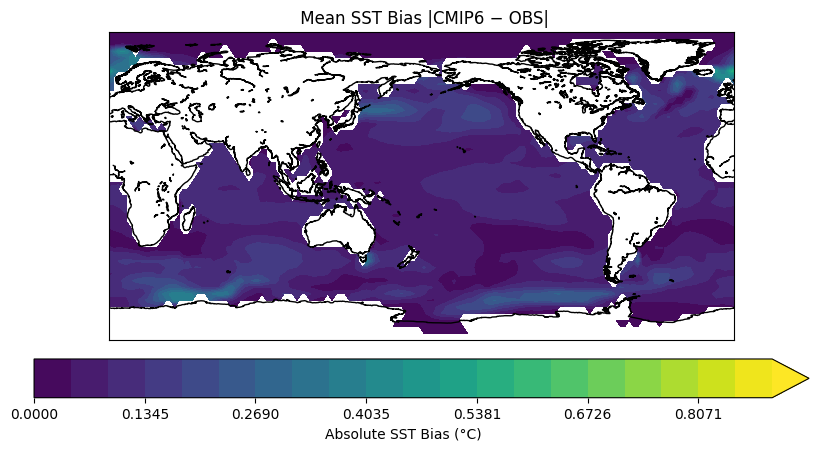

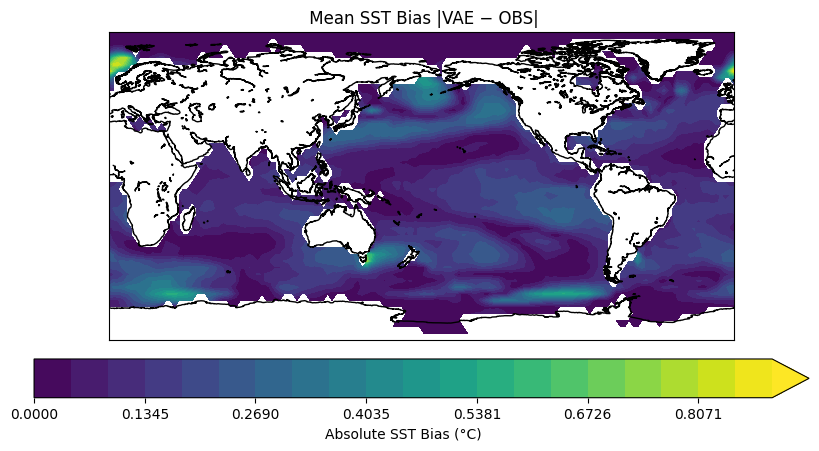

In [ ]:
plot_sequential_map(
    lon_sst,
    lat_sst,
    mean_bias_cmip_abs,
    mean_bias_abs,
    title=" Mean SST Bias |CMIP6 − OBS|",
    file_name="/content/drive/MyDrive/VAE_Output/Abs_Mean_Bias_CMIP6_OBS.png"
)

plot_sequential_map(
    lon_sst,
    lat_sst,
    mean_bias_vae_abs,
    mean_bias_abs,
    title=" Mean SST Bias |VAE − OBS|",
    file_name="/content/drive/MyDrive/VAE_Output/Abs_Mean_Bias_VAE_OBS.png"
)

In [ ]:
mask = np.isnan(obs.mean(dim="time").values)

std_bias_cmip_np = np.where(mask, np.nan, std_bias_cmip_np)
std_bias_vae_np  = np.where(mask, np.nan, std_bias_vae_np)

In [ ]:
std_bias_max = np.nanmax(
    np.stack([std_bias_cmip_np, std_bias_vae_np])
)

In [ ]:
std_bias_max = min(std_bias_max, 3)

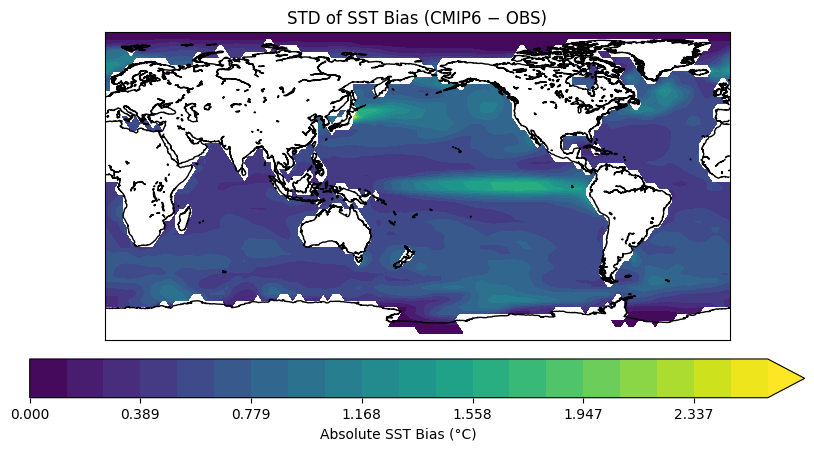

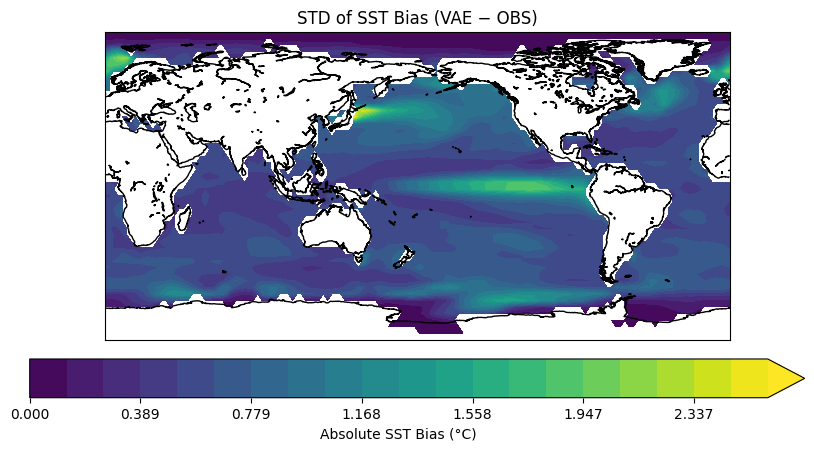

In [ ]:
plot_sequential_map(
    lon_sst,
    lat_sst,
    std_bias_cmip_np,
    std_bias_max,
    title="STD of SST Bias (CMIP6 − OBS)",
    file_name="/content/drive/MyDrive/VAE_Output/STD_Bias_CMIP6_OBS.png"
)

plot_sequential_map(
    lon_sst,
    lat_sst,
    std_bias_vae_np,
    std_bias_max,
    title="STD of SST Bias (VAE − OBS)",
    file_name="/content/drive/MyDrive/VAE_Output/STD_Bias_VAE_OBS.png"
)

In [ ]:
print("CMIP STD range:",
      np.nanmin(std_bias_cmip_np),
      np.nanmax(std_bias_cmip_np))

print("VAE STD range:",
      np.nanmin(std_bias_vae_np),
      np.nanmax(std_bias_vae_np))

CMIP STD range: 0.0 2.3830004613388702
VAE STD range: 0.009281242 2.596651


**ONI Plots**

In [ ]:
# Niño 3.4 region
lat_bounds = slice(-5.0, 5.0)
lon_bounds = slice(170, 240)


ONI_gen = (
    vae_anom_ds_3mo_avg
    .sel(lat=lat_bounds, lon=lon_bounds)
    ['sst']
    .mean(dim=['lat', 'lon'])
)


ONI_ori = (
    ori_anom_ds_3mo_avg
    .sel(lat=lat_bounds, lon=lon_bounds)
    ['sst']
    .mean(dim=['lat', 'lon'])
)

In [ ]:
print(ONI_gen.shape)
print(ONI_ori.shape)

(10, 2398)
(10, 197)


In [ ]:
ONI_gen_np = ONI_gen.values
ONI_ori_np = ONI_ori.values

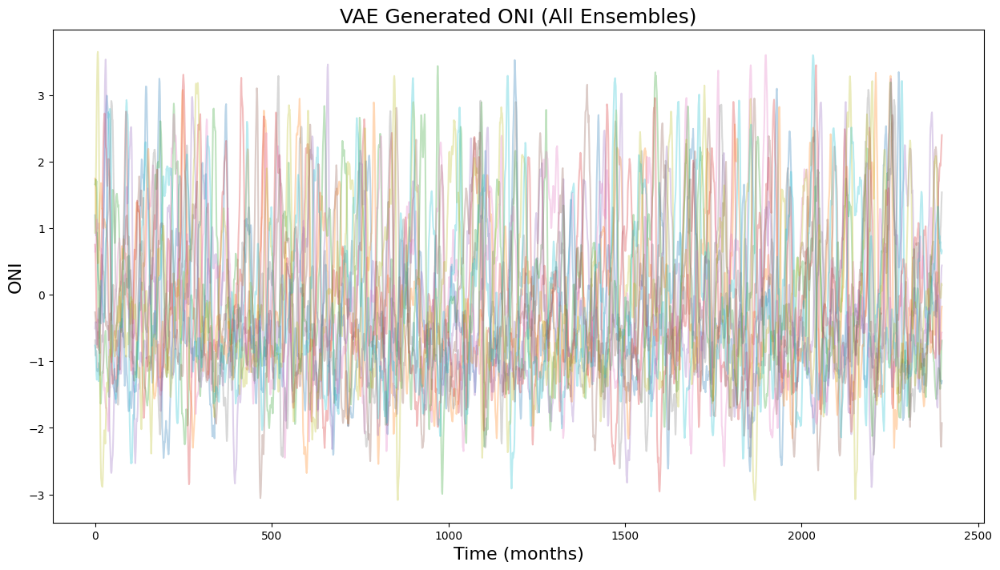

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(15,8))

for i in range(ONI_gen.shape[0]):
    plt.plot(ONI_gen[i], alpha=0.3)

plt.xlabel('Time (months)', fontsize=16)
plt.ylabel('ONI', fontsize=16)
plt.title('VAE Generated ONI (All Ensembles)', fontsize=18)
plt.show()

In [ ]:
ONI_gen_mean = ONI_gen.mean(dim='ensemble')
ONI_gen_std  = ONI_gen.std(dim='ensemble')

ONI_ori_mean = ONI_ori.mean(dim='ensemble')
ONI_ori_std  = ONI_ori.std(dim='ensemble')

In [ ]:
def compute_mean_spectrum(ONI_data):
    spectra = []

    for i in range(ONI_data.shape[0]):
        ts = ONI_data[i]


        ts = ts[~np.isnan(ts)]

        plot = cal_power_spect(ts)

        spectra.append(plot[:,1])

    spectra = np.array(spectra)
    mean_spectrum = spectra.mean(axis=0)
    red_noise = plot[:,2]
    freq = plot[:,0]
    return freq, mean_spectrum, red_noise

In [ ]:
freq_gen, spec_gen, red_gen = compute_mean_spectrum(ONI_gen_np)
freq_ori, spec_ori, red_ori = compute_mean_spectrum(ONI_ori_np)

/tmp/ipykernel_4701/1566020566.py:67: RuntimeWarning: divide by zero encountered in divide
  period = 1.0 / f


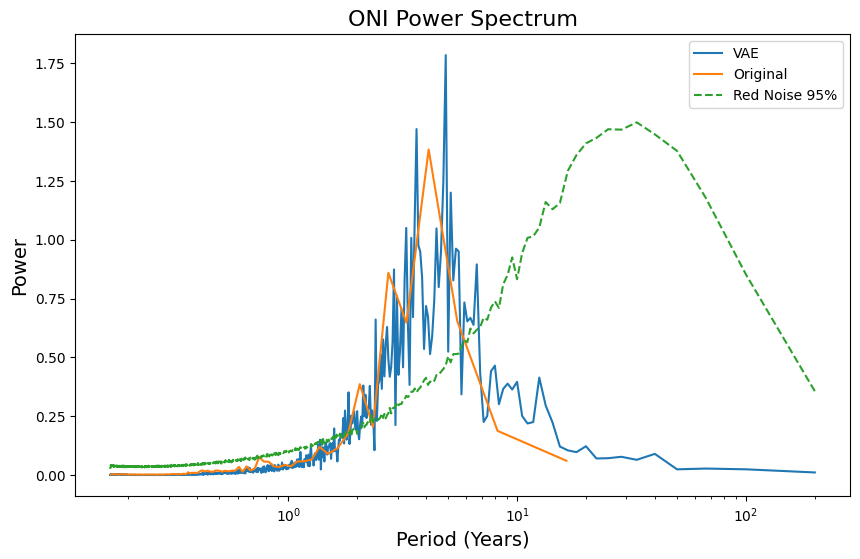

In [ ]:
plt.figure(figsize=(10,6))

plt.plot(freq_gen/12, spec_gen, label='VAE')
plt.plot(freq_ori/12, spec_ori, label='Original')
plt.plot(freq_gen/12, red_gen, '--', label='Red Noise 95%')

plt.xscale('log')
plt.xlabel('Period (Years)', fontsize=14)
plt.ylabel('Power', fontsize=14)
plt.legend()
plt.title('ONI Power Spectrum', fontsize=16)

plt.show()

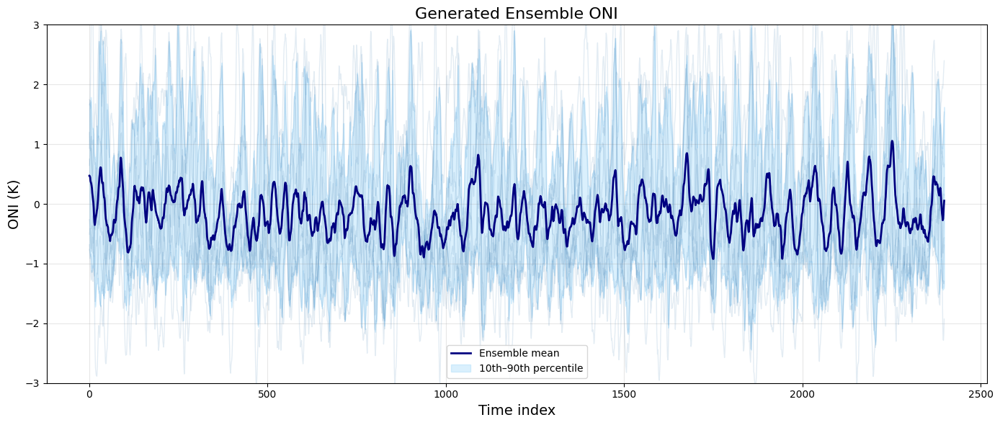

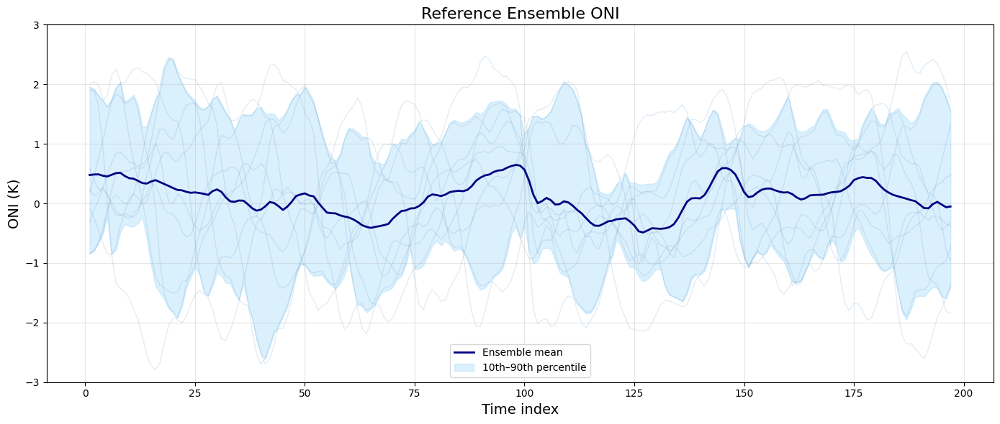

In [ ]:
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def maybe_wrap_longitude(ds, lon_name="lon"):
    """Ensure longitudes are within 0-360 so slicing 170-240 works."""
    lon = ds.coords[lon_name]
    if lon.min() < 0:
        ds = ds.assign_coords({lon_name: (lon % 360)})
        ds = ds.sortby(lon_name)
    return ds

def compute_oni_series(
    ds,
    lat_bounds=(-5, 5),
    lon_bounds=(170, 240),
    rolling_window=3,
    ensemble_dim="ensemble",
    time_dim="time",
    lat_name="lat",
    lon_name="lon",
    weight_lat=True,
):
    """
    Compute ONI for an ensemble xarray.Dataset with an SST anomaly variable.

    Parameters
    ----------
    ds : xr.Dataset
        Must contain an 'sst' variable with dims (..., time, lat, lon).
    lat_bounds, lon_bounds : tuple of floats
        Geographic bounds for the Niño 3.4 region.
    rolling_window : int
        Size of the running mean in time (3 months is canonical).
    ensemble_dim, time_dim, lat_name, lon_name : str
        Name of the corresponding dimensions.
    weight_lat : bool
        If True, weight area average by cos(latitude).

    Returns
    -------
    oni_ds : xr.Dataset
        Contains ONI for each ensemble member plus optional ensemble stats.
    """

    ds = maybe_wrap_longitude(ds, lon_name=lon_name)


    sst_smoothed = (
        ds["sst"]
        .rolling({time_dim: rolling_window}, center=True)
        .mean()
        .dropna(time_dim, how="all")
    )


    sst_nino34 = sst_smoothed.sel(
        {lat_name: slice(lat_bounds[0], lat_bounds[1]),
         lon_name: slice(lon_bounds[0], lon_bounds[1])}
    )


    if weight_lat:
        weights = np.cos(np.deg2rad(sst_nino34[lat_name]))
        sst_weighted = sst_nino34.weighted(weights)
        oni = sst_weighted.mean(dim=[lat_name, lon_name])
    else:
        oni = sst_nino34.mean(dim=[lat_name, lon_name])


    oni_ds = oni.to_dataset(name="oni")
    if ensemble_dim in oni.dims:
        oni_ds["oni_mean"] = oni.mean(dim=ensemble_dim)
        oni_ds["oni_std"] = oni.std(dim=ensemble_dim)
        oni_ds["oni_p10"] = oni.quantile(0.10, dim=ensemble_dim)
        oni_ds["oni_p90"] = oni.quantile(0.90, dim=ensemble_dim)

    return oni_ds

def plot_oni(oni_ds, time_dim="time", ensemble_dim="ensemble", title="ONI"):
    """Quick plot for ensemble ONI with mean ± spread."""
    fig, ax = plt.subplots(figsize=(14, 6))
    time_values = oni_ds[time_dim]


    if ensemble_dim in oni_ds["oni"].dims:
        for ens in oni_ds[ensemble_dim]:
            ax.plot(
                time_values,
                oni_ds["oni"].sel({ensemble_dim: ens}),
                color="steelblue",
                alpha=0.15,
                linewidth=1,
            )


    if "oni_mean" in oni_ds:
        ax.plot(time_values, oni_ds["oni_mean"], color="navy", linewidth=2, label="Ensemble mean")
    if "oni_p10" in oni_ds:
        ax.fill_between(
            time_values,
            oni_ds["oni_p10"],
            oni_ds["oni_p90"],
            color="lightskyblue",
            alpha=0.3,
            label="10th–90th percentile"
        )

    ax.set_ylim(-3, 3)
    ax.set_xlabel("Time index", fontsize=14)
    ax.set_ylabel("ONI (K)", fontsize=14)
    ax.set_title(title, fontsize=16)
    ax.grid(True, alpha=0.3)
    ax.legend()
    plt.tight_layout()
    plt.show()


oni_generated = compute_oni_series(vae_anom_ds)
oni_reference = compute_oni_series(ori_anom_ds)


plot_oni(oni_generated, title="Generated Ensemble ONI")
plot_oni(oni_reference, title="Reference Ensemble ONI")

Lon range: 1.25 to 358.75
ONI VAE shape: (10, 2400)
ONI ORI shape: (10, 199)
ONI VAE std per ensemble:
 [1.060495  1.0723175 1.1571361 1.1873496 1.152033  1.1508143 1.083316
 1.0778184 1.2438692 1.2326533]
ONI ORI std per ensemble:
 [1.07163214 1.02145142 1.19448558 0.95042871 1.26944336 1.10869527
 1.21231249 0.93517768 1.00683245 1.08426694]


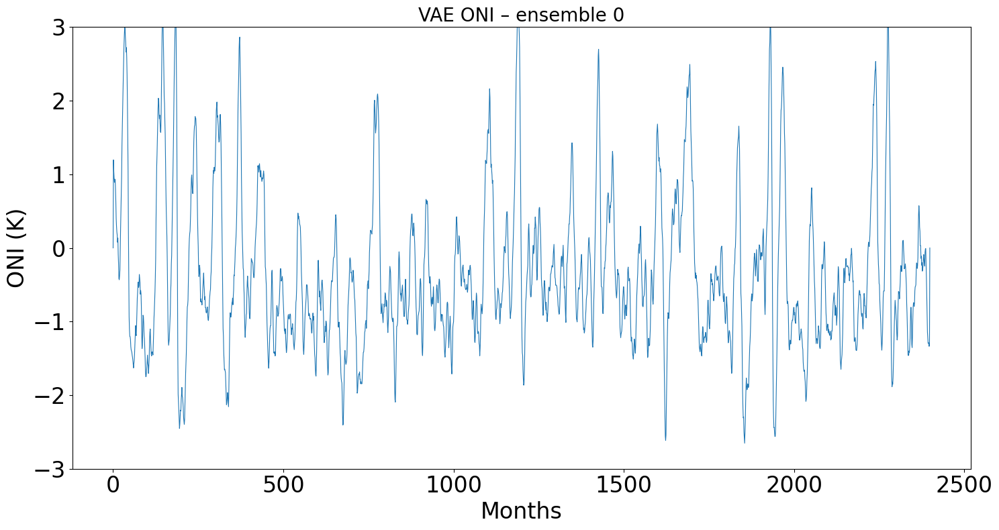

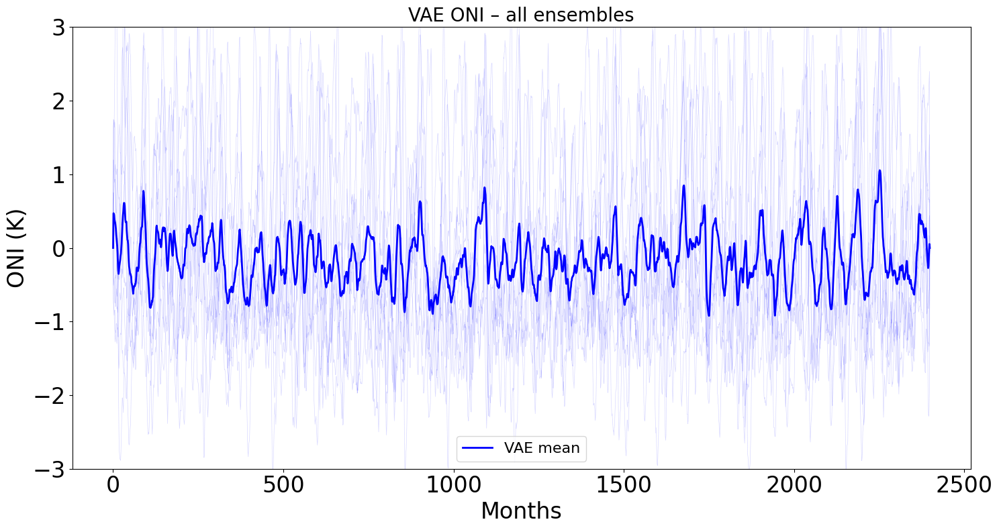

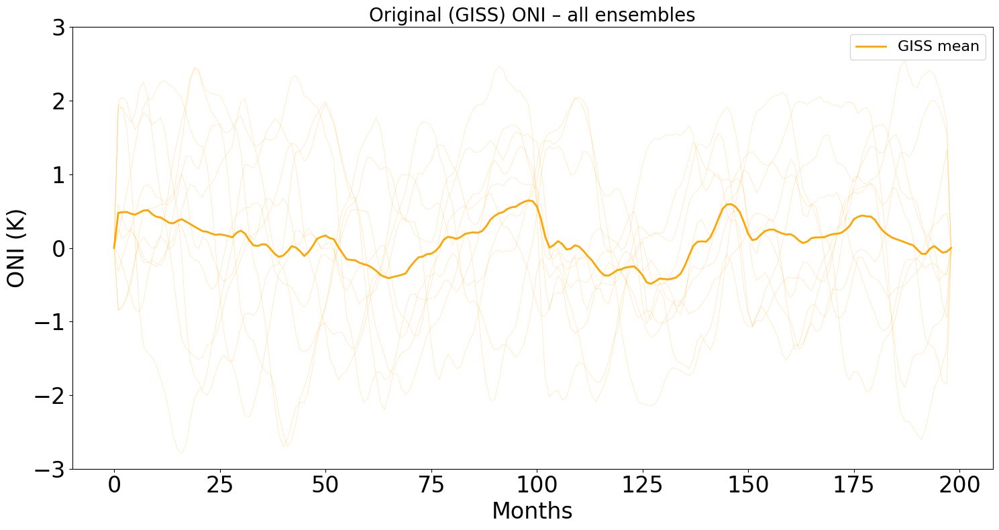

/tmp/ipykernel_4701/1566020566.py:67: RuntimeWarning: divide by zero encountered in divide
  period = 1.0 / f


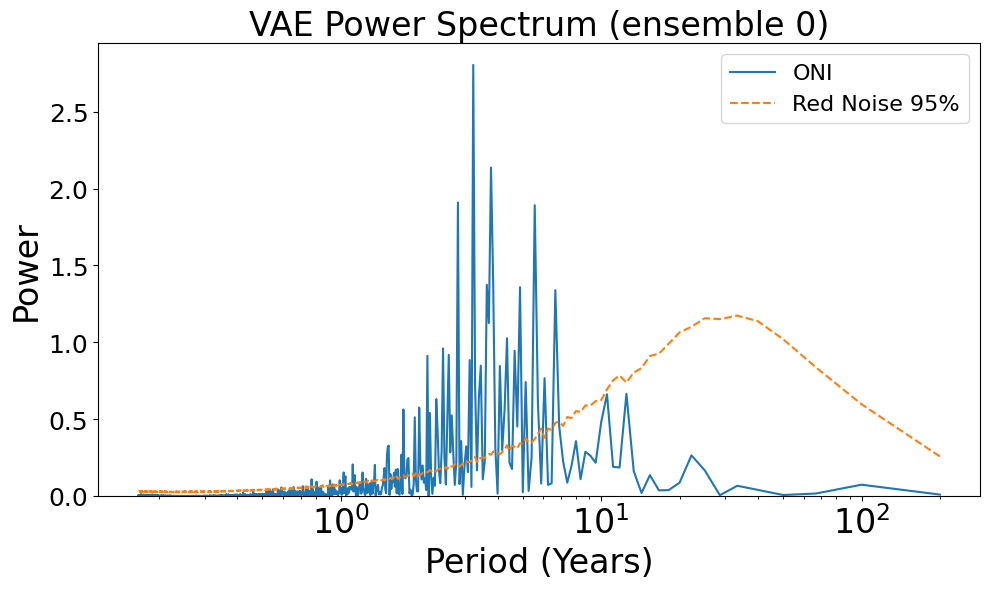

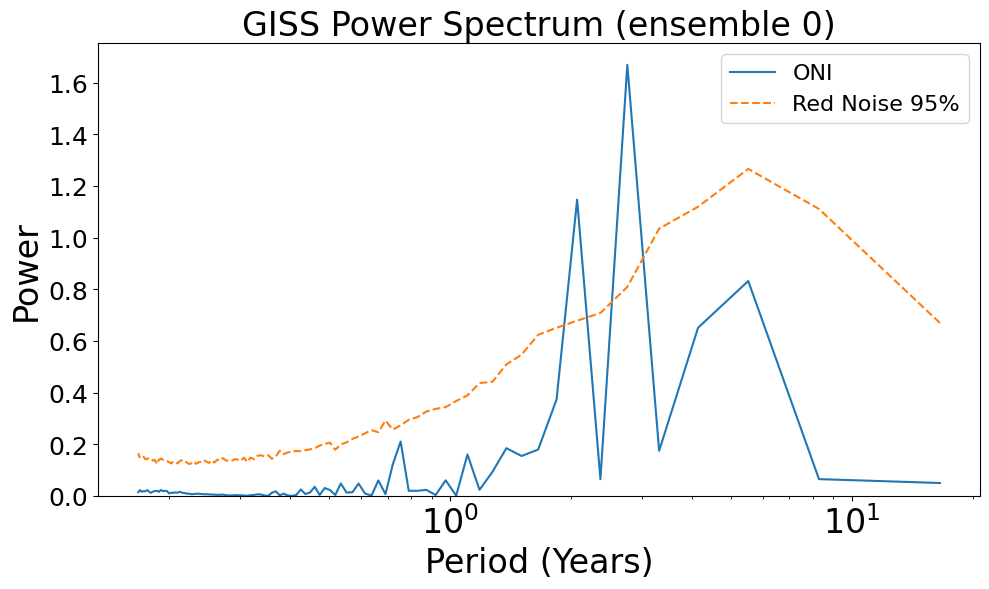

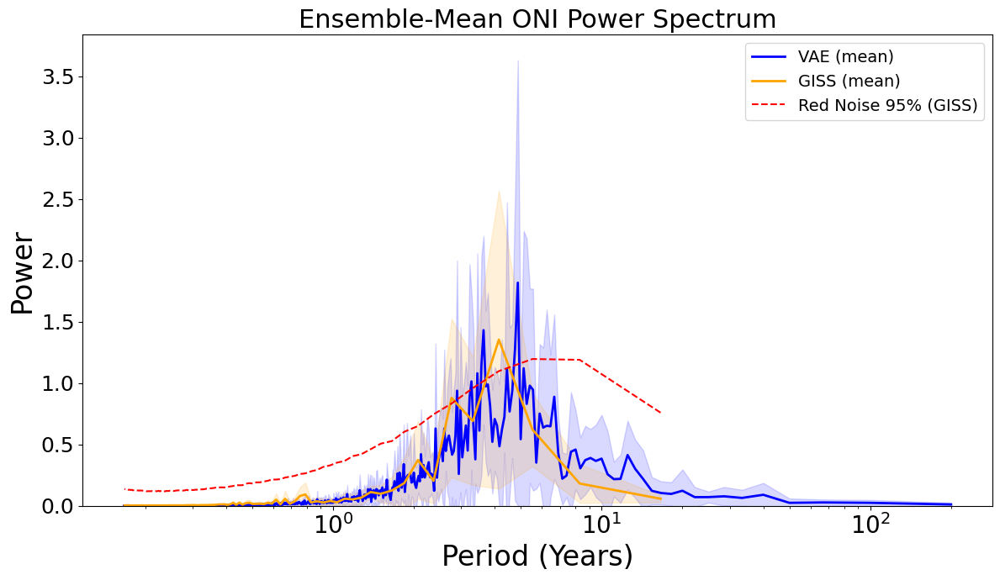

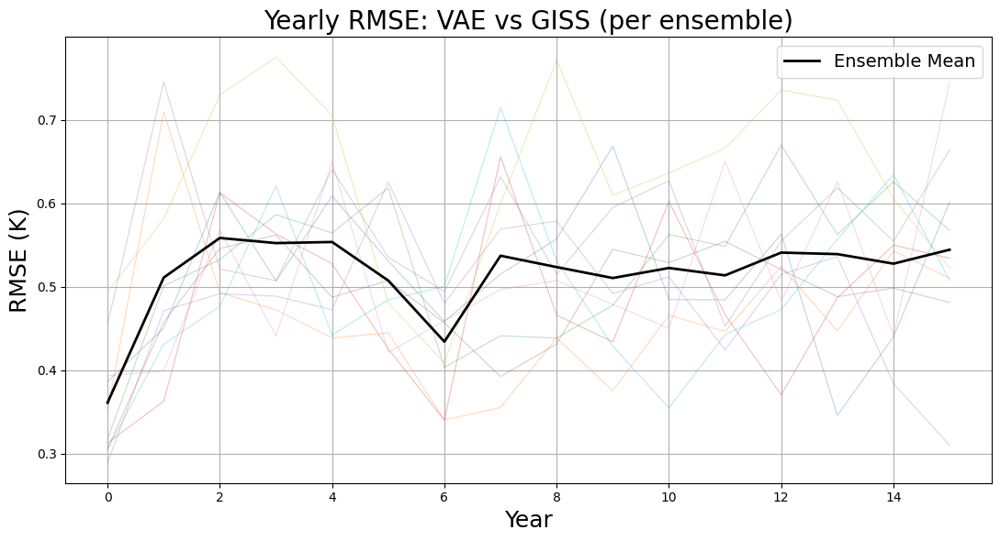

In [ ]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from scipy import signal


print("Lon range:", vae_anom_ds.lon.values.min(), "to", vae_anom_ds.lon.values.max())



def ensure_lon_0_360(ds):
    """Convert longitude from [-180,180] to [0,360] if needed."""
    if ds.lon.values.min() < 0:
        ds = ds.assign_coords(lon=(ds.lon % 360))
        ds = ds.sortby("lon")
    return ds

vae_anom_ds = ensure_lon_0_360(vae_anom_ds)
ori_anom_ds = ensure_lon_0_360(ori_anom_ds)


def cal_power_spect(data, nsim=1500):
    """
    Compute power spectrum of 1-D `data` with AR(1) red-noise
    95 % confidence bound (Monte-Carlo, `nsim` surrogates).

    Returns
    -------
    result : ndarray, shape (N_freq, 3)
        col 0 = period, col 1 = freq*power, col 2 = freq*95% red-noise
    """
    data = np.asarray(data).ravel()
    nd = len(data)


    sommesup = np.sum(data[1:] * data[:-1])
    sommeinf = np.sum(data[:-1] ** 2)
    rho = sommesup / sommeinf
    srho = np.sqrt(1.0 - rho ** 2)


    red_sum = np.zeros((nd, nsim))
    for i in range(nsim):
        red_sum[0, i] = rho * 0.0 + srho * np.random.randn()
        for j in range(1, nd):
            red_sum[j, i] = rho * red_sum[j - 1, i] + srho * np.random.randn()


    fs = 1
    f, Po = signal.periodogram(data, fs, detrend="linear")
    npo = len(Po)
    Ax = Po.mean()


    specred = np.zeros((npo, nsim))
    for i in range(nsim):
        red2 = red_sum[:, i] - red_sum[:, i].mean()
        _, Pr = signal.periodogram(red2, fs, detrend="linear")
        Pr = Pr * (Ax / Pr.mean())
        specred[:, i] = Pr


    specred_sorted = np.sort(specred, axis=1)
    n95 = int(round(nsim * 95 / 100))
    conf95 = specred_sorted[:, n95]

    period = 1.0 / f
    period[0] = np.inf

    result = np.column_stack([period, f * Po, f * conf95])
    return result



vae_3mo = vae_anom_ds.rolling(time=3, center=True).mean().fillna(0)
ori_3mo = ori_anom_ds.rolling(time=3, center=True).mean().fillna(0)


nino34_lat = slice(-5.0, 5.0)
nino34_lon = slice(170, 240)

ONI_vae = vae_3mo.sel(lat=nino34_lat, lon=nino34_lon)["sst"].mean(["lat", "lon"])
ONI_ori = ori_3mo.sel(lat=nino34_lat, lon=nino34_lon)["sst"].mean(["lat", "lon"])


print("ONI VAE shape:", ONI_vae.shape)
print("ONI ORI shape:", ONI_ori.shape)
print("ONI VAE std per ensemble:\n", ONI_vae.std("time").values)
print("ONI ORI std per ensemble:\n", ONI_ori.std("time").values)


n_ens_vae = ONI_vae.sizes["ensemble"]
n_ens_ori = ONI_ori.sizes["ensemble"]


ens_idx = 0
fig, ax = plt.subplots(figsize=(15, 8))
ax.plot(ONI_vae.sel(ensemble=ens_idx).values, linewidth=0.8)
ax.set_ylim(-3, 3)
ax.set_xlabel("Months", fontsize=24)
ax.set_ylabel("ONI (K)", fontsize=24)
ax.tick_params(labelsize=24)
ax.set_title(f"VAE ONI – ensemble {ens_idx}", fontsize=20)
plt.tight_layout()
plt.show()


fig, ax = plt.subplots(figsize=(15, 8))
for e in range(n_ens_vae):
    ax.plot(ONI_vae.sel(ensemble=e).values, alpha=0.15, color="blue", linewidth=0.5)
ax.plot(ONI_vae.mean("ensemble").values, color="blue", linewidth=2, label="VAE mean")
ax.set_ylim(-3, 3)
ax.set_xlabel("Months", fontsize=24)
ax.set_ylabel("ONI (K)", fontsize=24)
ax.tick_params(labelsize=24)
ax.legend(fontsize=16)
ax.set_title("VAE ONI – all ensembles", fontsize=20)
plt.tight_layout()
plt.show()


fig, ax = plt.subplots(figsize=(15, 8))
for e in range(n_ens_ori):
    ax.plot(ONI_ori.sel(ensemble=e).values, alpha=0.3, color="orange", linewidth=0.5)
ax.plot(ONI_ori.mean("ensemble").values, color="orange", linewidth=2, label="GISS mean")
ax.set_ylim(-3, 3)
ax.set_xlabel("Months", fontsize=24)
ax.set_ylabel("ONI (K)", fontsize=24)
ax.tick_params(labelsize=24)
ax.legend(fontsize=16)
ax.set_title("Original (GISS) ONI – all ensembles", fontsize=20)
plt.tight_layout()
plt.show()


def plot_power_spectrum(oni_series, title="Power Spectrum", save_path=None):
    """Plot power spectrum of a 1-D ONI series."""
    spec = cal_power_spect(oni_series)
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.plot(spec[:, 0] / 12, spec[:, 1], label="ONI", linewidth=1.5)
    ax.plot(spec[:, 0] / 12, spec[:, 2], label="Red Noise 95%", linewidth=1.5, linestyle="--")
    ax.set_xscale("log")
    ax.set_ylim(0, None)
    ax.set_xlabel("Period (Years)", fontsize=24)
    ax.set_ylabel("Power", fontsize=24)
    ax.tick_params(axis="x", labelsize=24)
    ax.tick_params(axis="y", labelsize=18)
    ax.legend(fontsize=16)
    ax.set_title(title, fontsize=24)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches="tight")
    plt.show()


plot_power_spectrum(
    ONI_vae.sel(ensemble=0).values,
    title="VAE Power Spectrum (ensemble 0)"
)

plot_power_spectrum(
    ONI_ori.sel(ensemble=0).values,
    title="GISS Power Spectrum (ensemble 0)"
)


def ensemble_avg_power_spectrum(oni_da, label, color, nsim=1500):
    """
    Compute power spectra for every ensemble member,
    then plot the mean ± 1 std envelope.
    """
    all_power = []
    all_conf = []
    for e in range(oni_da.sizes["ensemble"]):
        spec = cal_power_spect(oni_da.sel(ensemble=e).values, nsim=nsim)
        all_power.append(spec[:, 1])
        all_conf.append(spec[:, 2])
    periods = spec[:, 0] / 12

    all_power = np.array(all_power)
    all_conf = np.array(all_conf)
    mean_power = all_power.mean(axis=0)
    std_power = all_power.std(axis=0)
    mean_conf = all_conf.mean(axis=0)

    return periods, mean_power, std_power, mean_conf

fig, ax = plt.subplots(figsize=(12, 7))

for oni_da, label, color in [
    (ONI_vae, "VAE", "blue"),
    (ONI_ori, "GISS", "orange"),
]:
    periods, mean_p, std_p, mean_c = ensemble_avg_power_spectrum(oni_da, label, color)
    ax.plot(periods, mean_p, label=f"{label} (mean)", color=color, linewidth=2)
    ax.fill_between(periods, mean_p - std_p, mean_p + std_p, alpha=0.15, color=color)

ax.plot(periods, mean_c, label="Red Noise 95% (GISS)", color="red", linestyle="--", linewidth=1.5)
ax.set_xscale("log")
ax.set_ylim(0, None)
ax.set_xlabel("Period (Years)", fontsize=24)
ax.set_ylabel("Power", fontsize=24)
ax.tick_params(axis="x", labelsize=20)
ax.tick_params(axis="y", labelsize=18)
ax.legend(fontsize=14)
ax.set_title("Ensemble-Mean ONI Power Spectrum", fontsize=22)
plt.tight_layout()
plt.show()


n_time = min(vae_anom_ds.sizes["time"], ori_anom_ds.sizes["time"])
n_years = n_time // 12

vae_yearly = vae_anom_ds["sst"].values[:, :n_years*12].reshape(-1, n_years, 12, 48, 144).mean(axis=2)
ori_yearly = ori_anom_ds["sst"].values[:, :n_years*12].reshape(-1, n_years, 12, 48, 144).mean(axis=2)


rmse_per_year = np.sqrt(np.mean((vae_yearly - ori_yearly) ** 2, axis=(-2, -1)))

fig, ax = plt.subplots(figsize=(11, 6))
for e in range(rmse_per_year.shape[0]):
    ax.plot(np.arange(n_years), rmse_per_year[e], alpha=0.3, linewidth=0.8)
ax.plot(np.arange(n_years), rmse_per_year.mean(axis=0), color="black", linewidth=2, label="Ensemble Mean")
ax.set_xlabel("Year", fontsize=18)
ax.set_ylabel("RMSE (K)", fontsize=18)
ax.set_title("Yearly RMSE: VAE vs GISS (per ensemble)", fontsize=20)
ax.legend(fontsize=14)
ax.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
def compute_iod_index(ds):
    """
    Compute IOD index from xarray Dataset.

    Args:
        ds: xarray Dataset with variable 'sst' and dims (ensemble, time, lat, lon)

    Returns:
        iod: xarray DataArray (ensemble, time)
    """

    # Western box
    west = ds.sel(lat=slice(-10, 10), lon=slice(50, 70))['sst'].mean(['lat', 'lon'])

    # Eastern box
    east = ds.sel(lat=slice(-10, 0), lon=slice(90, 110))['sst'].mean(['lat', 'lon'])

    # IOD index
    iod = west - east

    return iod

In [ ]:
IODM_vae = compute_iod_index(vae_anom_ds_3mo_avg)
IODM_ori = compute_iod_index(ori_anom_ds_3mo_avg)

In [ ]:
IODM_vae_mean = IODM_vae.mean(dim='ensemble')
IODM_ori_mean = IODM_ori.mean(dim='ensemble')

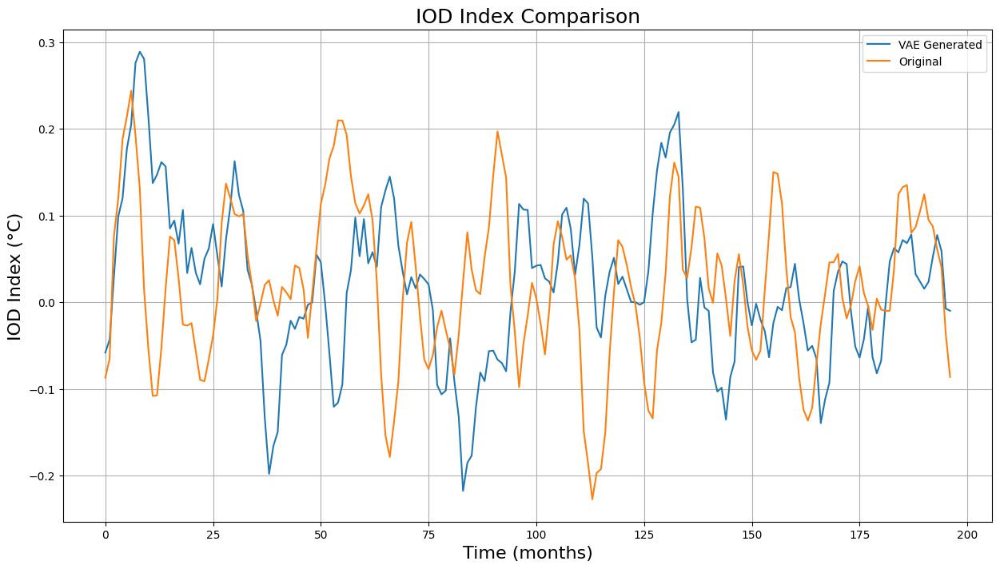

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 8))

plt.plot(IODM_vae_mean.values, label='VAE Generated')
plt.plot(IODM_ori_mean.values, label='Original')

plt.xlabel('Time (months)', fontsize=16)
plt.ylabel('IOD Index (°C)', fontsize=16)
plt.legend()
plt.grid(True)

plt.title('IOD Index Comparison', fontsize=18)

plt.show()

In [ ]:
iod_vae_np = IODM_vae_mean.values.flatten()
iod_ori_np = IODM_ori_mean.values.flatten()

In [ ]:
plot_vae = cal_power_spect(iod_vae_np)
plot_ori = cal_power_spect(iod_ori_np)

/tmp/ipykernel_4701/422458785.py:67: RuntimeWarning: divide by zero encountered in divide
  period = 1.0 / f


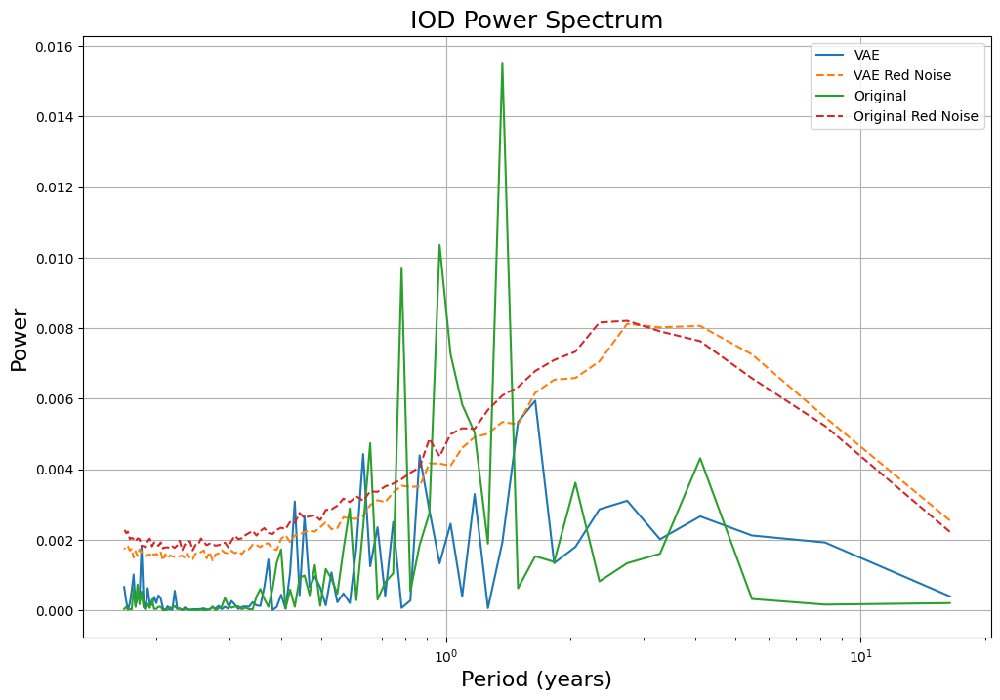

In [ ]:
plt.figure(figsize=(12, 8))


plt.plot(plot_vae[:, 0] / 12, plot_vae[:, 1], label='VAE')
plt.plot(plot_vae[:, 0] / 12, plot_vae[:, 2], '--', label='VAE Red Noise')


plt.plot(plot_ori[:, 0] / 12, plot_ori[:, 1], label='Original')
plt.plot(plot_ori[:, 0] / 12, plot_ori[:, 2], '--', label='Original Red Noise')

plt.xscale('log')

plt.xlabel('Period (years)', fontsize=16)
plt.ylabel('Power', fontsize=16)

plt.legend()
plt.grid(True)

plt.title('IOD Power Spectrum', fontsize=18)

plt.show()

VAE IOD shape: (10, 199)
Original IOD shape: (10, 199)


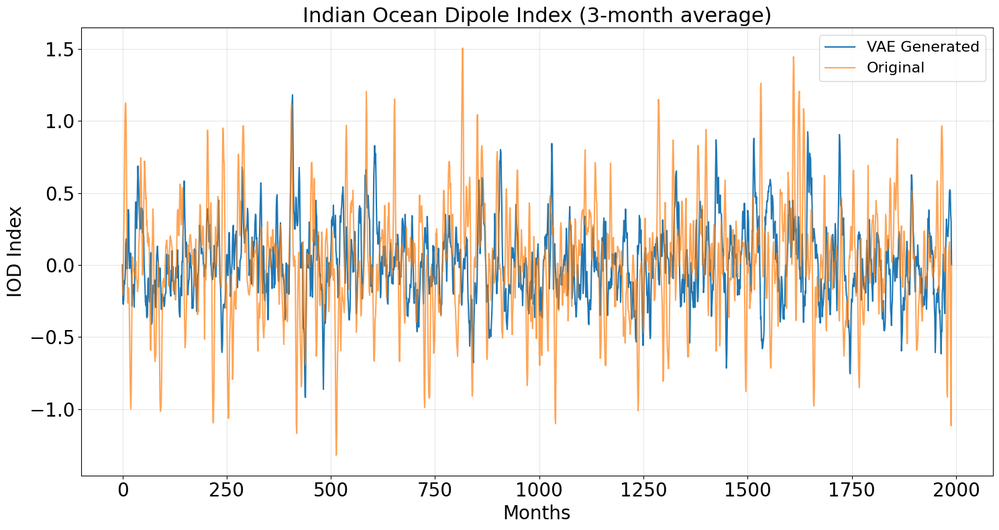

/tmp/ipykernel_4701/422458785.py:67: RuntimeWarning: divide by zero encountered in divide
  period = 1.0 / f


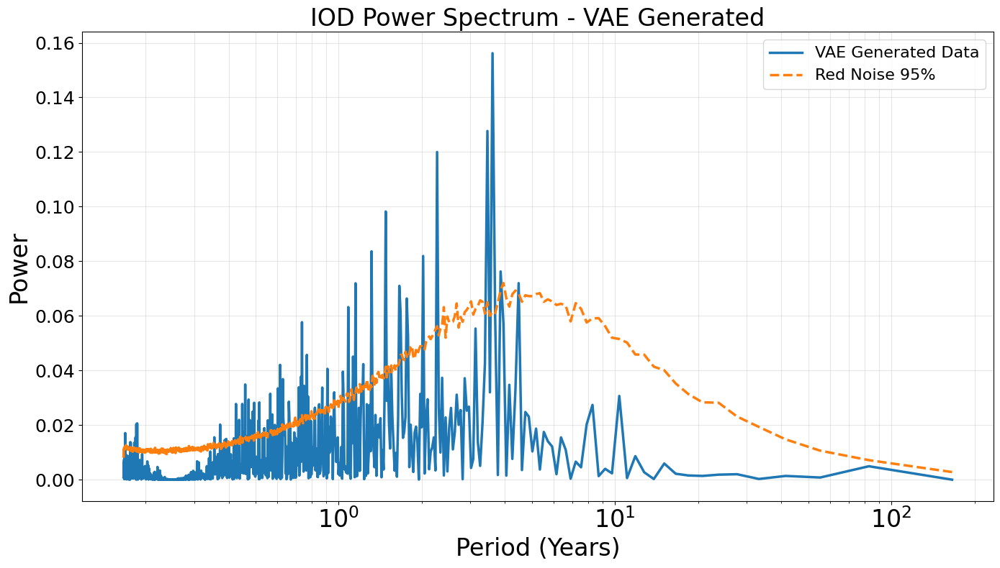

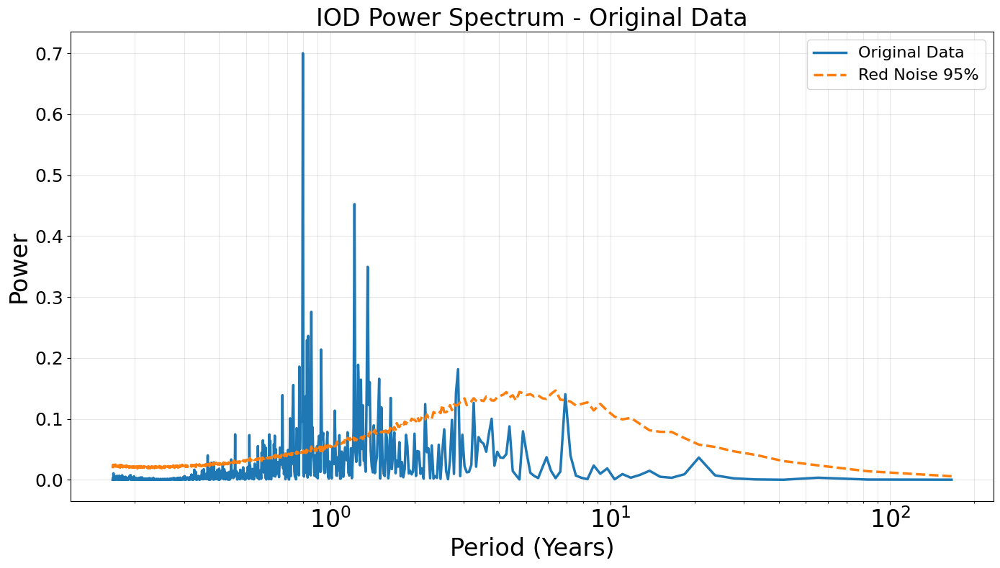

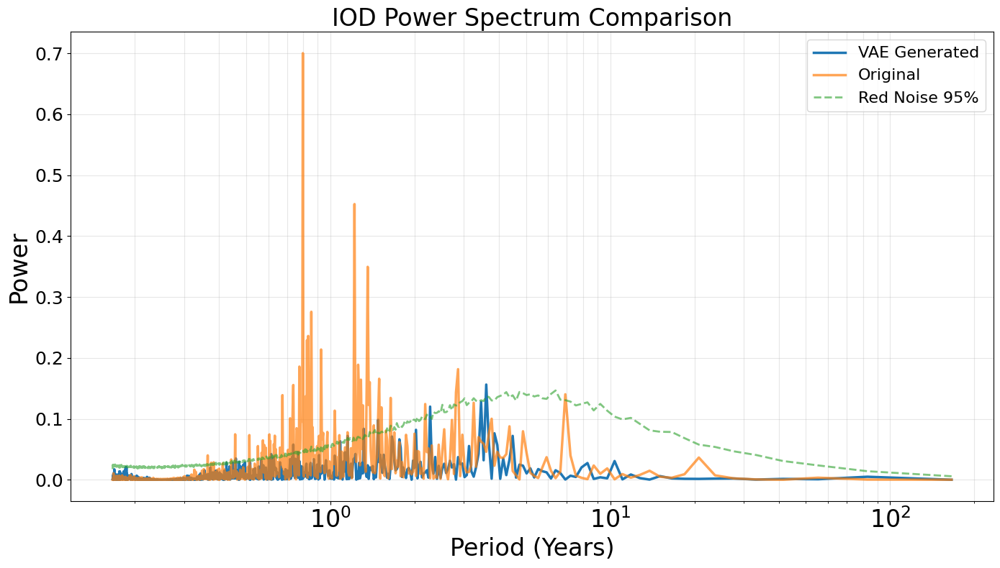


IOD Index Statistics (3-month average)

VAE Generated:
  Mean: 0.0188
  Std:  0.2650
  Min:  -0.9193
  Max:  1.1814

Original Data:
  Mean: 0.0198
  Std:  0.3781
  Min:  -1.3202
  Max:  1.5054


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd



IODM_vae = (
    vae_anom_ds.sel(lat=slice(-10.0, 10.0), lon=slice(50, 70))['sst'].mean(['lat', 'lon']) -
    vae_anom_ds.sel(lat=slice(-10.0, 0.0), lon=slice(90, 110))['sst'].mean(['lat', 'lon'])
)

IODM_ori = (
    ori_anom_ds.sel(lat=slice(-10.0, 10.0), lon=slice(50, 70))['sst'].mean(['lat', 'lon']) -
    ori_anom_ds.sel(lat=slice(-10.0, 0.0), lon=slice(90, 110))['sst'].mean(['lat', 'lon'])
)


IODM_vae_3mo_avg = IODM_vae.rolling(time=3, center=True).mean().fillna(0)
IODM_ori_3mo_avg = IODM_ori.rolling(time=3, center=True).mean().fillna(0)

print(f"VAE IOD shape: {IODM_vae_3mo_avg.shape}")
print(f"Original IOD shape: {IODM_ori_3mo_avg.shape}")


f = plt.figure()
f.set_figwidth(15)
f.set_figheight(8)

plt.plot(IODM_vae_3mo_avg.values.flatten(), linewidth=1.5, label='VAE Generated')
plt.plot(IODM_ori_3mo_avg.values.flatten(), linewidth=1.5, label='Original', alpha=0.7)

plt.xlabel('Months', fontsize=20)
plt.ylabel('IOD Index', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(fontsize=16)
plt.title('Indian Ocean Dipole Index (3-month average)', fontsize=22)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('./IODM_3mo_vae_vs_ori.png', dpi=300, bbox_inches='tight')
plt.show()


plot_vae = cal_power_spect(IODM_vae_3mo_avg.values.flatten())

f = plt.figure()
f.set_figwidth(14)
f.set_figheight(8)

plt.plot(plot_vae[:, 0] / 12, plot_vae[:, 1], linewidth=2.5, label='VAE Generated Data')
plt.plot(plot_vae[:, 0] / 12, plot_vae[:, 2], linewidth=2.5, label='Red Noise 95%', linestyle='--')

plt.xscale('log')
plt.xticks(fontsize=24)
plt.yticks(fontsize=18)
plt.xlabel('Period (Years)', fontsize=24)
plt.ylabel('Power', fontsize=24)
plt.legend(fontsize=16)
plt.title('IOD Power Spectrum - VAE Generated', fontsize=24)
plt.grid(True, which='both', alpha=0.3)
plt.tight_layout()
plt.savefig('./IODM_3mo_pow_spec_vae.png', dpi=300, bbox_inches='tight')
plt.show()


plot_ori = cal_power_spect(IODM_ori_3mo_avg.values.flatten())

f = plt.figure()
f.set_figwidth(14)
f.set_figheight(8)

plt.plot(plot_ori[:, 0] / 12, plot_ori[:, 1], linewidth=2.5, label='Original Data')
plt.plot(plot_ori[:, 0] / 12, plot_ori[:, 2], linewidth=2.5, label='Red Noise 95%', linestyle='--')

plt.xscale('log')
plt.xticks(fontsize=24)
plt.yticks(fontsize=18)
plt.xlabel('Period (Years)', fontsize=24)
plt.ylabel('Power', fontsize=24)
plt.legend(fontsize=16)
plt.title('IOD Power Spectrum - Original Data', fontsize=24)
plt.grid(True, which='both', alpha=0.3)
plt.tight_layout()
plt.savefig('./IODM_3mo_pow_spec_ori.png', dpi=300, bbox_inches='tight')
plt.show()


f = plt.figure()
f.set_figwidth(14)
f.set_figheight(8)

plt.plot(plot_vae[:, 0] / 12, plot_vae[:, 1], linewidth=2.5, label='VAE Generated')
plt.plot(plot_ori[:, 0] / 12, plot_ori[:, 1], linewidth=2.5, label='Original', alpha=0.7)
plt.plot(plot_ori[:, 0] / 12, plot_ori[:, 2], linewidth=2, label='Red Noise 95%', linestyle='--', alpha=0.6)

plt.xscale('log')
plt.xticks(fontsize=24)
plt.yticks(fontsize=18)
plt.xlabel('Period (Years)', fontsize=24)
plt.ylabel('Power', fontsize=24)
plt.legend(fontsize=16)
plt.title('IOD Power Spectrum Comparison', fontsize=24)
plt.grid(True, which='both', alpha=0.3)
plt.tight_layout()
plt.savefig('./IODM_3mo_pow_spec_comparison.png', dpi=300, bbox_inches='tight')
plt.show()


print("\n" + "="*60)
print("IOD Index Statistics (3-month average)")
print("="*60)

print("\nVAE Generated:")
print(f"  Mean: {IODM_vae_3mo_avg.mean().values:.4f}")
print(f"  Std:  {IODM_vae_3mo_avg.std().values:.4f}")
print(f"  Min:  {IODM_vae_3mo_avg.min().values:.4f}")
print(f"  Max:  {IODM_vae_3mo_avg.max().values:.4f}")

print("\nOriginal Data:")
print(f"  Mean: {IODM_ori_3mo_avg.mean().values:.4f}")
print(f"  Std:  {IODM_ori_3mo_avg.std().values:.4f}")
print(f"  Min:  {IODM_ori_3mo_avg.min().values:.4f}")
print(f"  Max:  {IODM_ori_3mo_avg.max().values:.4f}")

In [ ]:
import xarray as xr

lat_vals = lat_sst
lon_vals = lon_sst

time_coord = np.arange(generated_test.shape[1])

vae_anom_ds = xr.Dataset(
    {
        "sst": (["ensemble", "time", "lat", "lon"], generated_test)
    },
    coords={
        "ensemble": np.arange(generated_test.shape[0]),
        "time": time_coord,
        "lat": lat_vals,
        "lon": lon_vals,
    }
)


ori_test = np.stack(
    [test_Y[i].squeeze(1).numpy() for i in range(len(test_Y))],
    axis=0
)

ori_anom_ds = xr.Dataset(
    {
        "sst": (["ensemble", "time", "lat", "lon"], ori_test)
    },
    coords={
        "ensemble": np.arange(ori_test.shape[0]),
        "time": time_coord,
        "lat": lat_vals,
        "lon": lon_vals,
    }
)

In [ ]:

IODM_gen = (
    vae_anom_ds.sel(lat=slice(-10.0, 10.0), lon=slice(50, 70))['sst'].mean(['lat', 'lon'])
    - vae_anom_ds.sel(lat=slice(-10.0, 0.0), lon=slice(90, 110))['sst'].mean(['lat', 'lon'])
)


IODM_ori = (
    ori_anom_ds.sel(lat=slice(-10.0, 10.0), lon=slice(50, 70))['sst'].mean(['lat', 'lon'])
    - ori_anom_ds.sel(lat=slice(-10.0, 0.0), lon=slice(90, 110))['sst'].mean(['lat', 'lon'])
)


IODM_gen_3mo_avg = IODM_gen.rolling(time=3, center=True).mean().fillna(0)
IODM_ori_3mo_avg = IODM_ori.rolling(time=3, center=True).mean().fillna(0)

print(f"IODM_gen shape: {IODM_gen.shape}")
print(f"IODM_ori shape: {IODM_ori.shape}")
print(f"IODM_gen_3mo_avg shape: {IODM_gen_3mo_avg.shape}")

IODM_gen shape: (10, 199)
IODM_ori shape: (10, 199)
IODM_gen_3mo_avg shape: (10, 199)


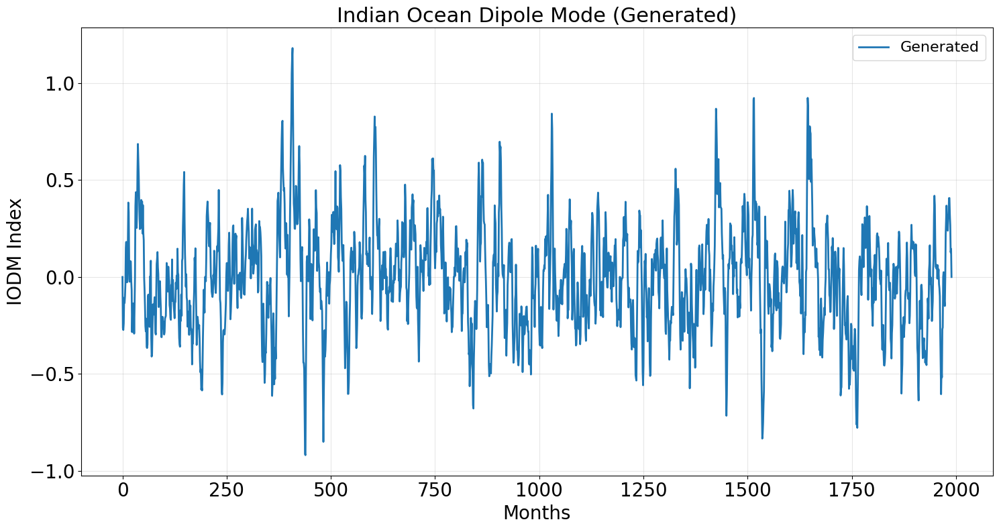

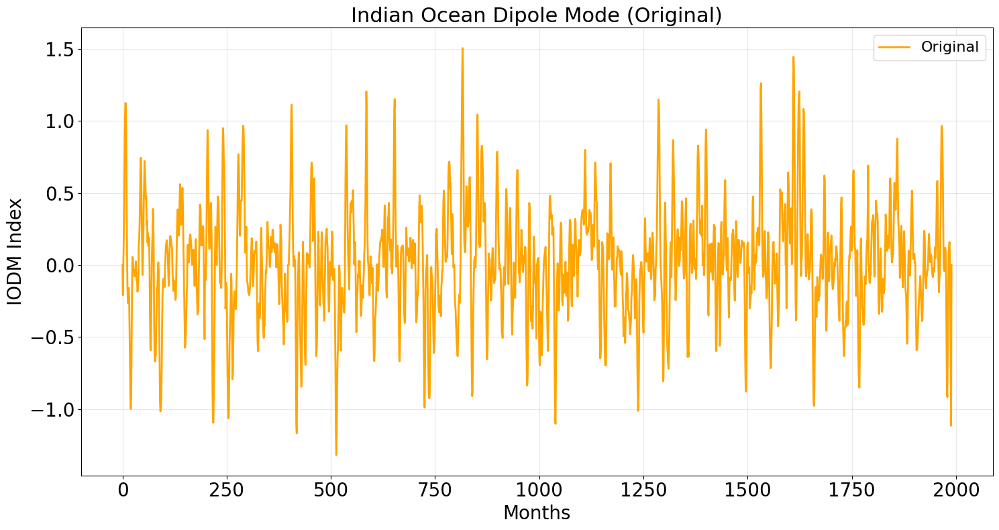

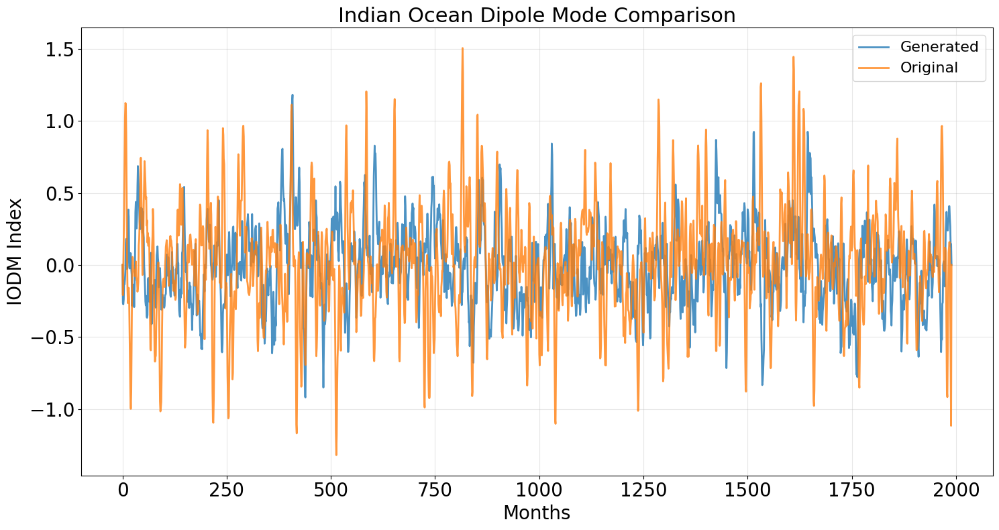

In [ ]:
import matplotlib.pyplot as plt
import os


os.makedirs('./output', exist_ok=True)


fig = plt.figure(figsize=(15, 8))
plt.plot(IODM_gen_3mo_avg.values.reshape(-1), linewidth=2, label='Generated')
plt.xlabel('Months', fontsize=20)
plt.ylabel('IODM Index', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.grid(True, alpha=0.3)
plt.legend(fontsize=16)
plt.title('Indian Ocean Dipole Mode (Generated)', fontsize=22)
plt.tight_layout()
plt.savefig('./output/IODM_3mo_generated.png', dpi=300, bbox_inches='tight')
plt.show()


fig = plt.figure(figsize=(15, 8))
plt.plot(IODM_ori_3mo_avg.values.reshape(-1), linewidth=2, label='Original', color='orange')
plt.xlabel('Months', fontsize=20)
plt.ylabel('IODM Index', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.grid(True, alpha=0.3)
plt.legend(fontsize=16)
plt.title('Indian Ocean Dipole Mode (Original)', fontsize=22)
plt.tight_layout()
plt.savefig('./output/IODM_3mo_original.png', dpi=300, bbox_inches='tight')
plt.show()


fig = plt.figure(figsize=(15, 8))
plt.plot(IODM_gen_3mo_avg.values.reshape(-1), linewidth=2, label='Generated', alpha=0.8)
plt.plot(IODM_ori_3mo_avg.values.reshape(-1), linewidth=2, label='Original', alpha=0.8)
plt.xlabel('Months', fontsize=20)
plt.ylabel('IODM Index', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.grid(True, alpha=0.3)
plt.legend(fontsize=16)
plt.title('Indian Ocean Dipole Mode Comparison', fontsize=22)
plt.tight_layout()
plt.savefig('./output/IODM_3mo_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

/tmp/ipykernel_2794/4139932518.py:46: RuntimeWarning: divide by zero encountered in divide
  period_Po = 1.0 / f


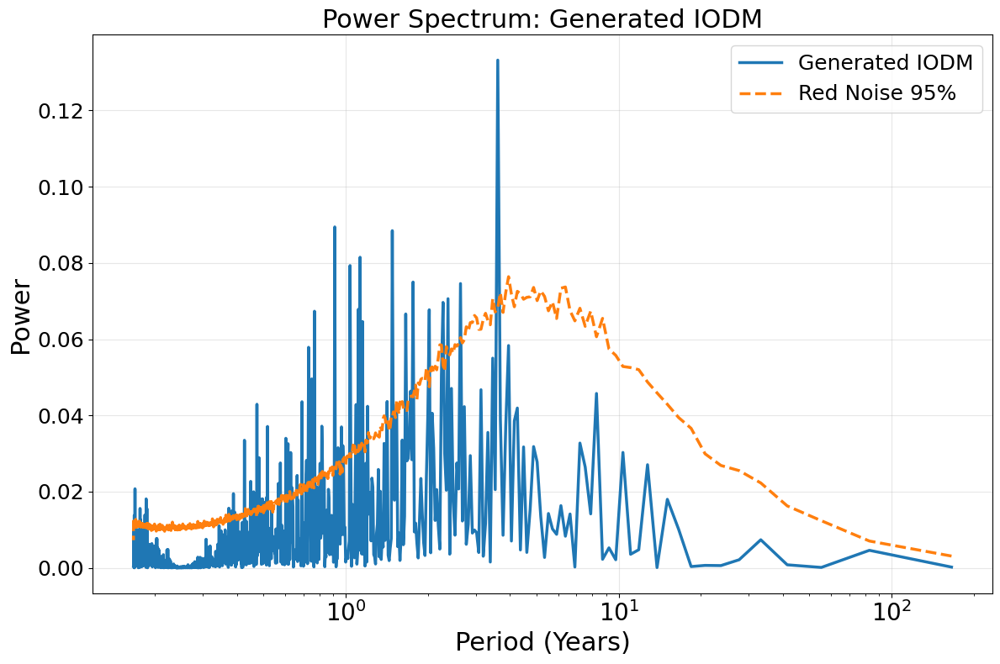

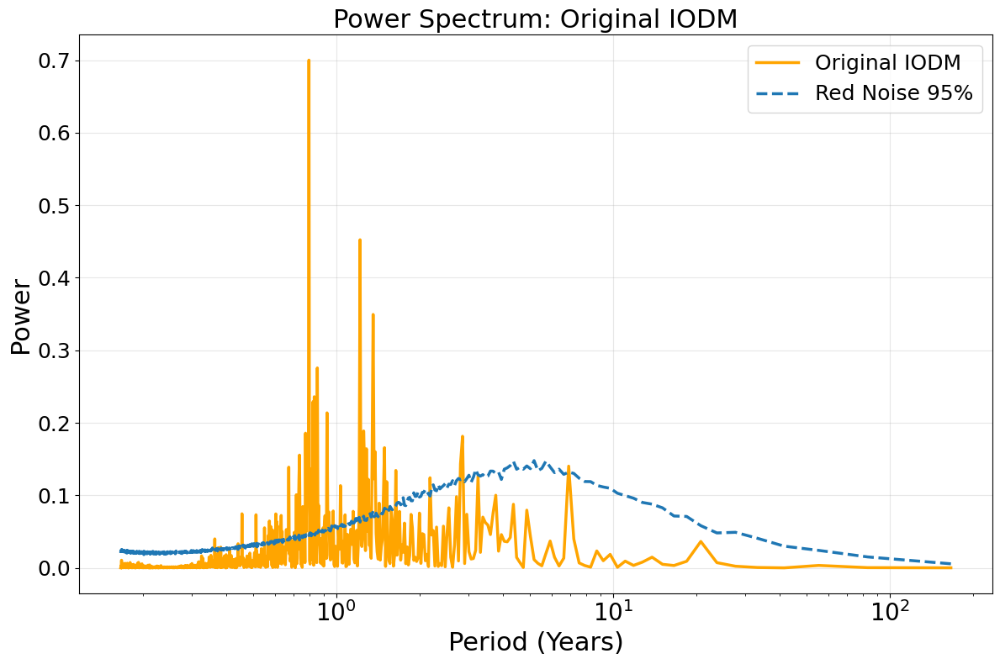

In [ ]:
plot_gen = cal_power_spect(IODM_gen_3mo_avg.values.reshape(-1))

fig = plt.figure(figsize=(12, 8))
plt.plot(plot_gen[:, 0] / 12, plot_gen[:, 1], linewidth=2.5, label='Generated IODM')
plt.plot(plot_gen[:, 0] / 12, plot_gen[:, 2], linewidth=2.5, label='Red Noise 95%', linestyle='--')
plt.xscale('log')
plt.xticks(fontsize=20)
plt.yticks(fontsize=18)
plt.xlabel('Period (Years)', fontsize=22)
plt.ylabel('Power', fontsize=22)
plt.legend(fontsize=18)
plt.title('Power Spectrum: Generated IODM', fontsize=22)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('./output/IODM_power_spectrum_generated.png', dpi=300, bbox_inches='tight')
plt.show()


plot_ori = cal_power_spect(IODM_ori_3mo_avg.values.reshape(-1))

fig = plt.figure(figsize=(12, 8))
plt.plot(plot_ori[:, 0] / 12, plot_ori[:, 1], linewidth=2.5, label='Original IODM', color='orange')
plt.plot(plot_ori[:, 0] / 12, plot_ori[:, 2], linewidth=2.5, label='Red Noise 95%', linestyle='--')
plt.xscale('log')
plt.xticks(fontsize=20)
plt.yticks(fontsize=18)
plt.xlabel('Period (Years)', fontsize=22)
plt.ylabel('Power', fontsize=22)
plt.legend(fontsize=18)
plt.title('Power Spectrum: Original IODM', fontsize=22)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('./output/IODM_power_spectrum_original.png', dpi=300, bbox_inches='tight')
plt.show()

IODM_gen shape: (10, 199)
IODM_ori shape: (10, 199)
IODM_gen_3mo_avg shape: (10, 199)
IODM_ori_3mo_avg shape: (10, 199)


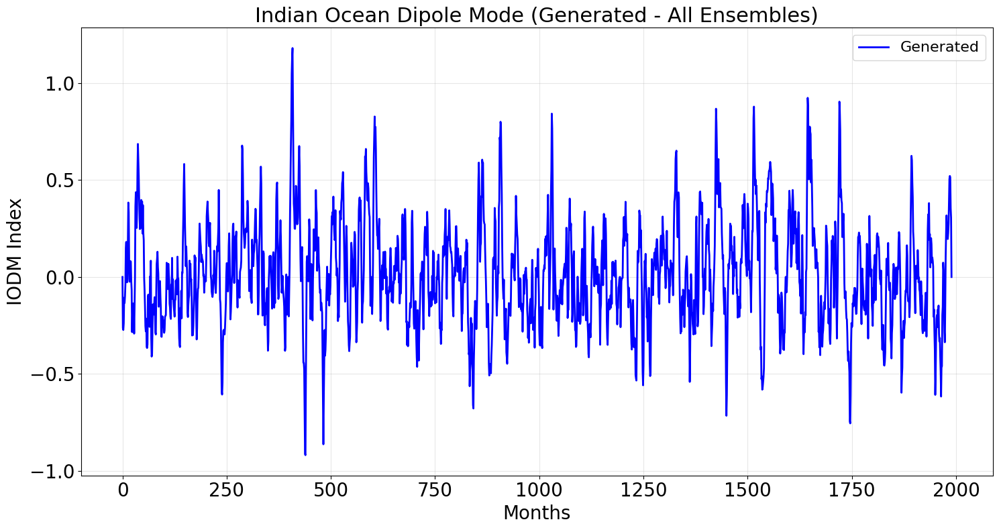

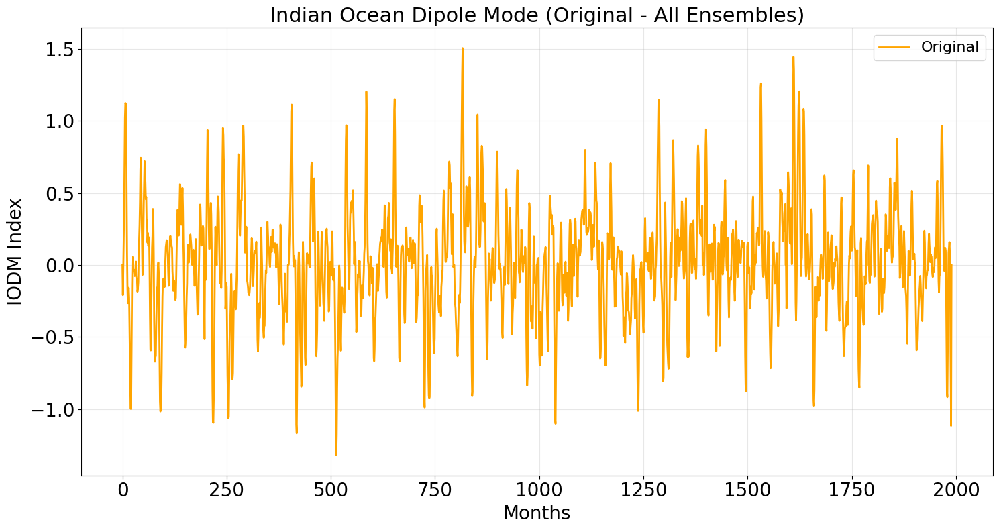

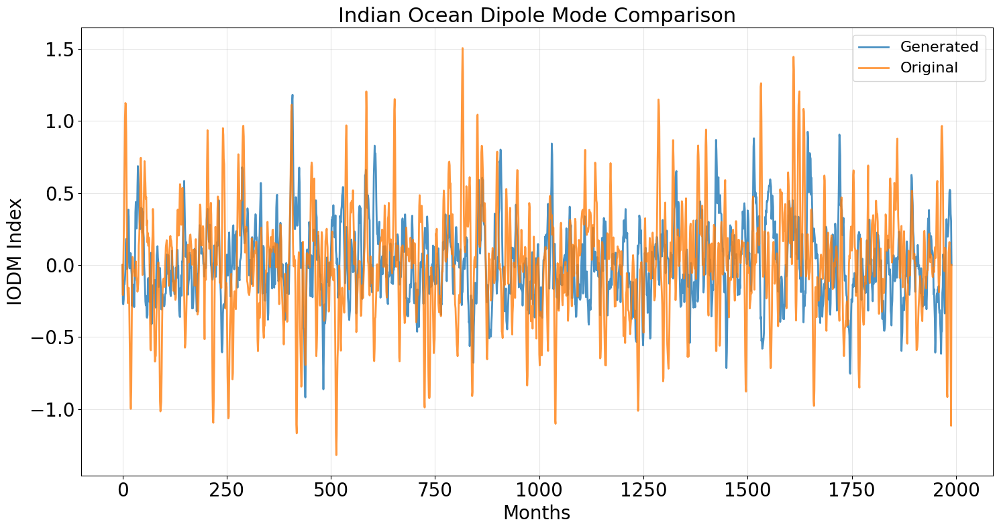


CALCULATING IODM FOR INDIVIDUAL ENSEMBLES

Total number of ensembles: 10

Processing Ensemble 0...
Processing Ensemble 1...
Processing Ensemble 2...
Processing Ensemble 3...
Processing Ensemble 4...
Processing Ensemble 5...
Processing Ensemble 6...
Processing Ensemble 7...
Processing Ensemble 8...
Processing Ensemble 9...

Successfully calculated IODM for 10 ensembles


/tmp/ipykernel_4701/3425716955.py:83: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  num_ensembles = vae_anom_ds.dims['ensemble']


In [ ]:
import matplotlib.pyplot as plt
import numpy as np


import os
os.makedirs('./output/IODM', exist_ok=True)


IODM_gen = (
    vae_anom_ds.sel(lat=slice(-10.0, 10.0), lon=slice(50, 70))['sst'].mean(['lat', 'lon'])
    - vae_anom_ds.sel(lat=slice(-10.0, 0.0), lon=slice(90, 110))['sst'].mean(['lat', 'lon'])
)


IODM_ori = (
    ori_anom_ds.sel(lat=slice(-10.0, 10.0), lon=slice(50, 70))['sst'].mean(['lat', 'lon'])
    - ori_anom_ds.sel(lat=slice(-10.0, 0.0), lon=slice(90, 110))['sst'].mean(['lat', 'lon'])
)


IODM_gen_3mo_avg = IODM_gen.rolling(time=3, center=True).mean().fillna(0)
IODM_ori_3mo_avg = IODM_ori.rolling(time=3, center=True).mean().fillna(0)

print(f"IODM_gen shape: {IODM_gen.shape}")
print(f"IODM_ori shape: {IODM_ori.shape}")
print(f"IODM_gen_3mo_avg shape: {IODM_gen_3mo_avg.shape}")
print(f"IODM_ori_3mo_avg shape: {IODM_ori_3mo_avg.shape}")



fig = plt.figure(figsize=(15, 8))
plt.plot(IODM_gen_3mo_avg.values.reshape(-1), linewidth=2, label='Generated', color='blue')
plt.xlabel('Months', fontsize=20)
plt.ylabel('IODM Index', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.grid(True, alpha=0.3)
plt.legend(fontsize=16)
plt.title('Indian Ocean Dipole Mode (Generated - All Ensembles)', fontsize=22)
plt.tight_layout()
plt.savefig('./output/IODM/IODM_3mo_gen_all_ensembles.png', dpi=300, bbox_inches='tight')
plt.show()



fig = plt.figure(figsize=(15, 8))
plt.plot(IODM_ori_3mo_avg.values.reshape(-1), linewidth=2, label='Original', color='orange')
plt.xlabel('Months', fontsize=20)
plt.ylabel('IODM Index', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.grid(True, alpha=0.3)
plt.legend(fontsize=16)
plt.title('Indian Ocean Dipole Mode (Original - All Ensembles)', fontsize=22)
plt.tight_layout()
plt.savefig('./output/IODM/IODM_3mo_ori_all_ensembles.png', dpi=300, bbox_inches='tight')
plt.show()


fig = plt.figure(figsize=(15, 8))
plt.plot(IODM_gen_3mo_avg.values.reshape(-1), linewidth=2, label='Generated', alpha=0.8)
plt.plot(IODM_ori_3mo_avg.values.reshape(-1), linewidth=2, label='Original', alpha=0.8)
plt.xlabel('Months', fontsize=20)
plt.ylabel('IODM Index', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.grid(True, alpha=0.3)
plt.legend(fontsize=16)
plt.title('Indian Ocean Dipole Mode Comparison', fontsize=22)
plt.tight_layout()
plt.savefig('./output/IODM/IODM_3mo_comparison_all_ensembles.png', dpi=300, bbox_inches='tight')
plt.show()


print("\n" + "="*70)
print("CALCULATING IODM FOR INDIVIDUAL ENSEMBLES")
print("="*70 + "\n")

num_ensembles = vae_anom_ds.dims['ensemble']
print(f"Total number of ensembles: {num_ensembles}\n")


IODM_gen_by_ensemble = {}
IODM_ori_by_ensemble = {}
IODM_gen_3mo_by_ensemble = {}
IODM_ori_3mo_by_ensemble = {}

for ens in range(num_ensembles):
    print(f"Processing Ensemble {ens}...")


    gen_ens = vae_anom_ds.isel(ensemble=ens)
    ori_ens = ori_anom_ds.isel(ensemble=ens)


    IODM_gen_ens = (
        gen_ens.sel(lat=slice(-10.0, 10.0), lon=slice(50, 70))['sst'].mean(['lat', 'lon'])
        - gen_ens.sel(lat=slice(-10.0, 0.0), lon=slice(90, 110))['sst'].mean(['lat', 'lon'])
    )

    IODM_ori_ens = (
        ori_ens.sel(lat=slice(-10.0, 10.0), lon=slice(50, 70))['sst'].mean(['lat', 'lon'])
        - ori_ens.sel(lat=slice(-10.0, 0.0), lon=slice(90, 110))['sst'].mean(['lat', 'lon'])
    )


    IODM_gen_3mo_ens = IODM_gen_ens.rolling(time=3, center=True).mean().fillna(0)
    IODM_ori_3mo_ens = IODM_ori_ens.rolling(time=3, center=True).mean().fillna(0)


    IODM_gen_by_ensemble[ens] = IODM_gen_ens
    IODM_ori_by_ensemble[ens] = IODM_ori_ens
    IODM_gen_3mo_by_ensemble[ens] = IODM_gen_3mo_ens
    IODM_ori_3mo_by_ensemble[ens] = IODM_ori_3mo_ens

print(f"\nSuccessfully calculated IODM for {len(IODM_gen_by_ensemble)} ensembles")


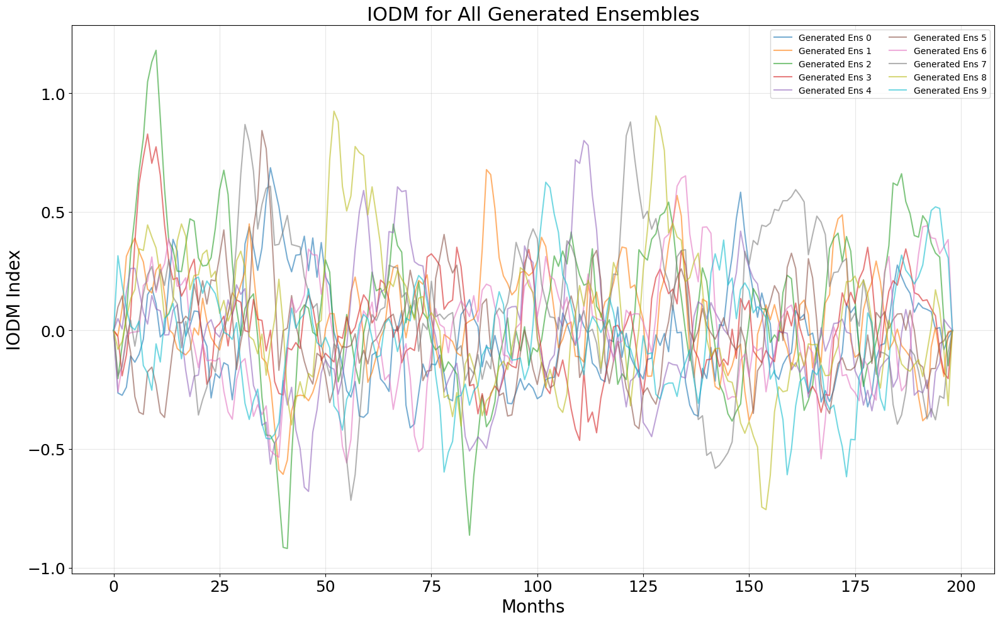

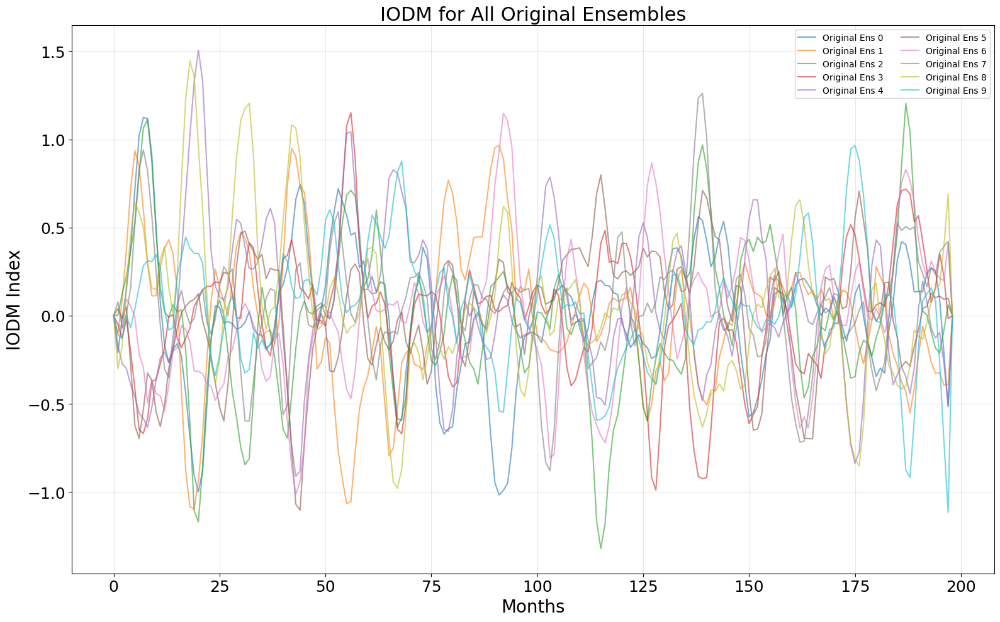

In [ ]:
fig = plt.figure(figsize=(16, 10))

for ens in range(num_ensembles):
    plt.plot(IODM_gen_3mo_by_ensemble[ens].values.reshape(-1),
             linewidth=1.5, alpha=0.6, label=f'Generated Ens {ens}')

plt.xlabel('Months', fontsize=20)
plt.ylabel('IODM Index', fontsize=20)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.grid(True, alpha=0.3)
plt.legend(fontsize=10, ncol=2)
plt.title('IODM for All Generated Ensembles', fontsize=22)
plt.tight_layout()
plt.savefig('./output/IODM/IODM_3mo_all_generated_ensembles.png', dpi=300, bbox_inches='tight')
plt.show()


fig = plt.figure(figsize=(16, 10))
for ens in range(num_ensembles):
    plt.plot(IODM_ori_3mo_by_ensemble[ens].values.reshape(-1),
             linewidth=1.5, alpha=0.6, label=f'Original Ens {ens}')

plt.xlabel('Months', fontsize=20)
plt.ylabel('IODM Index', fontsize=20)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.grid(True, alpha=0.3)
plt.legend(fontsize=10, ncol=2)
plt.title('IODM for All Original Ensembles', fontsize=22)
plt.tight_layout()
plt.savefig('./output/IODM/IODM_3mo_all_original_ensembles.png', dpi=300, bbox_inches='tight')
plt.show()

**IOD Plots**

In [ ]:
def compute_oni_index(ds):
    """
    Compute ONI index from xarray Dataset.

    Args:
        ds: xarray Dataset with dims (ensemble, time, lat, lon)

    Returns:
        oni: DataArray (ensemble, time)
    """
    oni = ds.sel(
        lat=slice(-5, 5),
        lon=slice(170, 240)
    )['sst'].mean(['lat', 'lon'])

    return oni

In [ ]:
import xarray as xr

lat_vals = lat_sst
lon_vals = lon_sst

time_coord = np.arange(generated_test.shape[1])

vae_anom_ds = xr.Dataset(
    {
        "sst": (["ensemble", "time", "lat", "lon"], generated_test)
    },
    coords={
        "ensemble": np.arange(generated_test.shape[0]),
        "time": time_coord,
        "lat": lat_vals,
        "lon": lon_vals,
    }
)


ori_test = np.stack(
    [test_Y[i].squeeze(1).numpy() for i in range(len(test_Y))],
    axis=0
)

ori_anom_ds = xr.Dataset(
    {
        "sst": (["ensemble", "time", "lat", "lon"], ori_test)
    },
    coords={
        "ensemble": np.arange(ori_test.shape[0]),
        "time": time_coord,
        "lat": lat_vals,
        "lon": lon_vals,
    }
)

In [ ]:
IOD_WIO_gen = vae_anom_ds.sel(lat=slice(-20, 10), lon=slice(50, 70))['sst'].mean(['lat', 'lon'])
IOD_EIO_gen = vae_anom_ds.sel(lat=slice(-10, 0), lon=slice(90, 110))['sst'].mean(['lat', 'lon'])

IOD_WIO_ori = ori_anom_ds.sel(lat=slice(-20, 10), lon=slice(50, 70))['sst'].mean(['lat', 'lon'])
IOD_EIO_ori = ori_anom_ds.sel(lat=slice(-10, 0), lon=slice(90, 110))['sst'].mean(['lat', 'lon'])


IOD_gen = IOD_WIO_gen - IOD_EIO_gen
IOD_ori = IOD_WIO_ori - IOD_EIO_ori


IOD_gen_3mo_avg = IOD_gen.rolling(time=3, center=True).mean().fillna(0)
IOD_ori_3mo_avg = IOD_ori.rolling(time=3, center=True).mean().fillna(0)

print("IOD Generated shape:", IOD_gen_3mo_avg.shape)
print("IOD Original shape:", IOD_ori_3mo_avg.shape)

IOD Generated shape: (10, 199)
IOD Original shape: (10, 199)


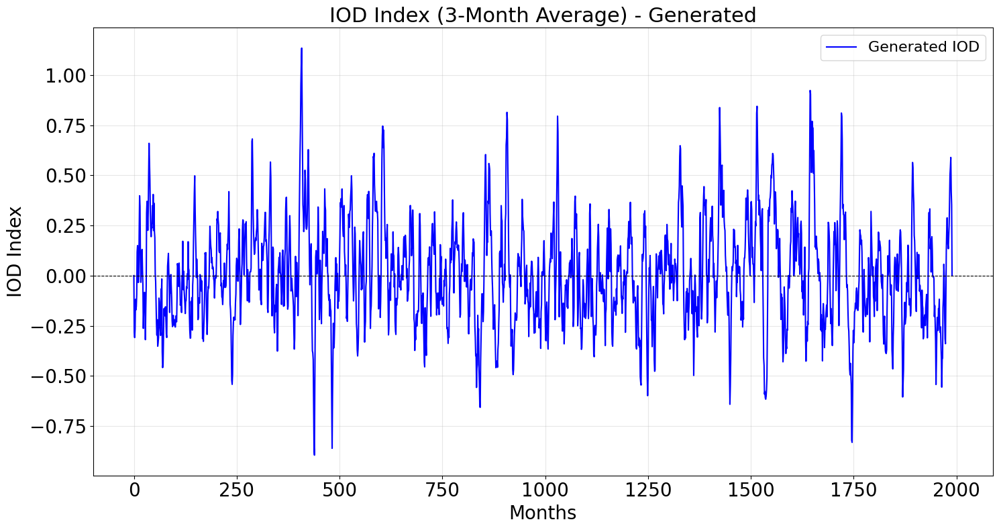

In [ ]:
import matplotlib.pyplot as plt

f = plt.figure()
f.set_figwidth(15)
f.set_figheight(8)

plt.plot(IOD_gen_3mo_avg.values.reshape(-1), linewidth=1.5, color='blue', label='Generated IOD')
plt.axhline(y=0, color='black', linestyle='--', linewidth=0.8)

plt.xlabel('Months', fontsize=20)
plt.ylabel('IOD Index', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(fontsize=16)
plt.title('IOD Index (3-Month Average) - Generated', fontsize=22)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('/content/output/IOD_3mo_gen.png', dpi=300, bbox_inches='tight')
plt.show()

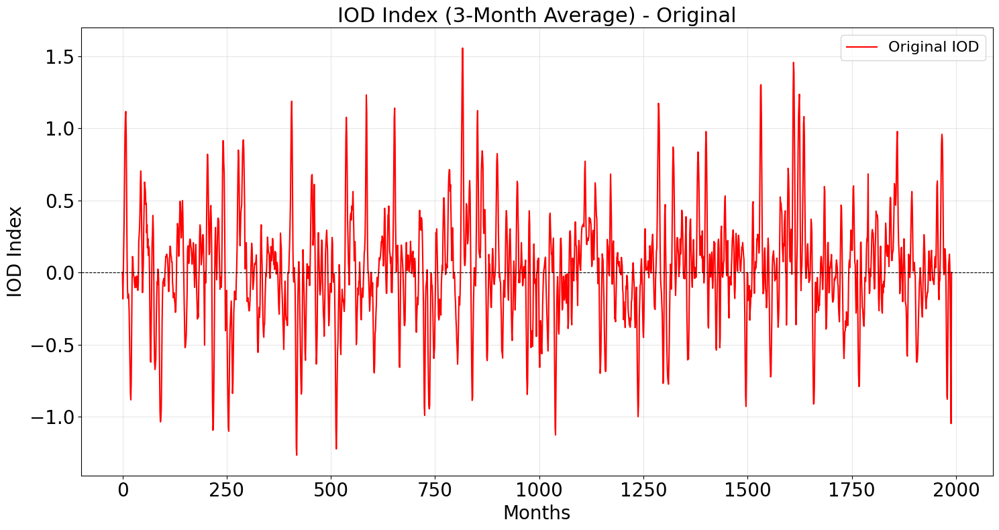

In [ ]:
f = plt.figure()
f.set_figwidth(15)
f.set_figheight(8)

plt.plot(IOD_ori_3mo_avg.values.reshape(-1), linewidth=1.5, color='red', label='Original IOD')
plt.axhline(y=0, color='black', linestyle='--', linewidth=0.8)

plt.xlabel('Months', fontsize=20)
plt.ylabel('IOD Index', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(fontsize=16)
plt.title('IOD Index (3-Month Average) - Original', fontsize=22)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('/content/output/IOD_3mo_ori.png', dpi=300, bbox_inches='tight')
plt.show()

/tmp/ipykernel_4701/422458785.py:67: RuntimeWarning: divide by zero encountered in divide
  period = 1.0 / f


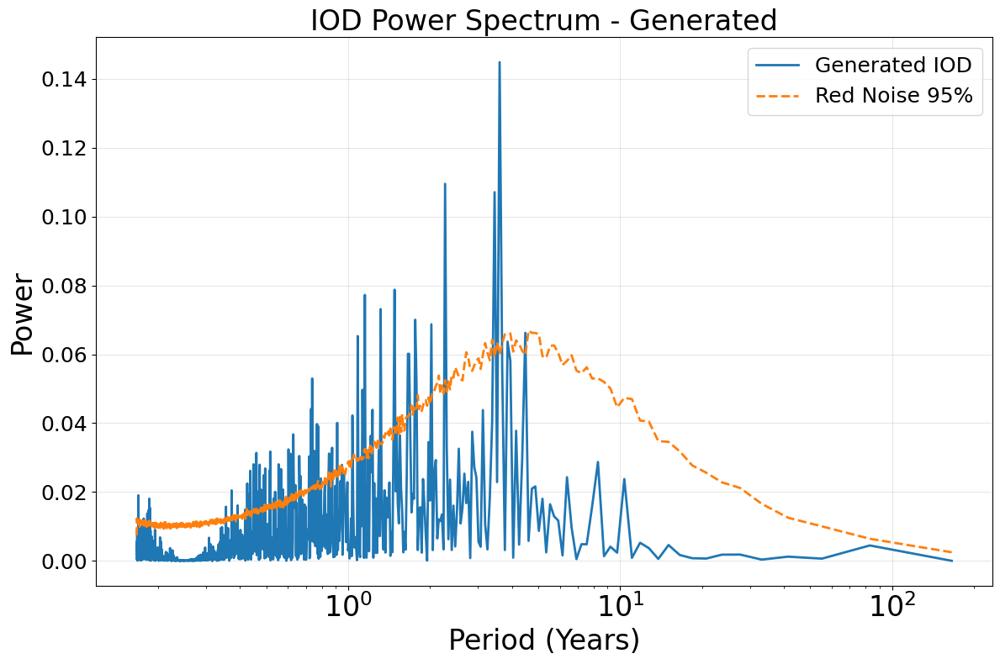

In [ ]:
plot = cal_power_spect(IOD_gen_3mo_avg.values.reshape(-1))

plt.figure(figsize=(12, 8))
plt.plot(plot[:, 0] / 12, plot[:, 1], linewidth=2, label='Generated IOD')
plt.plot(plot[:, 0] / 12, plot[:, 2], linewidth=2, linestyle='--', label='Red Noise 95%')
plt.xscale('log')
plt.xticks(fontsize=24)
plt.yticks(fontsize=18)
plt.xlabel('Period (Years)', fontsize=24)
plt.ylabel('Power', fontsize=24)
plt.legend(fontsize=18)
plt.title('IOD Power Spectrum - Generated', fontsize=24)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('/content/output/IOD_3mo_pow_spec_gen.png', dpi=300, bbox_inches='tight')
plt.show()

/tmp/ipykernel_4701/422458785.py:67: RuntimeWarning: divide by zero encountered in divide
  period = 1.0 / f


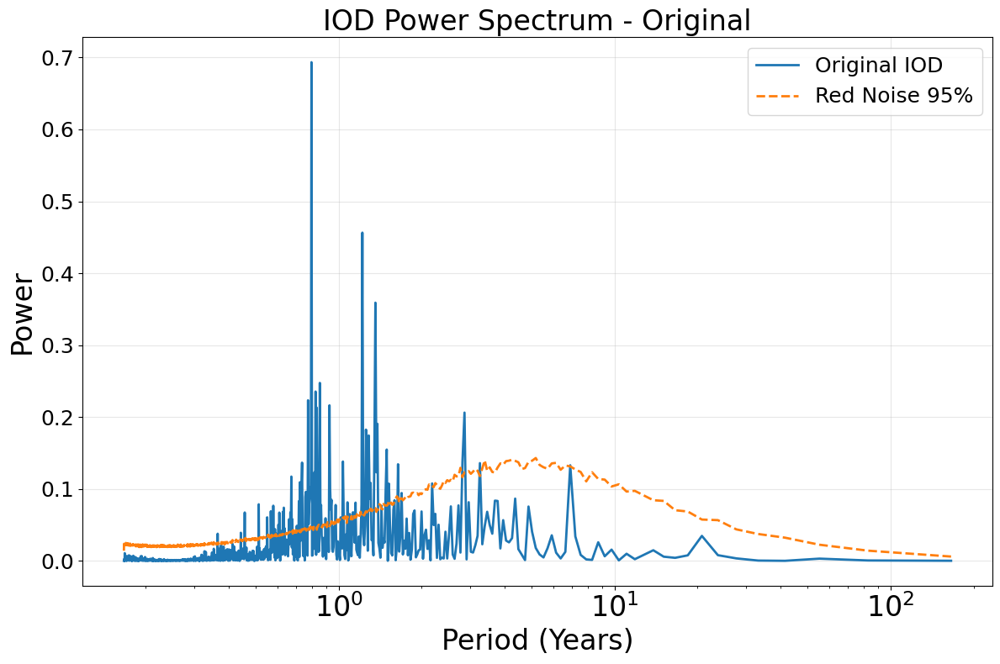

In [ ]:
plot = cal_power_spect(IOD_ori_3mo_avg.values.reshape(-1))

plt.figure(figsize=(12, 8))
plt.plot(plot[:, 0] / 12, plot[:, 1], linewidth=2, label='Original IOD')
plt.plot(plot[:, 0] / 12, plot[:, 2], linewidth=2, linestyle='--', label='Red Noise 95%')
plt.xscale('log')
plt.xticks(fontsize=24)
plt.yticks(fontsize=18)
plt.xlabel('Period (Years)', fontsize=24)
plt.ylabel('Power', fontsize=24)
plt.legend(fontsize=18)
plt.title('IOD Power Spectrum - Original', fontsize=24)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('/content/output/IOD_3mo_pow_spec_ori.png', dpi=300, bbox_inches='tight')
plt.show()

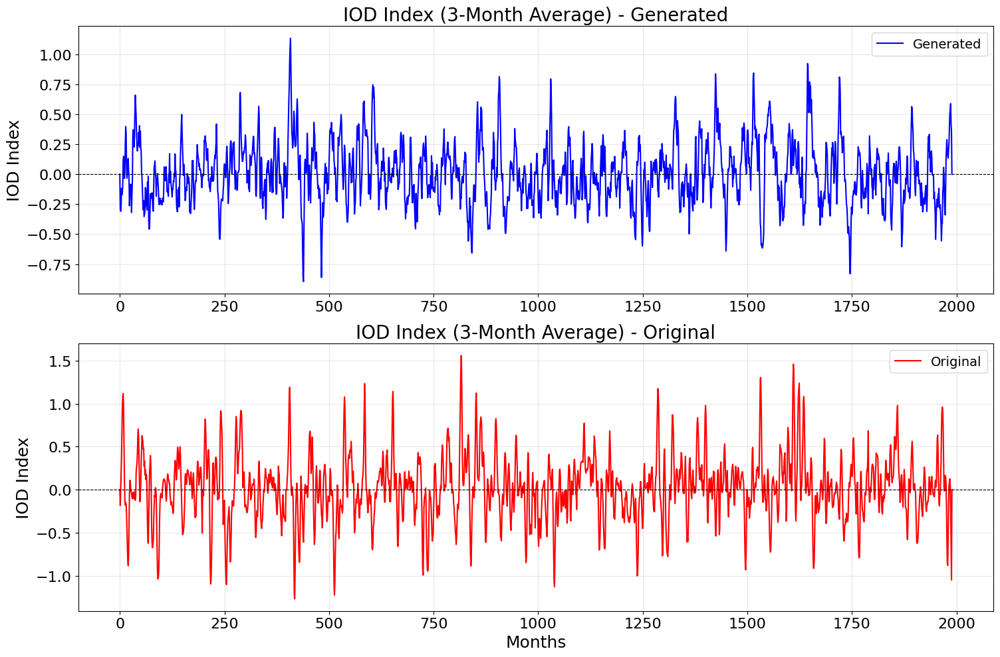

In [ ]:
f, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10))

# Generated IOD
ax1.plot(IOD_gen_3mo_avg.values.reshape(-1), linewidth=1.5, color='blue', label='Generated')
ax1.axhline(y=0, color='black', linestyle='--', linewidth=0.8)
ax1.set_ylabel('IOD Index', fontsize=18)
ax1.set_title('IOD Index (3-Month Average) - Generated', fontsize=20)
ax1.legend(fontsize=14)
ax1.grid(True, alpha=0.3)
ax1.tick_params(labelsize=16)

# Original IOD
ax2.plot(IOD_ori_3mo_avg.values.reshape(-1), linewidth=1.5, color='red', label='Original')
ax2.axhline(y=0, color='black', linestyle='--', linewidth=0.8)
ax2.set_xlabel('Months', fontsize=18)
ax2.set_ylabel('IOD Index', fontsize=18)
ax2.set_title('IOD Index (3-Month Average) - Original', fontsize=20)
ax2.legend(fontsize=14)
ax2.grid(True, alpha=0.3)
ax2.tick_params(labelsize=16)

plt.tight_layout()
plt.savefig('/content/output/IOD_3mo_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

**ONI Plots**

VAE ONI shape: (10, 197) -> flatten to (1970,)
ORI ONI shape: (10, 197) -> flatten to (1970,)


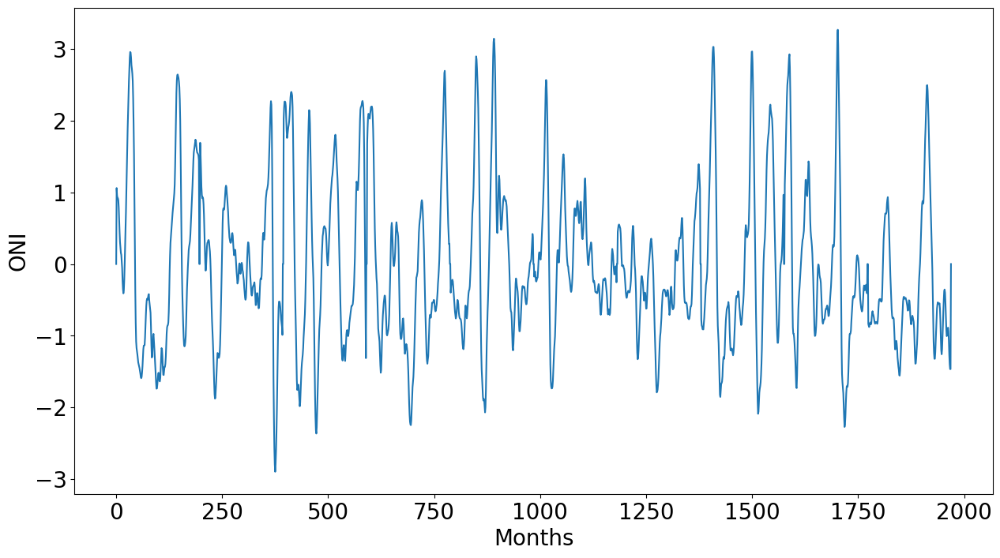

/tmp/ipykernel_4701/422458785.py:67: RuntimeWarning: divide by zero encountered in divide
  period = 1.0 / f


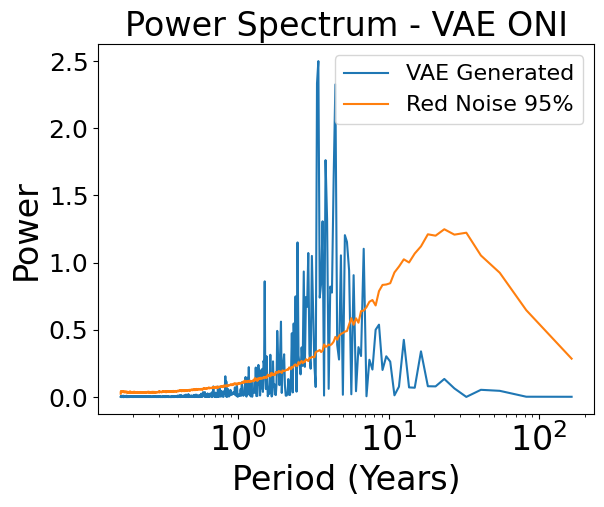

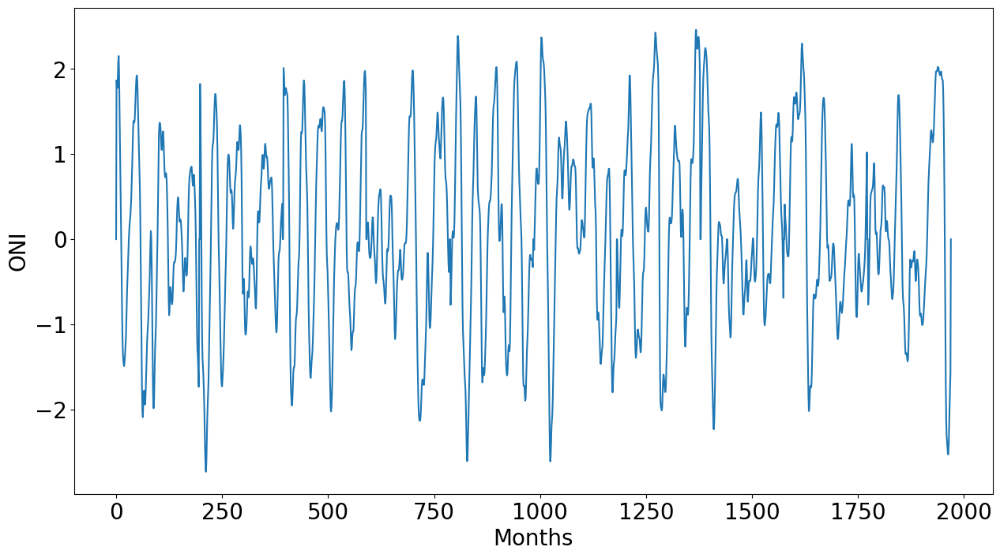

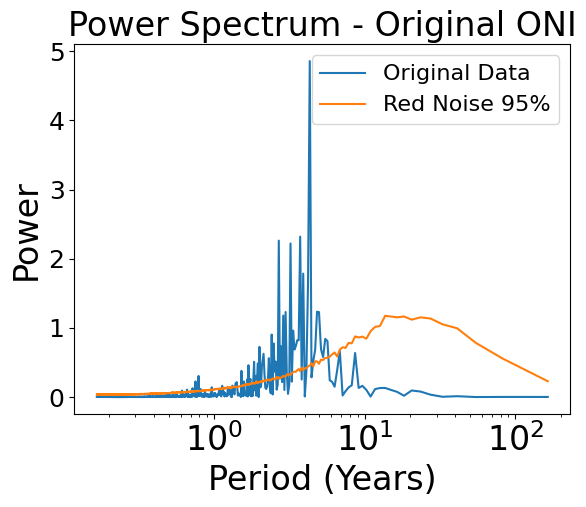

In [ ]:
ONI_vae = (
    vae_anom_ds_3mo_avg
    .sel(lat=slice(-5.0, 5.0), lon=slice(170, 240))['sst']
    .mean(['lat', 'lon'])
)

ONI_ori = (
    ori_anom_ds_3mo_avg
    .sel(lat=slice(-5.0, 5.0), lon=slice(170, 240))['sst']
    .mean(['lat', 'lon'])
)


ONI_vae_3mo_avg = ONI_vae.rolling(time=3, center=True).mean().fillna(0)
ONI_ori_3mo_avg = ONI_ori.rolling(time=3, center=True).mean().fillna(0)



vae_time_steps = ONI_vae_3mo_avg.shape[1]
ori_time_steps = ONI_ori_3mo_avg.shape[1]

num_vae_ensembles = ONI_vae_3mo_avg.shape[0]
num_ori_ensembles = ONI_ori_3mo_avg.shape[0]

total_vae_steps = num_vae_ensembles * vae_time_steps
total_ori_steps = num_ori_ensembles * ori_time_steps

print(f"VAE ONI shape: {ONI_vae_3mo_avg.shape} -> flatten to ({total_vae_steps},)")
print(f"ORI ONI shape: {ONI_ori_3mo_avg.shape} -> flatten to ({total_ori_steps},)")


import os
os.makedirs('./checkpoints', exist_ok=True)


f = plt.figure()
f.set_figwidth(15)
f.set_figheight(8)

plt.plot(ONI_vae_3mo_avg.values.reshape(total_vae_steps))

plt.xlabel('Months', fontsize=20)
plt.ylabel('ONI', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.savefig('./checkpoints/ONI_3ma_vae.png', dpi=300, bbox_inches='tight')
plt.show()


plot = cal_power_spect(ONI_vae_3mo_avg.values.reshape(total_vae_steps))

plt.figure()
plt.plot(plot[:, 0] / 12, plot[:, 1], label='VAE Generated')
plt.plot(plot[:, 0] / 12, plot[:, 2], label='Red Noise 95%')
plt.xscale('log')
plt.xticks(fontsize=24)
plt.yticks(fontsize=18)
plt.xlabel('Period (Years)', fontsize=24)
plt.ylabel('Power', fontsize=24)
plt.legend(fontsize=16)
plt.title('Power Spectrum - VAE ONI', fontsize=24)
plt.savefig('./checkpoints/ONI_3ma_pow_spec_vae.png', dpi=300, bbox_inches='tight')
plt.show()

f = plt.figure()
f.set_figwidth(15)
f.set_figheight(8)

plt.plot(ONI_ori_3mo_avg.values.reshape(total_ori_steps))

plt.xlabel('Months', fontsize=20)
plt.ylabel('ONI', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.savefig('./checkpoints/ONI_3ma_ori.png', dpi=300, bbox_inches='tight')
plt.show()


plot = cal_power_spect(ONI_ori_3mo_avg.values.reshape(total_ori_steps))

plt.figure()
plt.plot(plot[:, 0] / 12, plot[:, 1], label='Original Data')
plt.plot(plot[:, 0] / 12, plot[:, 2], label='Red Noise 95%')
plt.xscale('log')
plt.xticks(fontsize=24)
plt.yticks(fontsize=18)
plt.xlabel('Period (Years)', fontsize=24)
plt.ylabel('Power', fontsize=24)
plt.legend(fontsize=16)
plt.title('Power Spectrum - Original ONI', fontsize=24)
plt.savefig('./checkpoints/ONI_3ma_pow_spec_ori.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
ONI_gen = vae_anom_ds_3mo_avg.sel(
    lat=slice(-5.0, 5.0),
    lon=slice(170, 240)
)['sst'].mean(['lat', 'lon'])


ONI_ori = ori_anom_ds_3mo_avg.sel(
    lat=slice(-5.0, 5.0),
    lon=slice(170, 240)
)['sst'].mean(['lat', 'lon'])

print(f"ONI_gen shape: {ONI_gen.shape}")
print(f"ONI_ori shape: {ONI_ori.shape}")

ONI_gen shape: (10, 197)
ONI_ori shape: (10, 197)


Generated ONI shape: (10, 197)
Original ONI shape: (10, 197)


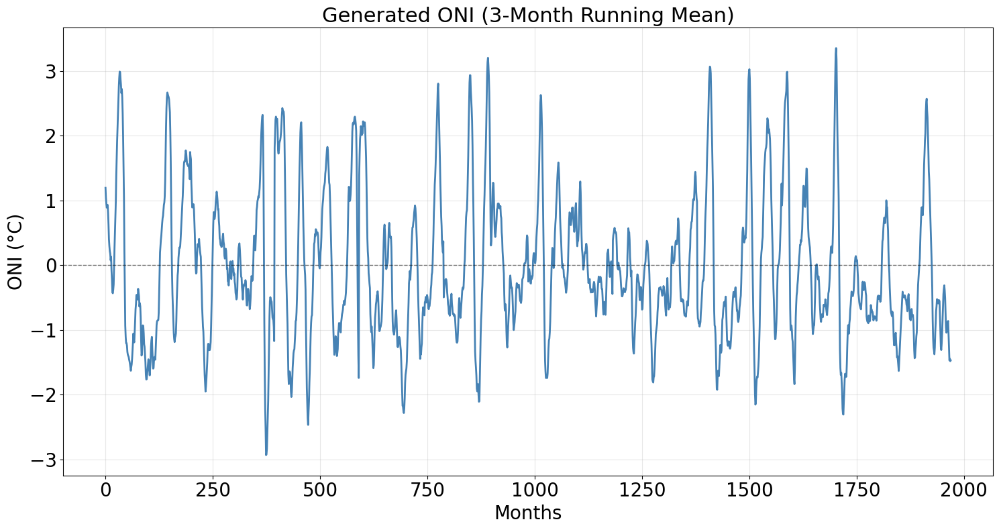

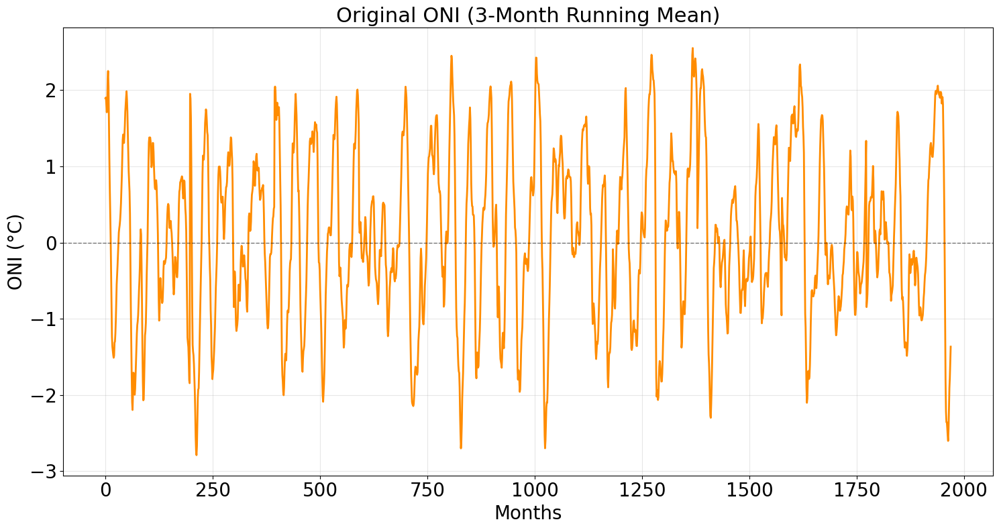

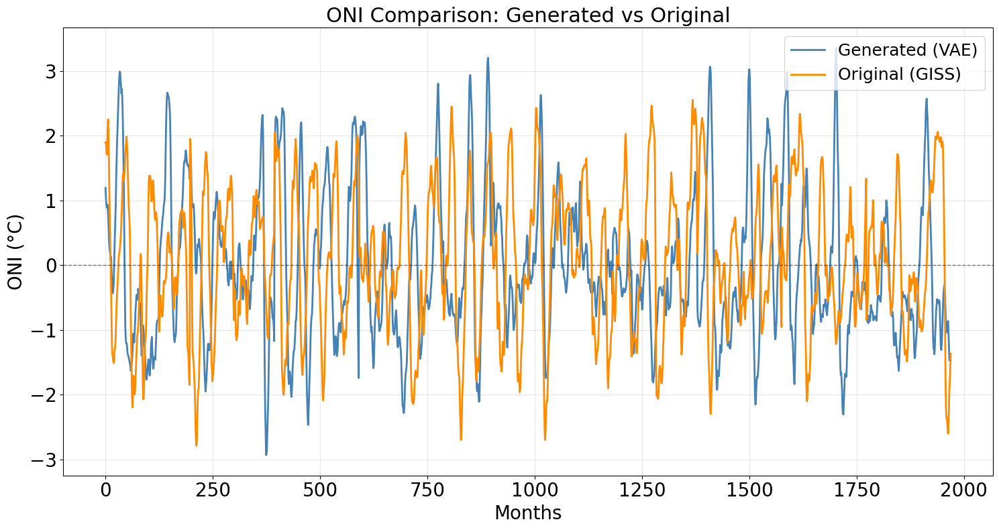

/tmp/ipykernel_4701/422458785.py:67: RuntimeWarning: divide by zero encountered in divide
  period = 1.0 / f


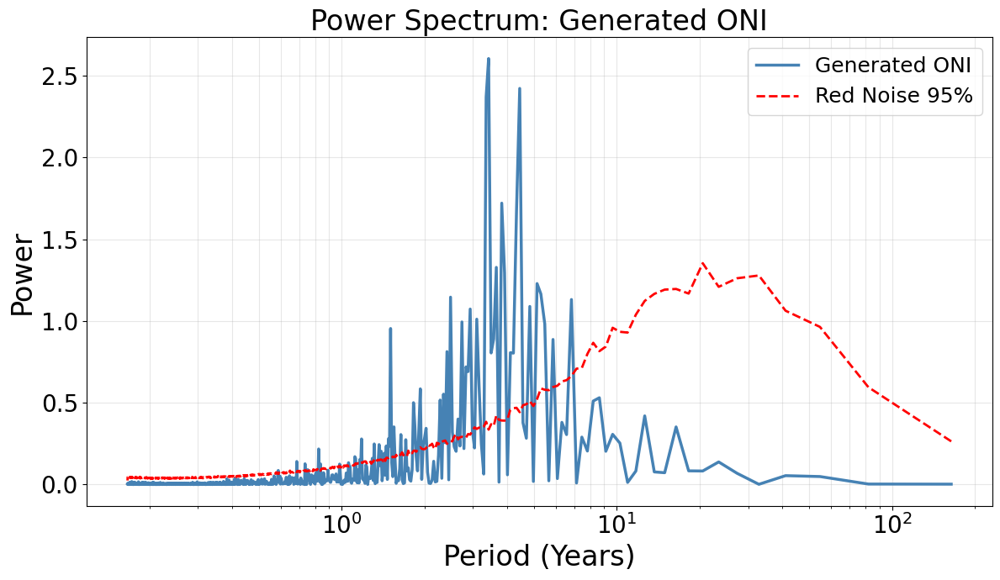

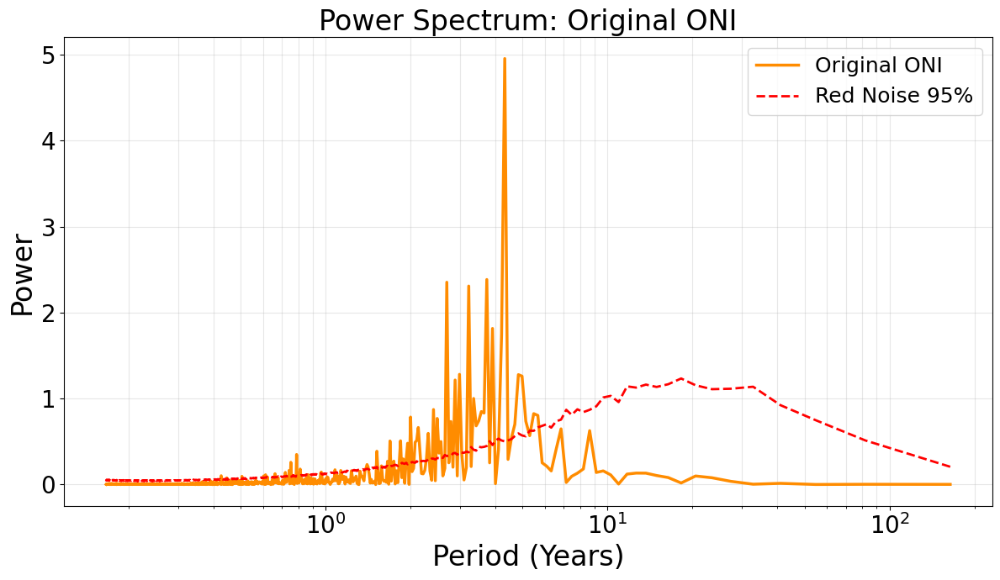

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os


os.makedirs('../Data/output/Paper_results/GISS', exist_ok=True)



ONI_gen = vae_anom_ds.sel(
    lat=slice(-5.0, 5.0),
    lon=slice(170, 240)
)['sst'].mean(['lat', 'lon'])


ONI_ori = ori_anom_ds.sel(
    lat=slice(-5.0, 5.0),
    lon=slice(170, 240)
)['sst'].mean(['lat', 'lon'])


ONI_gen_3mo_avg = ONI_gen.rolling(time=3, center=True).mean().dropna('time')
ONI_ori_3mo_avg = ONI_ori.rolling(time=3, center=True).mean().dropna('time')

print(f"Generated ONI shape: {ONI_gen_3mo_avg.shape}")
print(f"Original ONI shape: {ONI_ori_3mo_avg.shape}")

fig = plt.figure(figsize=(15, 8))


oni_gen_values = ONI_gen_3mo_avg.values.flatten()

plt.plot(oni_gen_values, linewidth=2, color='steelblue')
plt.axhline(y=0, color='black', linestyle='--', linewidth=1, alpha=0.5)

plt.xlabel('Months', fontsize=20)
plt.ylabel('ONI (°C)', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.grid(True, alpha=0.3)
plt.title('Generated ONI (3-Month Running Mean)', fontsize=22)

plt.tight_layout()
plt.savefig('../Data/output/Paper_results/ONI_3mo_gen.png', dpi=300, bbox_inches='tight')
plt.show()


fig = plt.figure(figsize=(15, 8))

oni_ori_values = ONI_ori_3mo_avg.values.flatten()

plt.plot(oni_ori_values, linewidth=2, color='darkorange')
plt.axhline(y=0, color='black', linestyle='--', linewidth=1, alpha=0.5)

plt.xlabel('Months', fontsize=20)
plt.ylabel('ONI (°C)', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.grid(True, alpha=0.3)
plt.title('Original ONI (3-Month Running Mean)', fontsize=22)

plt.tight_layout()
plt.savefig('../Data/output/Paper_results/GISS/ONI_3mo_ori.png', dpi=300, bbox_inches='tight')
plt.show()

fig = plt.figure(figsize=(15, 8))


min_len = min(len(oni_gen_values), len(oni_ori_values))
oni_gen_plot = oni_gen_values[:min_len]
oni_ori_plot = oni_ori_values[:min_len]

plt.plot(oni_gen_plot, linewidth=2, label='Generated (VAE)', color='steelblue')
plt.plot(oni_ori_plot, linewidth=2, label='Original (GISS)', color='darkorange')
plt.axhline(y=0, color='black', linestyle='--', linewidth=1, alpha=0.5)

plt.xlabel('Months', fontsize=20)
plt.ylabel('ONI (°C)', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.grid(True, alpha=0.3)
plt.legend(fontsize=18, loc='best')
plt.title('ONI Comparison: Generated vs Original', fontsize=22)

plt.tight_layout()
plt.savefig('../Data/output/Paper_results/ONI_comparison.png', dpi=300, bbox_inches='tight')
plt.show()


if 'cal_power_spect' in dir():


    fig = plt.figure(figsize=(12, 7))

    plot_gen = cal_power_spect(oni_gen_values)

    plt.plot(plot_gen[:, 0] / 12, plot_gen[:, 1],
             linewidth=2.5, label='Generated ONI', color='steelblue')
    plt.plot(plot_gen[:, 0] / 12, plot_gen[:, 2],
             linewidth=2, linestyle='--', label='Red Noise 95%', color='red')

    plt.xscale('log')
    plt.xlabel('Period (Years)', fontsize=24)
    plt.ylabel('Power', fontsize=24)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.legend(fontsize=18, loc='best')
    plt.grid(True, alpha=0.3, which='both')
    plt.title('Power Spectrum: Generated ONI', fontsize=24)

    plt.tight_layout()
    plt.savefig('../Data/output/Paper_results/ONI_pow_spec_gen.png', dpi=300, bbox_inches='tight')
    plt.show()


    fig = plt.figure(figsize=(12, 7))

    plot_ori = cal_power_spect(oni_ori_values)

    plt.plot(plot_ori[:, 0] / 12, plot_ori[:, 1],
             linewidth=2.5, label='Original ONI', color='darkorange')
    plt.plot(plot_ori[:, 0] / 12, plot_ori[:, 2],
             linewidth=2, linestyle='--', label='Red Noise 95%', color='red')

    plt.xscale('log')
    plt.xlabel('Period (Years)', fontsize=24)
    plt.ylabel('Power', fontsize=24)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.legend(fontsize=18, loc='best')
    plt.grid(True, alpha=0.3, which='both')
    plt.title('Power Spectrum: Original ONI', fontsize=24)

    plt.tight_layout()
    plt.savefig('../Data/output/Paper_results/ONI_pow_spec_ori.png', dpi=300, bbox_inches='tight')
    plt.show()




In [ ]:
import numpy as np
import xarray as xr


gen_anom_ds = vae_anom_ds


def _standardize_lon_0_360(ds, lon_name="lon"):
    lon = ds[lon_name]

    if float(lon.min()) < 0:
        ds = ds.assign_coords({lon_name: (lon % 360)})

    return ds.sortby(lon_name)

def _sel_latlon_box(ds, lat_name="lat", lon_name="lon",
                    lat_bounds=(-5.0, 5.0), lon_bounds=(170.0, 240.0)):
    lat0, lat1 = lat_bounds
    lon0, lon1 = lon_bounds


    lat_coord = ds[lat_name]
    if lat_coord[0] < lat_coord[-1]:
        ds = ds.sel({lat_name: slice(lat0, lat1)})
    else:
        ds = ds.sel({lat_name: slice(lat1, lat0)})

    ds = _standardize_lon_0_360(ds, lon_name=lon_name)


    if lon0 <= lon1:
        ds = ds.sel({lon_name: slice(lon0, lon1)})
    else:
        ds = xr.concat(
            [ds.sel({lon_name: slice(lon0, 360)}),
             ds.sel({lon_name: slice(0, lon1)})],
            dim=lon_name
        )
    return ds

def compute_ONI(ds, var="sst", lat_name="lat", lon_name="lon",
                lat_bounds=(-5.0, 5.0), lon_bounds=(170.0, 240.0),
                area_weighted=False):
    ds_box = _sel_latlon_box(
        ds, lat_name=lat_name, lon_name=lon_name,
        lat_bounds=lat_bounds, lon_bounds=lon_bounds
    )
    da = ds_box[var]


    if area_weighted:
        w = np.cos(np.deg2rad(ds_box[lat_name]))
        oni = da.weighted(w).mean(dim=[lat_name, lon_name])
    else:
        oni = da.mean(dim=[lat_name, lon_name])

    return oni.rename("ONI")


ONI_gen = compute_ONI(gen_anom_ds, area_weighted=False)
ONI_ori = compute_ONI(ori_anom_ds, area_weighted=False)




ONI_gen_3mo_avg = ONI_gen.rolling(time=3, center=True).mean().fillna(0)
ONI_ori_3mo_avg = ONI_ori.rolling(time=3, center=True).mean().fillna(0)

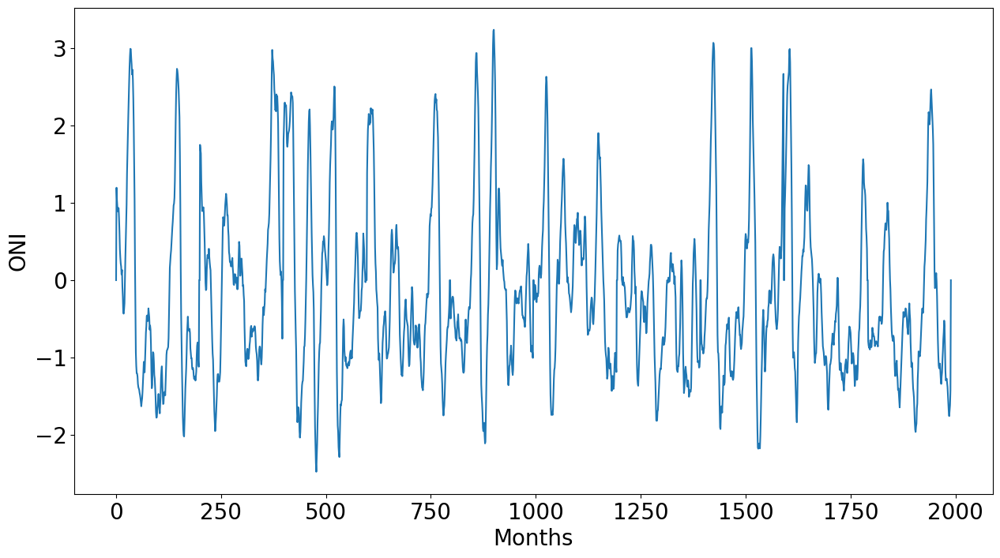

/tmp/ipykernel_2794/4139932518.py:46: RuntimeWarning: divide by zero encountered in divide
  period_Po = 1.0 / f


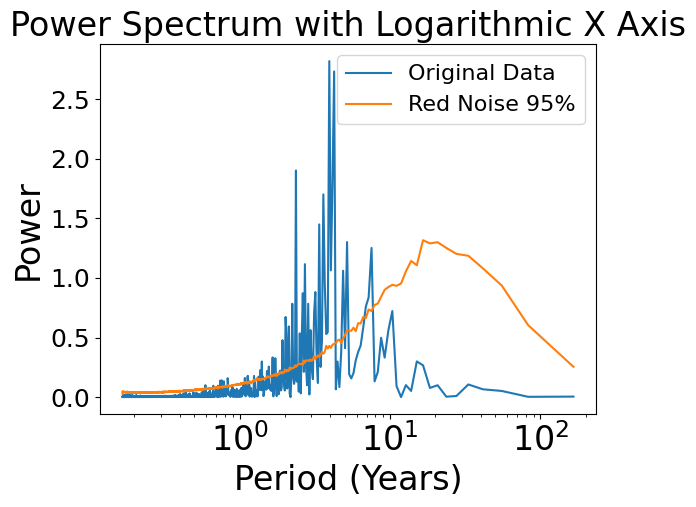

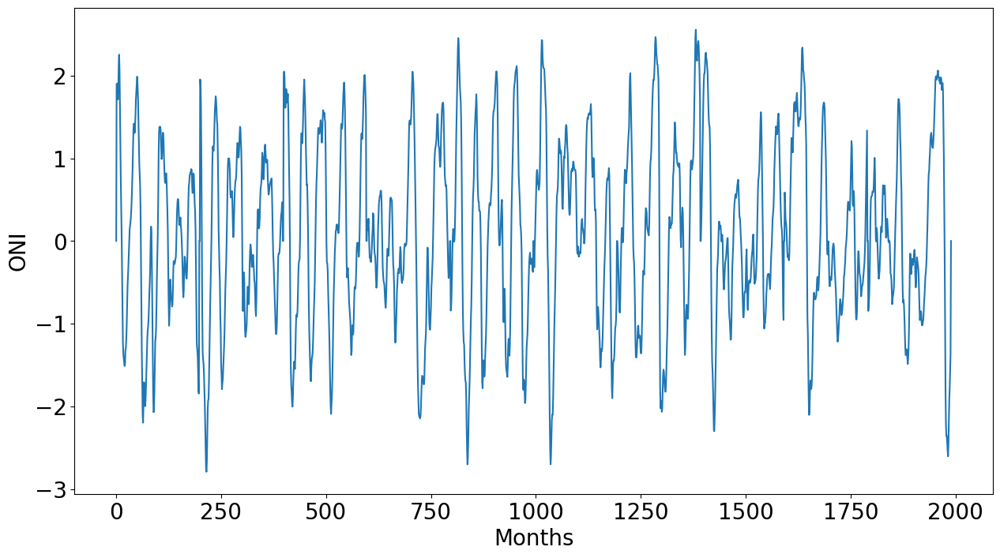

In [ ]:
import matplotlib.pyplot as plt

f = plt.figure(figsize=(15, 8))
plt.plot(ONI_gen_3mo_avg.values.reshape(-1))
plt.xlabel('Months', fontsize=20)
plt.ylabel('ONI', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.savefig('../Data/output/Paper_results/GISS/ONI_3ma_gen.png', dpi=300, bbox_inches='tight')
plt.show()

plot = cal_power_spect(ONI_gen_3mo_avg.values.reshape(-1))
plt.plot(plot[:, 0] / 12, plot[:, 1], label='Original Data')
plt.plot(plot[:, 0] / 12, plot[:, 2], label='Red Noise 95%')
plt.xscale('log')
plt.xticks(fontsize=24)
plt.yticks(fontsize=18)
plt.xlabel('Period (Years)', fontsize=24)
plt.ylabel('Power', fontsize=24)
plt.legend(fontsize=16)
plt.title('Power Spectrum with Logarithmic X Axis', fontsize=24)
plt.savefig('../Data/output/Paper_results/GISS/ONI_3ma_pow_spec_gen.png', dpi=300, bbox_inches='tight')
plt.show()

f = plt.figure(figsize=(15, 8))
plt.plot(ONI_ori_3mo_avg.values.reshape(-1))
plt.xlabel('Months', fontsize=20)
plt.ylabel('ONI', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.savefig('../Data/output/Paper_results/GISS/ONI_3ma_ori.png', dpi=300, bbox_inches='tight')
plt.show()

**AMO Index Plots**

In [ ]:
def compute_amo_index(ds):
    """
    Compute AMO index (North Atlantic SST mean).

    Args:
        ds: xarray Dataset with dims (ensemble, time, lat, lon)

    Returns:
        amo: DataArray (ensemble, time)
    """
    amo = ds.sel(
        lat=slice(0, 70),
        lon=slice(290, 353)
    )['sst'].mean(['lat', 'lon'])

    return amo

In [ ]:
AMO_vae = compute_amo_index(vae_anom_ds_3mo_avg)
AMO_ori = compute_amo_index(ori_anom_ds_3mo_avg)

In [ ]:
min_len = min(AMO_vae.shape[1], AMO_ori.shape[1])

amo_vae_np = AMO_vae[:, :min_len].values
amo_ori_np = AMO_ori[:, :min_len].values

AMO_gen shape: (10, 197)  =>  flat length: 1970
AMO_obs shape: (10, 197)  =>  flat length: 1970
Generated std:  0.1825
Observed std:   0.1398
Mean bias:      0.1470


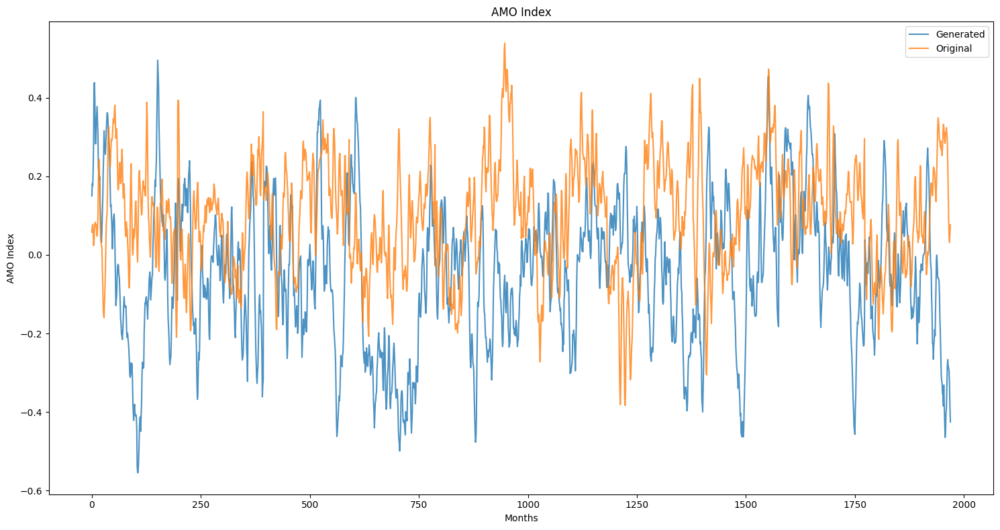

AR(1) rho = 0.9750


/tmp/ipykernel_4701/2667722321.py:113: RuntimeWarning: divide by zero encountered in divide
  period_Po = np.where(f_freq > 0, 1.0 / f_freq, np.inf)


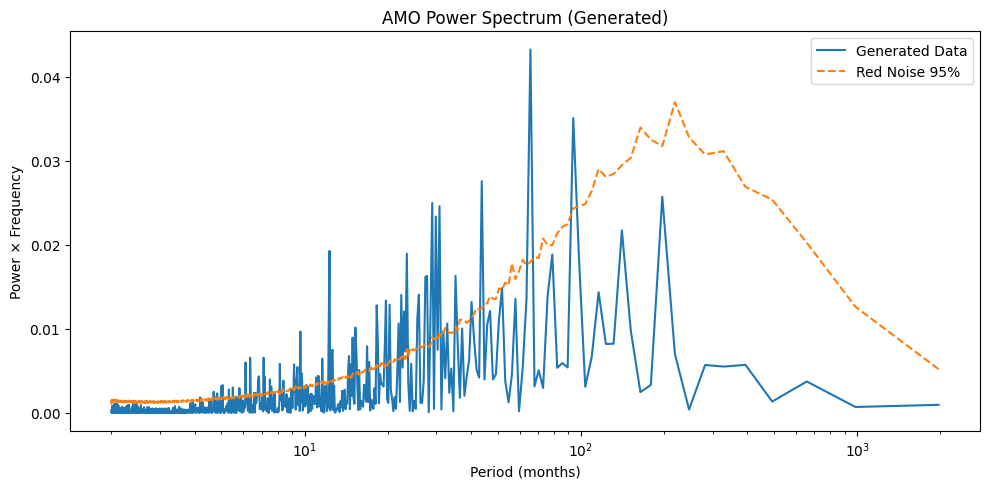

In [ ]:
AMO_gen = (
    vae_anom_ds_3mo_avg
    .sel(lat=slice(0.0, 70.0), lon=slice(290, 353))['sst']
    .mean(['lat', 'lon'])
)

AMO_obs = (
    ori_anom_ds_3mo_avg
    .sel(lat=slice(0.0, 70.0), lon=slice(290, 353))['sst']
    .mean(['lat', 'lon'])
)


AMO_gen_flat = AMO_gen.values.reshape(-1)
AMO_obs_flat = AMO_obs.values.reshape(-1)

n_gen = len(AMO_gen_flat)
n_obs = len(AMO_obs_flat)

print(f"AMO_gen shape: {AMO_gen.values.shape}  =>  flat length: {n_gen}")
print(f"AMO_obs shape: {AMO_obs.values.shape}  =>  flat length: {n_obs}")


generated_bias = AMO_obs_flat.mean() - AMO_gen_flat[:n_obs].mean()
generated_std  = AMO_gen_flat.std()
obs_std        = AMO_obs_flat.std()

print(f"Generated std:  {generated_std:.4f}")
print(f"Observed std:   {obs_std:.4f}")
print(f"Mean bias:      {generated_bias:.4f}")

f_fig = plt.figure()
f_fig.set_figwidth(15)
f_fig.set_figheight(8)

plt.plot(AMO_gen_flat, label='Generated', alpha=0.8)
plt.plot(AMO_obs_flat, label='Original',  alpha=0.8)
plt.xlabel('Months')
plt.ylabel('AMO Index')
plt.legend()
plt.title('AMO Index')
plt.tight_layout()
plt.savefig('./AMO.png', dpi=300, bbox_inches='tight')
plt.show()


import numpy as np
from scipy import signal

data = AMO_gen_flat.copy()
nd   = len(data)


sommesup = np.sum(data[1:] * data[:-1])
sommeinf = np.sum(data[:-1] ** 2)
rho  = sommesup / sommeinf
srho = np.sqrt(1.0 - rho ** 2)

print(f"AR(1) rho = {rho:.4f}")


nsim       = 1500
red_sum    = np.zeros((nd, nsim))
rzero      = 0.0

for i in range(nsim):
    red_sum[0, i] = rho * rzero + srho * np.random.randn()
    for j in range(1, nd):
        red_sum[j, i] = rho * red_sum[j - 1, i] + srho * np.random.randn()


fs = 1
f_freq, Po = signal.periodogram(data, fs, detrend='linear')
npo = len(Po)
Ax  = np.sum(Po) / npo


specred = np.zeros((npo, nsim))

for i in range(nsim):
    red2   = red_sum[:, i]
    red2n  = red2 - red2.mean()
    _, Pr  = signal.periodogram(red2n, fs, detrend='linear')
    Ar     = np.sum(Pr) / len(Pr)
    specred[:, i] = Pr * (Ax / Ar)


n85 = round(nsim * 85 / 100)
n90 = round(nsim * 90 / 100)
n95 = round(nsim * 95 / 100)
n99 = round(nsim * 99 / 100)

tabvecsort = np.zeros((npo, nsim))
for i in range(npo):
    tabvecsort[i, :] = np.sort(specred[i, :])

tabMC = np.zeros((npo, 4))
for i in range(npo):
    tabMC[i, 0] = tabvecsort[i, n85]
    tabMC[i, 1] = tabvecsort[i, n90]
    tabMC[i, 2] = tabvecsort[i, n95]
    tabMC[i, 3] = tabvecsort[i, n99]


period_Po = np.where(f_freq > 0, 1.0 / f_freq, np.inf)

plot = np.zeros((npo, 3), dtype=np.float32)
plot[:, 0] = period_Po
plot[:, 1] = f_freq * Po
plot[:, 2] = f_freq * tabMC[:, 2]


plt.figure(figsize=(10, 5))
plt.plot(plot[1:, 0], plot[1:, 1], label='Generated Data')
plt.plot(plot[1:, 0], plot[1:, 2], label='Red Noise 95%', linestyle='--')
plt.xscale('log')
plt.xlabel('Period (months)')
plt.ylabel('Power × Frequency')
plt.legend()
plt.title('AMO Power Spectrum (Generated)')
plt.tight_layout()
plt.savefig('./AMO_Pow_Spec_gen.png', dpi=300, bbox_inches='tight')
plt.show()

AMO_gen shape: (10, 197)
AMO_obs shape: (10, 197)
Generated flat length : 1970  (10 ens x 197 time)
Observed  flat length : 1970  (10 ens x 197 time)


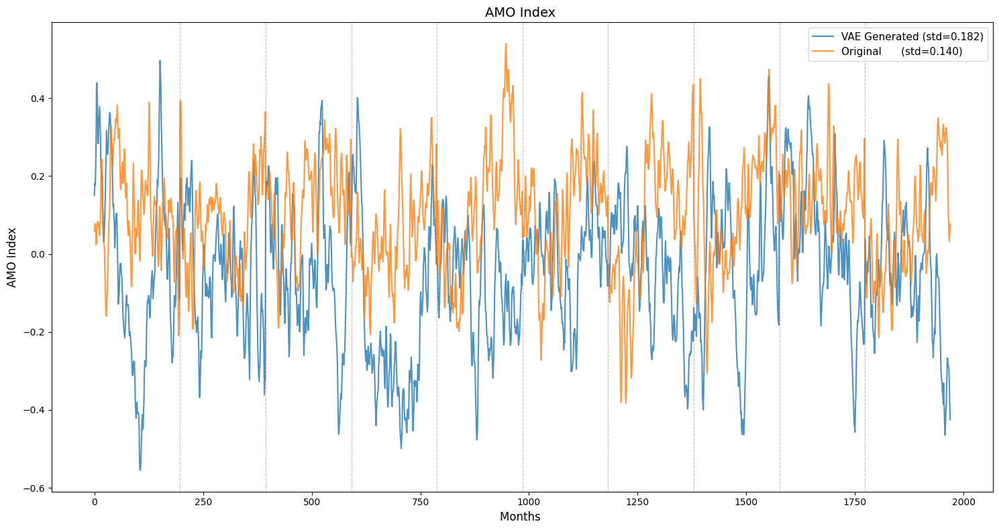

Mean bias (obs - gen): 0.1470


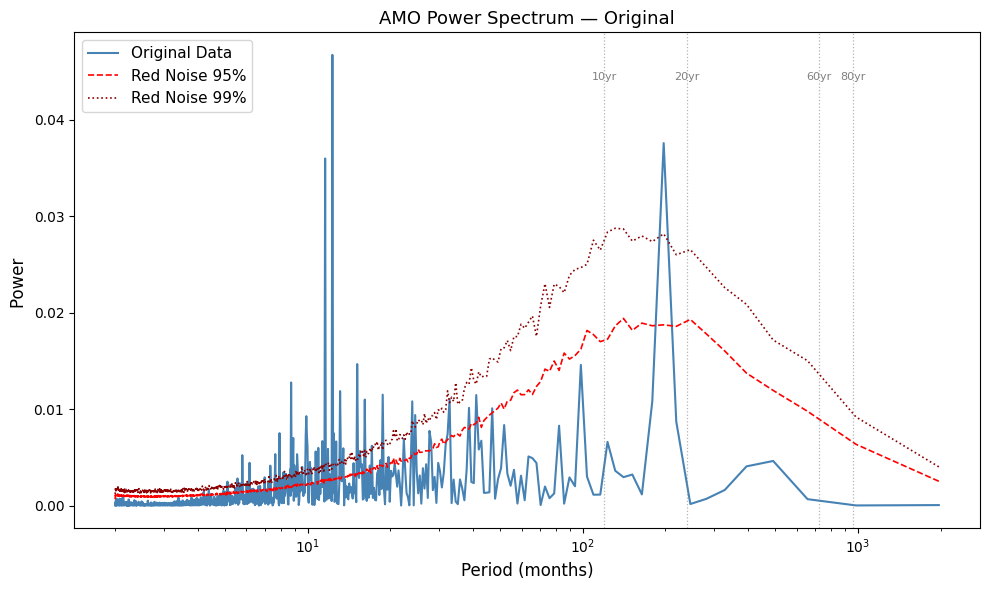

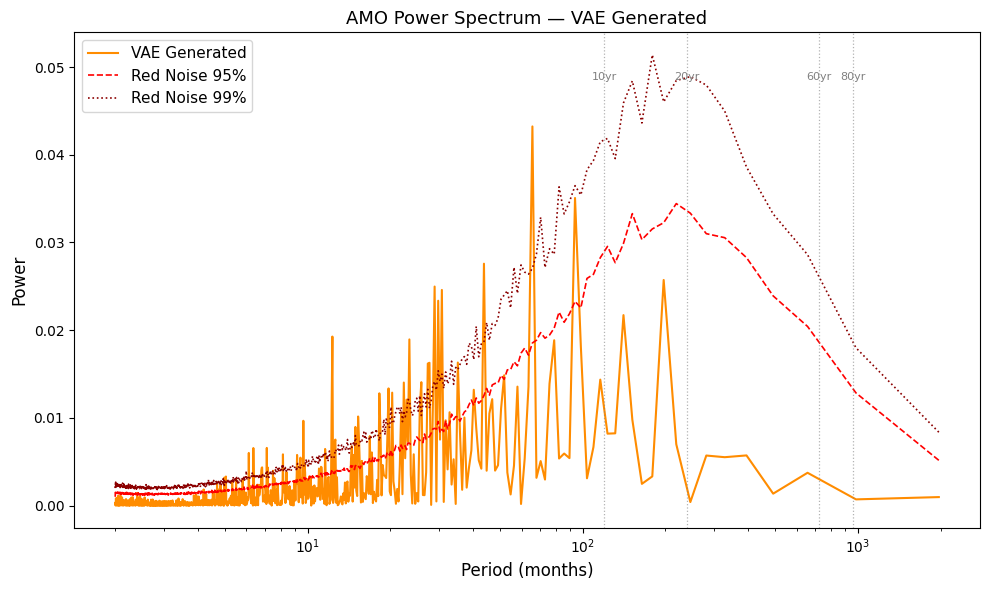

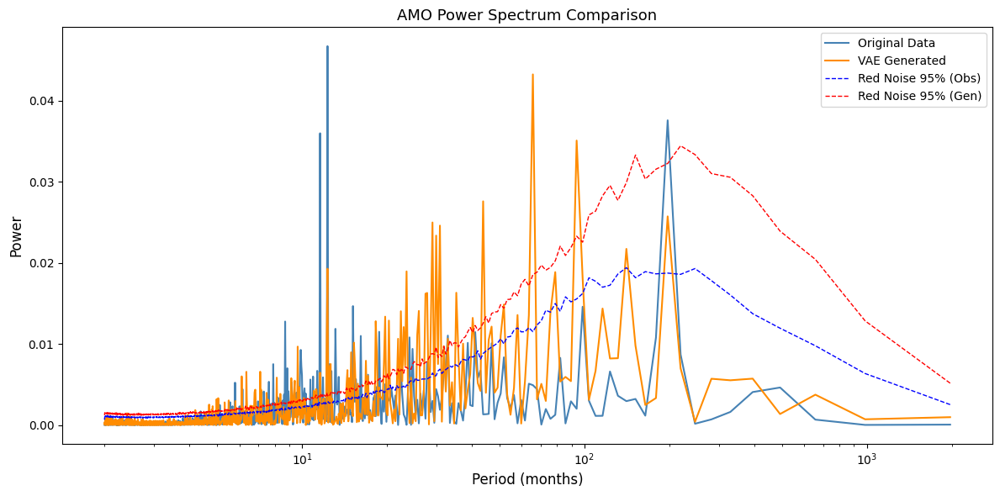

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
import pandas as pd


AMO_gen = (
    vae_anom_ds_3mo_avg
    .sel(lat=slice(0.0, 70.0), lon=slice(290, 353))['sst']
    .mean(['lat', 'lon'])
)


AMO_obs = (
    ori_anom_ds_3mo_avg
    .sel(lat=slice(0.0, 70.0), lon=slice(290, 353))['sst']
    .mean(['lat', 'lon'])
)

print("AMO_gen shape:", AMO_gen.shape)
print("AMO_obs shape:", AMO_obs.shape)

AMO_gen_flat = AMO_gen.values.reshape(-1)
AMO_obs_flat = AMO_obs.values.reshape(-1)

n_ens_gen  = AMO_gen.shape[0]
n_time_gen = AMO_gen.shape[1]
n_ens_obs  = AMO_obs.shape[0]
n_time_obs = AMO_obs.shape[1]

print(f"Generated flat length : {len(AMO_gen_flat)}  ({n_ens_gen} ens x {n_time_gen} time)")
print(f"Observed  flat length : {len(AMO_obs_flat)}  ({n_ens_obs} ens x {n_time_obs} time)")


generated_bias = AMO_obs_flat.mean() - AMO_gen_flat.mean()
generated_std  = AMO_gen_flat.std()
obs_std        = AMO_obs_flat.std()

fig, ax = plt.subplots(figsize=(15, 8))

ax.plot(AMO_gen_flat, label=f'VAE Generated (std={generated_std:.3f})', alpha=0.8)
ax.plot(AMO_obs_flat, label=f'Original      (std={obs_std:.3f})',        alpha=0.8)

ax.set_xlabel('Months ', fontsize=12)
ax.set_ylabel('AMO Index', fontsize=12)
ax.set_title('AMO Index ', fontsize=14)
ax.legend(fontsize=11)


for e in range(1, n_ens_gen):
    ax.axvline(x=e * n_time_gen, color='blue', linestyle='--', alpha=0.25, linewidth=0.8)
for e in range(1, n_ens_obs):
    ax.axvline(x=e * n_time_obs, color='orange', linestyle='--', alpha=0.25, linewidth=0.8)

plt.tight_layout()
plt.savefig('AMO_index_stacked.png', dpi=300, bbox_inches='tight')
plt.show()
print(f"Mean bias (obs - gen): {generated_bias:.4f}")


def compute_power_spectrum_with_rednoise(data, nsim=1500, confidence_levels=(85, 90, 95, 99)):
    """
    Compute periodogram of `data` and Monte Carlo red-noise confidence levels.

    Parameters
    ----------
    data : 1-D numpy array
    nsim : int, number of red-noise realisations
    confidence_levels : tuple of percentiles (e.g. 95 → 95th percentile)

    Returns
    -------
    period   : array  (1/f), same length as Po
    f_Po     : array  f * Po   (variance-preserving spectrum)
    mc_bands : dict  {level: f * threshold_array}
    """
    data = np.asarray(data, dtype=np.float64)
    nd   = len(data)
    fs   = 1


    sommesup = np.sum(data[1:] * data[:-1])
    sommeinf = np.sum(data[:-1] ** 2)
    rho      = sommesup / sommeinf
    srho     = np.sqrt(max(1.0 - rho ** 2, 0.0))


    f, Po = signal.periodogram(data, fs, detrend='linear')
    npo   = len(Po)
    Ax    = Po.sum() / npo


    red_sum = np.zeros((nd, nsim))
    for i in range(nsim):
        red_sum[0, i] = rho * 0.0 + srho * np.random.randn()
        for j in range(1, nd):
            red_sum[j, i] = rho * red_sum[j - 1, i] + srho * np.random.randn()


    specred = np.zeros((npo, nsim))
    for i in range(nsim):
        sig   = red_sum[:, i]
        sig   = sig - sig.mean()
        _, Pr = signal.periodogram(sig, fs, detrend='linear')
        Ar    = Pr.sum() / len(Pr)
        if Ar > 0:
            specred[:, i] = Pr * (Ax / Ar)
        else:
            specred[:, i] = Pr


    specred_sorted = np.sort(specred, axis=1)


    with np.errstate(divide='ignore', invalid='ignore'):
        period = np.where(f > 0, 1.0 / f, np.inf)

    f_Po = f * Po

    mc_bands = {}
    for lvl in confidence_levels:
        idx = round(nsim * lvl / 100) - 1
        idx = min(max(idx, 0), nsim - 1)
        mc_bands[lvl] = f * specred_sorted[:, idx]

    return period, f_Po, mc_bands, f

period_obs, fPo_obs, mc_obs, f_obs = compute_power_spectrum_with_rednoise(
    AMO_obs_flat, nsim=1500
)

fig, ax = plt.subplots(figsize=(10, 6))

ax.plot(period_obs, fPo_obs,        label='Original Data',    color='steelblue',  linewidth=1.5)
ax.plot(period_obs, mc_obs[95],     label='Red Noise 95%',    color='red',        linewidth=1.2, linestyle='--')
ax.plot(period_obs, mc_obs[99],     label='Red Noise 99%',    color='darkred',    linewidth=1.2, linestyle=':')

ax.set_xscale('log')
ax.set_xlabel('Period (months)', fontsize=12)
ax.set_ylabel('Power ', fontsize=12)
ax.set_title('AMO Power Spectrum — Original', fontsize=13)
ax.legend(fontsize=11)


for p_yr in [10, 20, 60, 80]:
    p_mo = p_yr * 12
    if period_obs[period_obs < np.inf].min() < p_mo < period_obs[period_obs < np.inf].max():
        ax.axvline(x=p_mo, color='grey', linestyle=':', alpha=0.6, linewidth=0.9)
        ax.text(p_mo, ax.get_ylim()[1] * 0.9, f'{p_yr}yr',
                ha='center', fontsize=8, color='grey')

plt.tight_layout()
plt.savefig('AMO_PowerSpectrum_original.png', dpi=300, bbox_inches='tight')
plt.show()



period_gen, fPo_gen, mc_gen, f_gen = compute_power_spectrum_with_rednoise(
    AMO_gen_flat, nsim=1500
)

fig, ax = plt.subplots(figsize=(10, 6))

ax.plot(period_gen, fPo_gen,        label='VAE Generated',    color='darkorange', linewidth=1.5)
ax.plot(period_gen, mc_gen[95],     label='Red Noise 95%',    color='red',        linewidth=1.2, linestyle='--')
ax.plot(period_gen, mc_gen[99],     label='Red Noise 99%',    color='darkred',    linewidth=1.2, linestyle=':')

ax.set_xscale('log')
ax.set_xlabel('Period (months)', fontsize=12)
ax.set_ylabel('Power', fontsize=12)
ax.set_title('AMO Power Spectrum — VAE Generated', fontsize=13)
ax.legend(fontsize=11)

for p_yr in [10, 20, 60, 80]:
    p_mo = p_yr * 12
    if period_gen[period_gen < np.inf].min() < p_mo < period_gen[period_gen < np.inf].max():
        ax.axvline(x=p_mo, color='grey', linestyle=':', alpha=0.6, linewidth=0.9)
        ax.text(p_mo, ax.get_ylim()[1] * 0.9, f'{p_yr}yr',
                ha='center', fontsize=8, color='grey')

plt.tight_layout()
plt.savefig('AMO_PowerSpectrum_generated.png', dpi=300, bbox_inches='tight')
plt.show()

fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(period_obs, fPo_obs,    label='Original Data',    color='steelblue',  linewidth=1.5)
ax.plot(period_gen, fPo_gen,    label='VAE Generated',    color='darkorange', linewidth=1.5)
ax.plot(period_obs, mc_obs[95], label='Red Noise 95% (Obs)', color='blue',    linewidth=1.0, linestyle='--')
ax.plot(period_gen, mc_gen[95], label='Red Noise 95% (Gen)', color='red',     linewidth=1.0, linestyle='--')

ax.set_xscale('log')
ax.set_xlabel('Period (months)', fontsize=12)
ax.set_ylabel('Power', fontsize=12)
ax.set_title('AMO Power Spectrum Comparison', fontsize=13)
ax.legend(fontsize=10)

plt.tight_layout()
plt.savefig('AMO_PowerSpectrum_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

AMO_gen shape: (10, 197)
AMO_obs shape: (10, 197)
Generated flat length : 1970  (10 ens x 197 time)
Observed  flat length : 1970  (10 ens x 197 time)


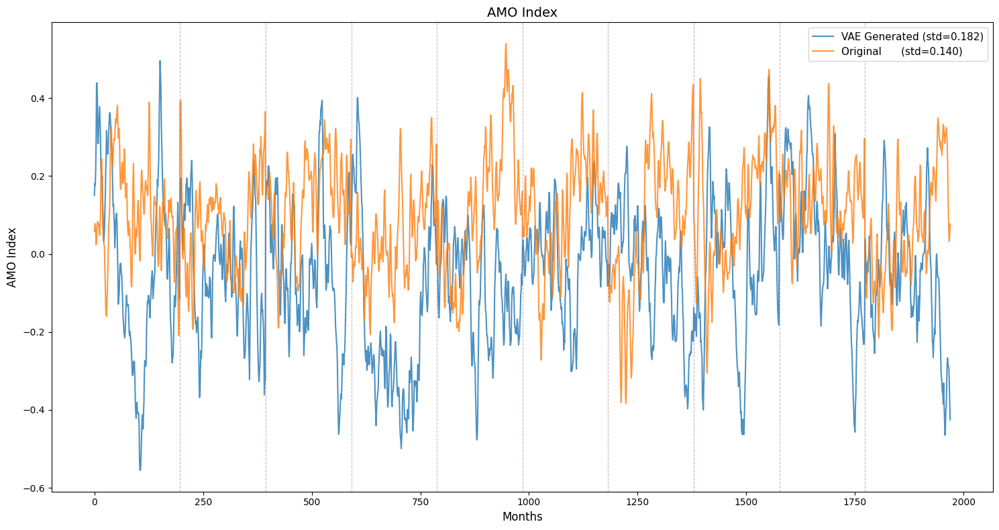

Mean bias (obs - gen): 0.1470


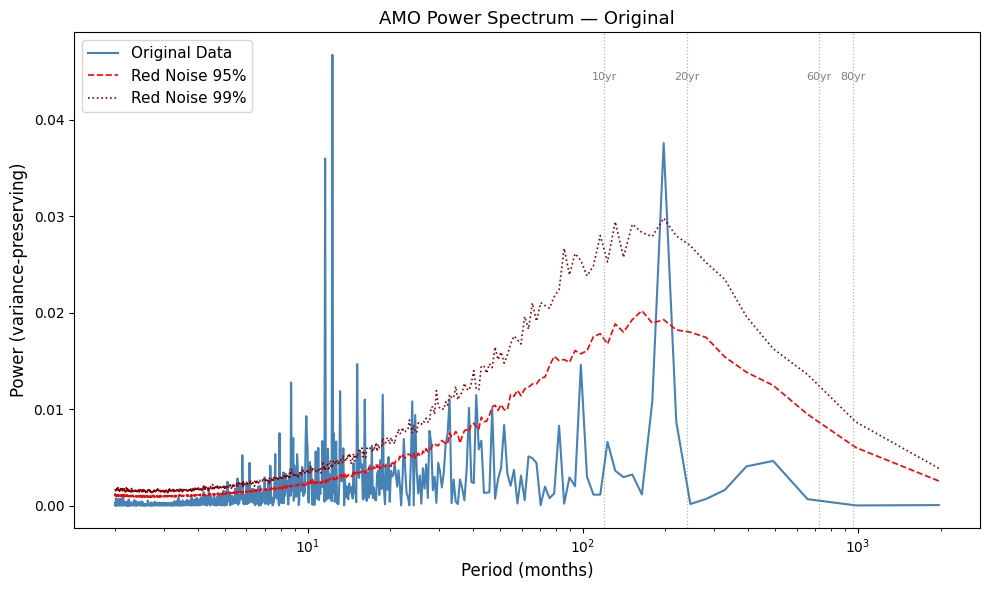

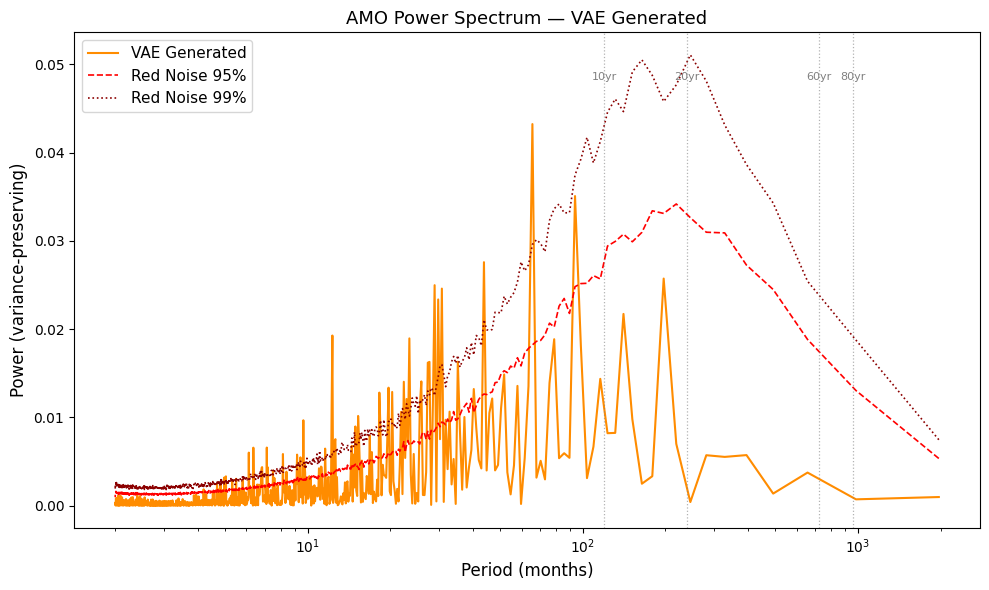

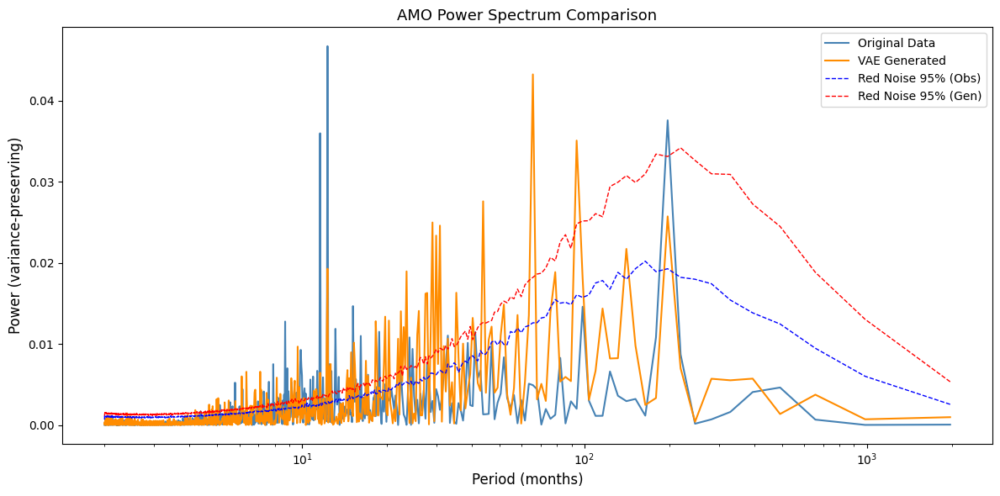

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
import pandas as pd



AMO_gen = (
    vae_anom_ds_3mo_avg
    .sel(lat=slice(0.0, 70.0), lon=slice(290, 353))['sst']
    .mean(['lat', 'lon'])
)



AMO_obs = (
    ori_anom_ds_3mo_avg
    .sel(lat=slice(0.0, 70.0), lon=slice(290, 353))['sst']
    .mean(['lat', 'lon'])
)

print("AMO_gen shape:", AMO_gen.shape)
print("AMO_obs shape:", AMO_obs.shape)


AMO_gen_flat = AMO_gen.values.reshape(-1)
AMO_obs_flat = AMO_obs.values.reshape(-1)

n_ens_gen  = AMO_gen.shape[0]
n_time_gen = AMO_gen.shape[1]
n_ens_obs  = AMO_obs.shape[0]
n_time_obs = AMO_obs.shape[1]

print(f"Generated flat length : {len(AMO_gen_flat)}  ({n_ens_gen} ens x {n_time_gen} time)")
print(f"Observed  flat length : {len(AMO_obs_flat)}  ({n_ens_obs} ens x {n_time_obs} time)")


generated_bias = AMO_obs_flat.mean() - AMO_gen_flat.mean()
generated_std  = AMO_gen_flat.std()
obs_std        = AMO_obs_flat.std()

fig, ax = plt.subplots(figsize=(15, 8))

ax.plot(AMO_gen_flat, label=f'VAE Generated (std={generated_std:.3f})', alpha=0.8)
ax.plot(AMO_obs_flat, label=f'Original      (std={obs_std:.3f})',        alpha=0.8)

ax.set_xlabel('Months', fontsize=12)
ax.set_ylabel('AMO Index', fontsize=12)
ax.set_title('AMO Index', fontsize=14)
ax.legend(fontsize=11)


for e in range(1, n_ens_gen):
    ax.axvline(x=e * n_time_gen, color='blue', linestyle='--', alpha=0.25, linewidth=0.8)
for e in range(1, n_ens_obs):
    ax.axvline(x=e * n_time_obs, color='orange', linestyle='--', alpha=0.25, linewidth=0.8)

plt.tight_layout()
plt.savefig('AMO_index_stacked.png', dpi=300, bbox_inches='tight')
plt.show()
print(f"Mean bias (obs - gen): {generated_bias:.4f}")


def compute_power_spectrum_with_rednoise(data, nsim=1500, confidence_levels=(85, 90, 95, 99)):
    """
    Compute periodogram of `data` and Monte Carlo red-noise confidence levels.

    Parameters
    ----------
    data : 1-D numpy array
    nsim : int, number of red-noise realisations
    confidence_levels : tuple of percentiles (e.g. 95 → 95th percentile)

    Returns
    -------
    period   : array  (1/f), same length as Po
    f_Po     : array  f * Po   (variance-preserving spectrum)
    mc_bands : dict  {level: f * threshold_array}
    """
    data = np.asarray(data, dtype=np.float64)
    nd   = len(data)
    fs   = 1


    sommesup = np.sum(data[1:] * data[:-1])
    sommeinf = np.sum(data[:-1] ** 2)
    rho      = sommesup / sommeinf
    srho     = np.sqrt(max(1.0 - rho ** 2, 0.0))


    f, Po = signal.periodogram(data, fs, detrend='linear')
    npo   = len(Po)
    Ax    = Po.sum() / npo


    red_sum = np.zeros((nd, nsim))
    for i in range(nsim):
        red_sum[0, i] = rho * 0.0 + srho * np.random.randn()
        for j in range(1, nd):
            red_sum[j, i] = rho * red_sum[j - 1, i] + srho * np.random.randn()


    specred = np.zeros((npo, nsim))
    for i in range(nsim):
        sig   = red_sum[:, i]
        sig   = sig - sig.mean()
        _, Pr = signal.periodogram(sig, fs, detrend='linear')
        Ar    = Pr.sum() / len(Pr)
        if Ar > 0:
            specred[:, i] = Pr * (Ax / Ar)
        else:
            specred[:, i] = Pr


    specred_sorted = np.sort(specred, axis=1)


    with np.errstate(divide='ignore', invalid='ignore'):
        period = np.where(f > 0, 1.0 / f, np.inf)

    f_Po = f * Po

    mc_bands = {}
    for lvl in confidence_levels:
        idx = round(nsim * lvl / 100) - 1
        idx = min(max(idx, 0), nsim - 1)
        mc_bands[lvl] = f * specred_sorted[:, idx]

    return period, f_Po, mc_bands, f


period_obs, fPo_obs, mc_obs, f_obs = compute_power_spectrum_with_rednoise(
    AMO_obs_flat, nsim=1500
)

fig, ax = plt.subplots(figsize=(10, 6))

ax.plot(period_obs, fPo_obs,        label='Original Data',    color='steelblue',  linewidth=1.5)
ax.plot(period_obs, mc_obs[95],     label='Red Noise 95%',    color='red',        linewidth=1.2, linestyle='--')
ax.plot(period_obs, mc_obs[99],     label='Red Noise 99%',    color='darkred',    linewidth=1.2, linestyle=':')

ax.set_xscale('log')
ax.set_xlabel('Period (months)', fontsize=12)
ax.set_ylabel('Power (variance-preserving)', fontsize=12)
ax.set_title('AMO Power Spectrum — Original', fontsize=13)
ax.legend(fontsize=11)


for p_yr in [10, 20, 60, 80]:
    p_mo = p_yr * 12
    if period_obs[period_obs < np.inf].min() < p_mo < period_obs[period_obs < np.inf].max():
        ax.axvline(x=p_mo, color='grey', linestyle=':', alpha=0.6, linewidth=0.9)
        ax.text(p_mo, ax.get_ylim()[1] * 0.9, f'{p_yr}yr',
                ha='center', fontsize=8, color='grey')

plt.tight_layout()
plt.savefig('AMO_PowerSpectrum_original.png', dpi=300, bbox_inches='tight')
plt.show()


period_gen, fPo_gen, mc_gen, f_gen = compute_power_spectrum_with_rednoise(
    AMO_gen_flat, nsim=1500
)

fig, ax = plt.subplots(figsize=(10, 6))

ax.plot(period_gen, fPo_gen,        label='VAE Generated',    color='darkorange', linewidth=1.5)
ax.plot(period_gen, mc_gen[95],     label='Red Noise 95%',    color='red',        linewidth=1.2, linestyle='--')
ax.plot(period_gen, mc_gen[99],     label='Red Noise 99%',    color='darkred',    linewidth=1.2, linestyle=':')

ax.set_xscale('log')
ax.set_xlabel('Period (months)', fontsize=12)
ax.set_ylabel('Power (variance-preserving)', fontsize=12)
ax.set_title('AMO Power Spectrum — VAE Generated', fontsize=13)
ax.legend(fontsize=11)

for p_yr in [10, 20, 60, 80]:
    p_mo = p_yr * 12
    if period_gen[period_gen < np.inf].min() < p_mo < period_gen[period_gen < np.inf].max():
        ax.axvline(x=p_mo, color='grey', linestyle=':', alpha=0.6, linewidth=0.9)
        ax.text(p_mo, ax.get_ylim()[1] * 0.9, f'{p_yr}yr',
                ha='center', fontsize=8, color='grey')

plt.tight_layout()
plt.savefig('AMO_PowerSpectrum_generated.png', dpi=300, bbox_inches='tight')
plt.show()


fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(period_obs, fPo_obs,    label='Original Data',    color='steelblue',  linewidth=1.5)
ax.plot(period_gen, fPo_gen,    label='VAE Generated',    color='darkorange', linewidth=1.5)
ax.plot(period_obs, mc_obs[95], label='Red Noise 95% (Obs)', color='blue',    linewidth=1.0, linestyle='--')
ax.plot(period_gen, mc_gen[95], label='Red Noise 95% (Gen)', color='red',     linewidth=1.0, linestyle='--')

ax.set_xscale('log')
ax.set_xlabel('Period (months)', fontsize=12)
ax.set_ylabel('Power (variance-preserving)', fontsize=12)
ax.set_title('AMO Power Spectrum Comparison', fontsize=13)
ax.legend(fontsize=10)

plt.tight_layout()
plt.savefig('AMO_PowerSpectrum_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

Generated AMO shape: (10, 197)
Observed AMO shape: (10, 197)
 Generated AMO length: 1970
 Observed AMO length: 1970

=== Statistics ===
Generated: mean = -0.0485, std = 0.1825
Observed:  mean = 0.0986, std = 0.1398
Bias (Obs - Gen): 0.1470


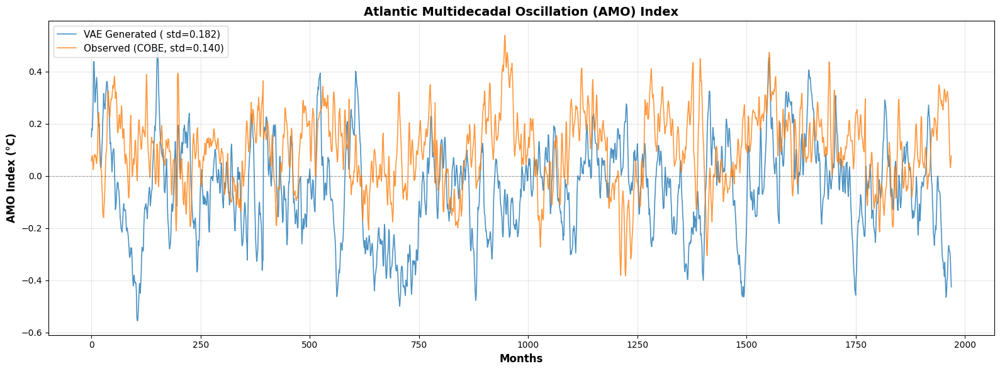

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
import pandas as pd


def compute_amo_ensemble(ds, lat_range=[0.0, 70.0], lon_range=[290, 353]):
    """
    Compute AMO index for each ensemble member.

    Args:
        ds: xarray Dataset with dims [ensemble, time, lat, lon]
        lat_range: [lat_min, lat_max]
        lon_range: [lon_min, lon_max]

    Returns:
        amo: numpy array of shape (num_ensembles, num_timesteps)
    """

    ds_amo_region = ds.sel(lat=slice(lat_range[0], lat_range[1]),
                           lon=slice(lon_range[0], lon_range[1]))


    amo = ds_amo_region['sst'].mean(['lat', 'lon']).values

    return amo



AMO_gen_ensemble = compute_amo_ensemble(vae_anom_ds_3mo_avg,
                                        lat_range=[0.0, 70.0],
                                        lon_range=[290, 353])


AMO_obs_ensemble = compute_amo_ensemble(ori_anom_ds_3mo_avg,
                                        lat_range=[0.0, 70.0],
                                        lon_range=[290, 353])

print(f"Generated AMO shape: {AMO_gen_ensemble.shape}")
print(f"Observed AMO shape: {AMO_obs_ensemble.shape}")


AMO_gen_stacked = AMO_gen_ensemble.flatten()
AMO_obs_stacked = AMO_obs_ensemble.flatten()

print(f" Generated AMO length: {len(AMO_gen_stacked)}")
print(f" Observed AMO length: {len(AMO_obs_stacked)}")


n_obs = AMO_obs_stacked.shape[0]


gen_mean = AMO_gen_stacked[:n_obs].mean()
gen_std = AMO_gen_stacked.std()

obs_mean = AMO_obs_stacked.mean()
obs_std = AMO_obs_stacked.std()

gen_bias = obs_mean - gen_mean

print(f"\n=== Statistics ===")
print(f"Generated: mean = {gen_mean:.4f}, std = {gen_std:.4f}")
print(f"Observed:  mean = {obs_mean:.4f}, std = {obs_std:.4f}")
print(f"Bias (Obs - Gen): {gen_bias:.4f}")



fig, ax = plt.subplots(figsize=(16, 6))


ax.plot(AMO_gen_stacked, linewidth=1.2, alpha=0.8,
        label=f'VAE Generated ( std={gen_std:.3f})')


ax.plot(AMO_obs_stacked, linewidth=1.2, alpha=0.8,
        label=f'Observed (COBE, std={obs_std:.3f})')

ax.axhline(y=0, color='k', linestyle='--', linewidth=0.8, alpha=0.3)
ax.set_xlabel('Months', fontsize=12, fontweight='bold')
ax.set_ylabel('AMO Index (°C)', fontsize=12, fontweight='bold')
ax.set_title('Atlantic Multidecadal Oscillation (AMO) Index',
             fontsize=14, fontweight='bold')
ax.legend(fontsize=11, loc='upper left')
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('AMO_index_timeseries.png', dpi=300, bbox_inches='tight')
plt.show()